In [2]:
"""Backend supported: tensorflow.compat.v1, tensorflow, pytorch, paddle"""

# Import tf if using backend tensorflow.compat.v1 or tensorflow
from deepxde.backend import tf
import deepxde as dde
import numpy as np
from scipy.interpolate import griddata
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import random


Using backend: tensorflow.compat.v1



Instructions for updating:
non-resource variables are not supported in the long term



In [3]:
def generate_evolution_model(a, domain, boundary, width, depth, rate, epochs, sprinkle):

    def pde(x, y):
        dy_xx = dde.grad.hessian(y, x, i=0, j=0)
        dy_tt = dde.grad.hessian(y, x, i=1, j=1)
        return dy_tt - dy_xx


    def analytic_solution(x, t):
        return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
    

    
    main_domain = dde.geometry.Rectangle([0,0],[1,1])
    excision_mask = dde.geometry.Polygon([[0,0], [0, a], [1-a, 1], [1,1], [1, 1-a], [a, 0]])
    geom = main_domain - excision_mask


    ic = dde.icbc.DirichletBC(
        geom,
        lambda x: 1 + a/(x[:, 0:1]),
        lambda x, on_boundary:  np.isclose(x[1], 0),
    )

        
    dic = dde.icbc.OperatorBC(
        geom,
        lambda x, y, _: dde.grad.jacobian(y, x, i=0, j=1),
        lambda _, on_initial: on_initial,)

    
    if sprinkle == 0:
    
    
        data = dde.data.PDE(
            geom, pde, [ic,dic], num_domain=500, num_boundary=500)


    # Set the seed
    seed_value = 1
    random.seed(seed_value)

    # Generate random numbers between 0.1 and 0.9
    random_x1 = random.uniform(0.1, 0.9)
    random_x2 = random.uniform(0.1, 0.9)
    random_x3 = random.uniform(0.1, 0.9)
    
    random_t1 = random.uniform(0.1, 0.9)
    random_t2 = random.uniform(0.1, 0.9)
    random_t3 = random.uniform(0.1, 0.9)
        
        
    if sprinkle == 1:
    
        
        point_1 = np.array([random_x1, random_t1])
        value_1 = analytic_solution(random_x1, random_t1)
        sprinkle_1 = dde.icbc.PointSetBC(point_1, value_1)
    
    
        data = dde.data.PDE(
            geom, pde, [ic, dic, sprinkle_1], num_domain=500, num_boundary=500)


        
    if sprinkle == 2:
    
        point_1 = np.array([random_x1, random_t1])
        value_1 = analytic_solution(random_x1, random_t1)
        sprinkle_1 = dde.icbc.PointSetBC(point_1, value_1)
    
        point_2 = np.array([random_x2, random_t2])
        value_2 = analytic_solution(random_x2, random_t2)
        sprinkle_2 = dde.icbc.PointSetBC(point_2, value_2)
    
    
    
        data = dde.data.PDE(
            geom, pde, [ic,dic, sprinkle_1, sprinkle_2], num_domain=500, num_boundary=500)


        
    if sprinkle == 3:
    


        point_1 = np.array([random_x1, random_t1])
        value_1 = analytic_solution(random_x1, random_t1)
        sprinkle_1 = dde.icbc.PointSetBC(point_1, value_1)
    
        point_2 = np.array([random_x2, random_t2])
        value_2 = analytic_solution(random_x2, random_t2)
        sprinkle_2 = dde.icbc.PointSetBC(point_2, value_2)
    
    
        point_3 = np.array([random_x3, random_t3])
        value_3 = analytic_solution(random_x3, random_t3)
        sprinkle_3 = dde.icbc.PointSetBC(point_3, value_3)
    
    
        data = dde.data.PDE(
            geom, pde, [ic, dic, sprinkle_1, sprinkle_2, sprinkle_3], num_domain=500, num_boundary=500)

    
    
    net = dde.nn.FNN([2] + [width] * depth + [1], "tanh", "Glorot normal")


    model = dde.Model(data, net)
    model.compile("adam", lr=rate)
    losshistory, train_state = model.train(iterations=epochs)
    dde.saveplot(losshistory, train_state, issave=True, isplot=True)

    return model
    
    

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from scipy.interpolate import griddata

def plot_evolution_model(a, model):
    def analytic_solution(x, t):
        return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
    
    x = np.linspace(0, 1, 256)
    t = np.linspace(0, 1, 256)
    X, T = np.meshgrid(x, t)

    X_star = np.hstack((X.flatten()[:, None], T.flatten()[:, None]))
    prediction = model.predict(X_star, operator=None)
    v = griddata(X_star, prediction[:, 0], (X, T), method="cubic")

    analytic_v = analytic_solution(X, T)
    diff = np.abs(v.T - analytic_v)

    plt.style.use("default")
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 4))

    vmax = np.percentile(v.flatten(), 90)  # Set threshold as 95th percentile of the data

    im1 = ax1.imshow(
        v.T,
        interpolation="nearest",
        cmap="inferno",
        extent=[0, 1, 0, 1],
        origin="lower",
        aspect="auto",
        vmax=vmax,
        vmin=0
    )
    # ax1.axhline(y=0.2, color='red', linestyle='--')  # Add red horizontal line at t=0.2
    # ax1.axhline(y=0.5, color='green', linestyle='--')  # Add green horizontal line at t=0.4
    # ax1.axhline(y=0.8, color='blue', linestyle='--')  # Add blue horizontal line at t=0.8
    ax1.set_title("$\psi(x,t)$")
    ax1.set_ylabel('t')
    ax1.set_xlabel('x')
    fig.colorbar(im1, ax=ax1)

    im2 = ax2.imshow(
        analytic_v,
        interpolation="nearest",
        cmap="inferno",
        extent=[0, 1, 0, 1],
        origin="lower",
        aspect="auto",
        vmax=vmax,
        vmin=0
    )
    # ax2.axhline(y=0.2, color='red', linestyle='--')  # Add red horizontal line at t=0.2
    # ax2.axhline(y=0.5, color='green', linestyle='--')  # Add green horizontal line at t=0.4
    # ax2.axhline(y=0.8, color='blue', linestyle='--')  # Add blue horizontal line at t=0.8
    ax2.set_title(r'$\psi_{a}(x,t)$')
    ax2.set_xlabel("x")
    ax2.set_ylabel('t')
    fig.colorbar(im2, ax=ax2)

    im3 = ax3.imshow(
        abs(diff),
        interpolation="nearest",
        cmap="inferno",
        extent=[0, 1, 0, 1],
        origin="lower",
        aspect="auto",
        vmax=vmax,
        vmin=0
    )
    # ax3.axhline(y=0.2, color='red', linestyle='--')  # Add red horizontal line at t=0.2
    # ax3.axhline(y=0.5, color='green', linestyle='--')  # Add green horizontal line at t=0.4
    # ax3.axhline(y=0.8, color='blue', linestyle='--')  # Add blue horizontal line at t=0.8
    ax3.set_title(r'$|\psi(x,t)-\psi_{a}(x,t)|$')
    ax3.set_xlabel("x")
    ax3.set_ylabel('t')
    fig.colorbar(im3, ax=ax3)

    inset_axes1 = inset_axes(ax1, width="30%", height="30%", loc="lower right")
    inset_axes1.imshow(
        v.T[90:110, 90:110],
        interpolation="nearest",
        cmap="inferno",
        origin="lower",
        aspect="auto",
        vmax=vmax,
        vmin=0
    )


    inset_axes2 = inset_axes(ax2, width="30%", height="30%", loc="lower right")
    inset_axes2.imshow(
        analytic_v[90:110, 90:110],
        interpolation="nearest",
        cmap="inferno",
        origin="lower",
        aspect="auto",
        vmax=vmax,
        vmin=0
    )
    

    inset_axes3 = inset_axes(ax3, width="30%", height="30%", loc="lower right")
    inset_axes3.imshow(
        abs(diff)[90:110, 90:110],
        interpolation="nearest",
        cmap="inferno",
        origin="lower",
        aspect="auto",
        vmax=vmax,
        vmin=0
    )

    
    inset_axes1.set_xticks([])
    inset_axes1.set_yticks([])

    
    inset_axes2.set_xticks([])
    inset_axes2.set_yticks([])

    
    inset_axes3.set_xticks([])
    inset_axes3.set_yticks([])

   

    fig.tight_layout()
    plt.show()

    return analytic_v, v, diff


In [5]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from scipy.interpolate import griddata

def plot_evolution_model_sliced(a, model):
    def analytic_solution(x, t):
        return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
    
    x = np.linspace(0, 1, 256)
    t = np.linspace(0, 1, 256)
    X, T = np.meshgrid(x, t)

    X_star = np.hstack((X.flatten()[:, None], T.flatten()[:, None]))
    prediction = model.predict(X_star, operator=None)
    v = griddata(X_star, prediction[:, 0], (X, T), method="cubic")

    analytic_v = analytic_solution(X, T)
    diff = np.abs(v.T - analytic_v)

    plt.style.use("default")
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 4))

    vmax = np.percentile(v.flatten(), 90)  # Set threshold as 95th percentile of the data

    im1 = ax1.imshow(
        v.T,
        interpolation="nearest",
        cmap="inferno",
        extent=[0, 1, 0, 1],
        origin="lower",
        aspect="auto",
        vmax=vmax,
        vmin=0
    )
    ax1.axhline(y=0.2, color='red', linestyle='--')  # Add red horizontal line at t=0.2
    ax1.axhline(y=0.5, color='green', linestyle='--')  # Add green horizontal line at t=0.4
    ax1.axhline(y=0.8, color='blue', linestyle='--')  # Add blue horizontal line at t=0.8
    ax1.set_title("$\psi(x,t)$")
    ax1.set_ylabel('t')
    ax1.set_xlabel('x')
    fig.colorbar(im1, ax=ax1)

    im2 = ax2.imshow(
        analytic_v,
        interpolation="nearest",
        cmap="inferno",
        extent=[0, 1, 0, 1],
        origin="lower",
        aspect="auto",
        vmax=vmax,
        vmin=0
    )
    ax2.axhline(y=0.2, color='red', linestyle='--')  # Add red horizontal line at t=0.2
    ax2.axhline(y=0.5, color='green', linestyle='--')  # Add green horizontal line at t=0.4
    ax2.axhline(y=0.8, color='blue', linestyle='--')  # Add blue horizontal line at t=0.8
    ax2.set_title(r'$\psi_{a}(x,t)$')
    ax2.set_xlabel("x")
    ax2.set_ylabel('t')
    fig.colorbar(im2, ax=ax2)

    im3 = ax3.imshow(
        abs(diff),
        interpolation="nearest",
        cmap="inferno",
        extent=[0, 1, 0, 1],
        origin="lower",
        aspect="auto",
        vmax=vmax,
        vmin=0
    )
    ax3.axhline(y=0.2, color='red', linestyle='--')  # Add red horizontal line at t=0.2
    ax3.axhline(y=0.5, color='green', linestyle='--')  # Add green horizontal line at t=0.4
    ax3.axhline(y=0.8, color='blue', linestyle='--')  # Add blue horizontal line at t=0.8
    ax3.set_title(r'$|\psi(x,t)-\psi_{a}(x,t)|$')
    ax3.set_xlabel("x")
    ax3.set_ylabel('t')
    fig.colorbar(im3, ax=ax3)

    inset_axes1 = inset_axes(ax1, width="30%", height="30%", loc="lower right")
    inset_axes1.imshow(
        v.T[90:110, 90:110],
        interpolation="nearest",
        cmap="inferno",
        origin="lower",
        aspect="auto",
        vmax=vmax,
        vmin=0
    )


    inset_axes2 = inset_axes(ax2, width="30%", height="30%", loc="lower right")
    inset_axes2.imshow(
        analytic_v[90:110, 90:110],
        interpolation="nearest",
        cmap="inferno",
        origin="lower",
        aspect="auto",
        vmax=vmax,
        vmin=0
    )
    

    inset_axes3 = inset_axes(ax3, width="30%", height="30%", loc="lower right")
    inset_axes3.imshow(
        abs(diff)[90:110, 90:110],
        interpolation="nearest",
        cmap="inferno",
        origin="lower",
        aspect="auto",
        vmax=vmax,
        vmin=0
    )

    
    inset_axes1.set_xticks([])
    inset_axes1.set_yticks([])

    
    inset_axes2.set_xticks([])
    inset_axes2.set_yticks([])

    
    inset_axes3.set_xticks([])
    inset_axes3.set_yticks([])

   

    fig.tight_layout()
    plt.show()

    return analytic_v, v, diff


In [6]:
# Plot the difference as a 1D line plot
def plot_evolution_slice(a, t, analytic_v, v, diff):
    # Define the x-axis values
    x = np.linspace(0, 1, len(diff))

    # Set the threshold value
    threshold = 50

    # Create a Figure and Axes
    fig, ax = plt.subplots()
    
    ax.fill_between(x, 0, 10, where=(x >= t - a) & (x <= t + a), alpha=0.9, color='black')
    # ax.text(t, .5, "Excised Region", ha='center', va='center', color = 'white')

    t = round(t * 255)
    
    ax.plot(x, abs(v.T[:, t]), 'k-', label="PINN Solution")
    ax.plot(x, abs(analytic_v[:, t]), 'k--', label="Analytic Solution")
    ax.plot(x, np.where((abs((v.T[:, t] - analytic_v[:, t]))) < threshold,
                        (abs((v.T[:, t] - analytic_v[:, t]))), np.nan),
            'k:', label="Absolute Error")

    # Set the title and labels
    # ax.set_title("PINN-excised solutions")
    ax.set_xlabel("x")
    ax.set_ylim(0, 3)
    # Add a legend
    legend = ax.legend(fontsize=7)

    # Show the plot
    plt.show()


# Sprinkling Time

In [7]:
lr = 1e-1
iterations = 10000
sample_size = 10
throat = 0.01

In [8]:


analytic_v_0 = 0
analytic_v_1 = 0
analytic_v_2 = 0
analytic_v_3 = 0

v_0 = 0
v_1 = 0
v_2 = 0
v_3 = 0

diff_0 = 0
diff_1 = 0
diff_2 = 0
diff_3 = 0

# N=0

Compiling model...
Building feed-forward neural network...
'build' took 0.086692 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.927263 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [4.78e-02, 1.53e+00, 1.72e-03]    [4.78e-02, 1.53e+00, 1.72e-03]    []  
1000      [4.29e-05, 5.20e-02, 1.35e-03]    [4.29e-05, 5.20e-02, 1.35e-03]    []  
2000      [9.61e-07, 6.35e-02, 2.12e-07]    [9.61e-07, 6.35e-02, 2.12e-07]    []  
3000      [1.90e-06, 6.35e-02, 8.64e-08]    [1.90e-06, 6.35e-02, 8.64e-08]    []  
4000      [9.23e-08, 6.35e-02, 7.50e-09]    [9.23e-08, 6.35e-02, 7.50e-09]    []  
5000      [3.10e-08, 6.35e-02, 3.31e-09]    [3.10e-08, 6.35e-02, 3.31e-09]    []  
6000      [1.37e-08, 6.36e-02, 1.85e-09]    [1.37e-08, 6.36e-02, 1.85e-09]    []  
7000      [6.75e-09, 6.35e-02, 1.16e-09]    [6.75e-09, 6.35e-02, 1.16e-09]    []  
8000      [3.64e-09, 6.35e-02, 8.16e-10]    [3.64e-09, 6.35e-02, 8.16e-10]    []  
9000      [2.44e-09, 6.35e-02, 6.86e-10]    [2.44e-09, 6.35e-02, 6.86e-10]    []  
10000   

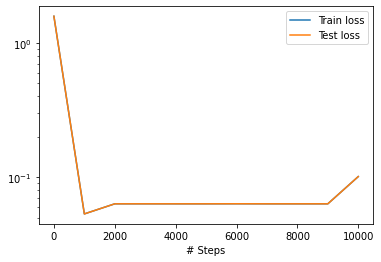

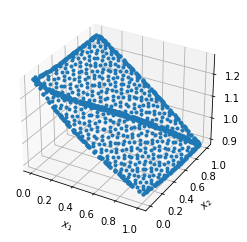

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


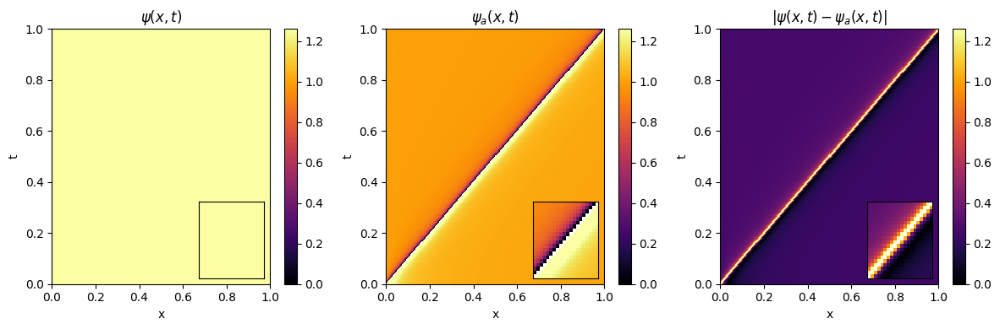

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


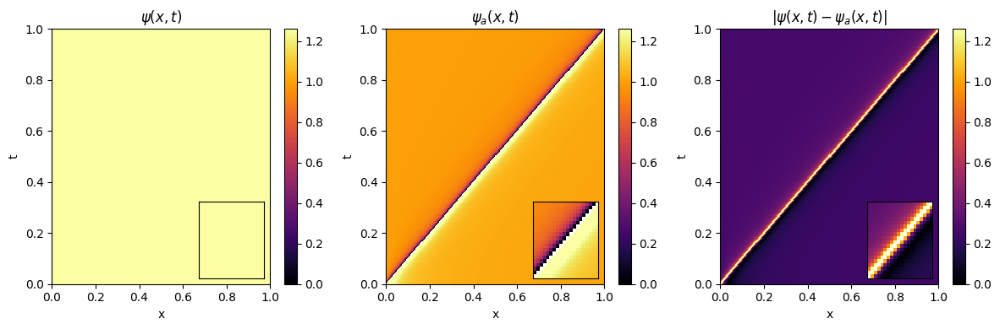

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


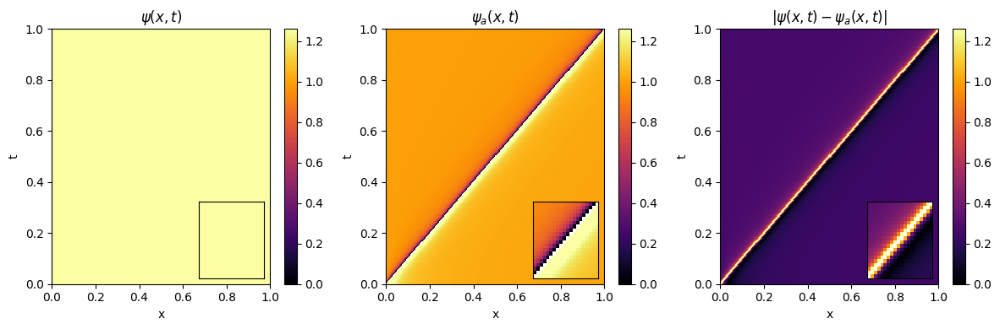

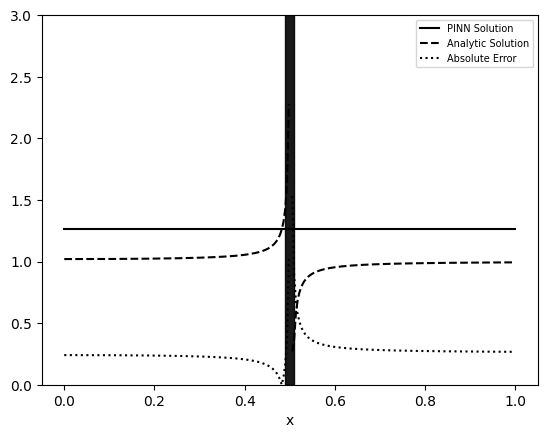

Compiling model...
Building feed-forward neural network...
'build' took 0.104263 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.156719 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [8.53e-05, 1.08e+00, 8.53e-04]    [8.53e-05, 1.08e+00, 8.53e-04]    []  
1000      [3.19e-05, 3.37e-03, 2.12e-05]    [3.19e-05, 3.37e-03, 2.12e-05]    []  
2000      [7.39e-06, 2.78e-03, 5.26e-05]    [7.39e-06, 2.78e-03, 5.26e-05]    []  
3000      [2.04e-05, 2.81e-03, 6.87e-05]    [2.04e-05, 2.81e-03, 6.87e-05]    []  
4000      [1.84e-12, 4.29e-03, 1.03e-12]    [1.84e-12, 4.29e-03, 1.03e-12]    []  
5000      [3.76e-12, 4.29e-03, 2.07e-12]    [3.76e-12, 4.29e-03, 2.07e-12]    []  
6000      [7.83e-10, 4.29e-03, 4.32e-10]    [7.83e-10, 4.29e-03, 4.32e-10]    []  
7000      [6.77e-17, 4.29e-03, 4.08e-17]    [6.77e-17, 4.29e-03, 4.08e-17]    []  
8000      [6.74e-17, 4.29e-03, 4.01e-17]    [6.74e-17, 4.29e-03, 4.01e-17]    []  
9000      [6.77e-17, 4.29e-03, 3.98e-17]    [6.77e-17, 4.29e-03, 3.98e-17]    []  
10000   

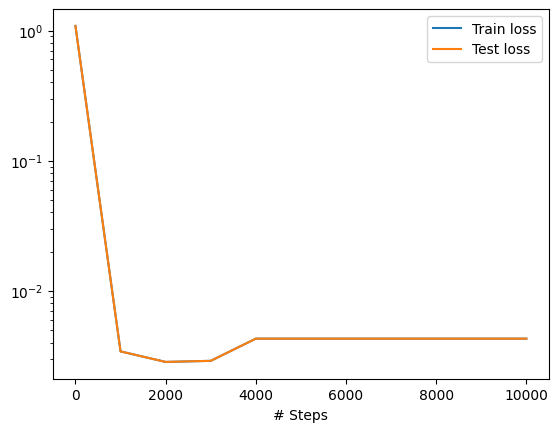

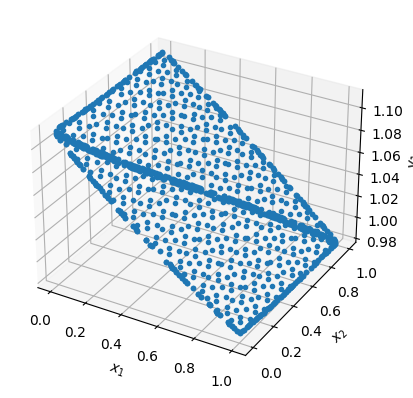

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


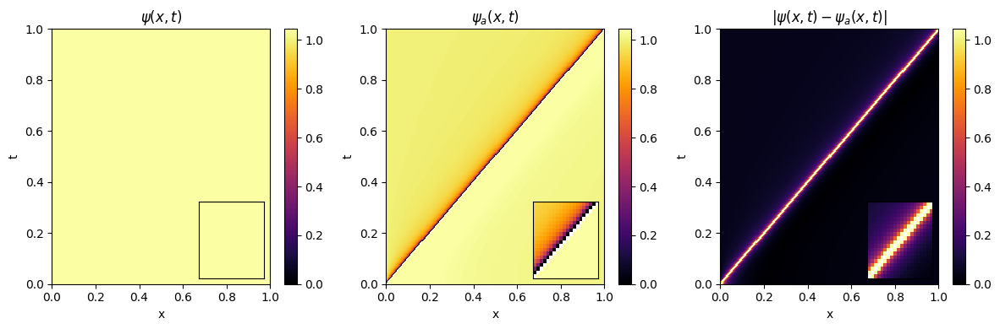

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


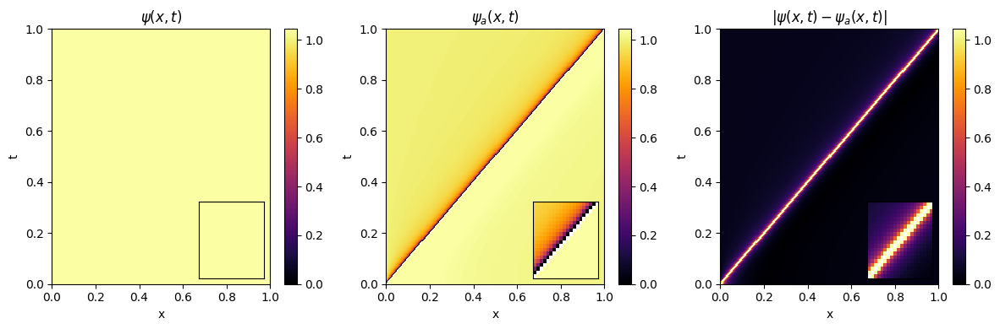

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


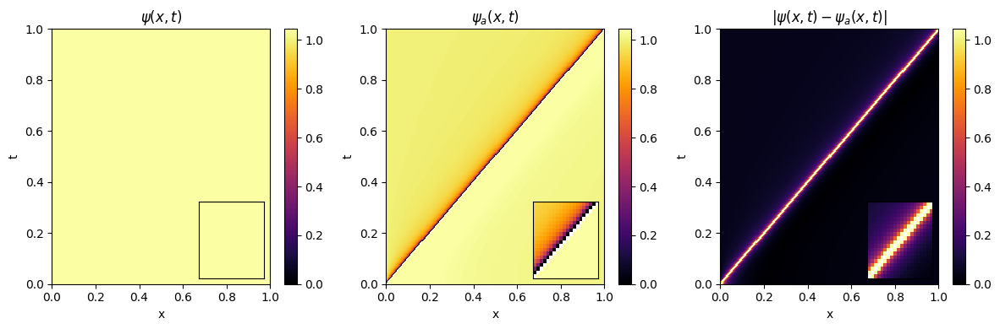

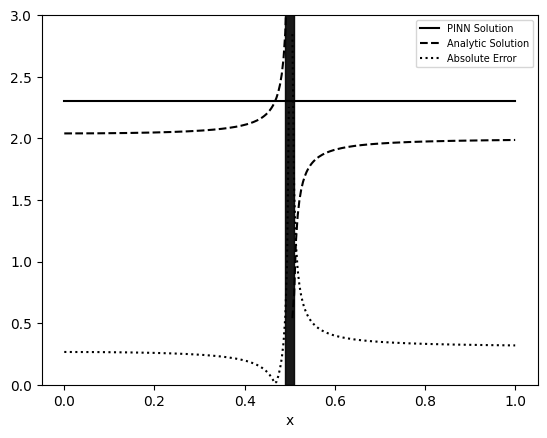

Compiling model...
Building feed-forward neural network...
'build' took 0.061090 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.733590 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [2.72e-02, 1.64e+00, 1.75e-01]    [2.72e-02, 1.64e+00, 1.75e-01]    []  
1000      [3.81e-04, 7.14e-03, 5.48e-05]    [3.81e-04, 7.14e-03, 5.48e-05]    []  
2000      [6.24e-09, 9.17e-03, 1.41e-09]    [6.24e-09, 9.17e-03, 1.41e-09]    []  
3000      [8.89e-08, 9.15e-03, 6.27e-09]    [8.89e-08, 9.15e-03, 6.27e-09]    []  
4000      [1.27e-10, 9.16e-03, 1.21e-11]    [1.27e-10, 9.16e-03, 1.21e-11]    []  
5000      [1.03e-10, 9.16e-03, 6.95e-12]    [1.03e-10, 9.16e-03, 6.95e-12]    []  
6000      [1.28e-10, 9.16e-03, 4.31e-12]    [1.28e-10, 9.16e-03, 4.31e-12]    []  
7000      [2.55e-10, 9.16e-03, 1.21e-10]    [2.55e-10, 9.16e-03, 1.21e-10]    []  
8000      [1.25e-11, 9.16e-03, 2.33e-12]    [1.25e-11, 9.16e-03, 2.33e-12]    []  
9000      [5.15e-12, 9.16e-03, 1.19e-14]    [5.15e-12, 9.16e-03, 1.19e-14]    []  
10000   

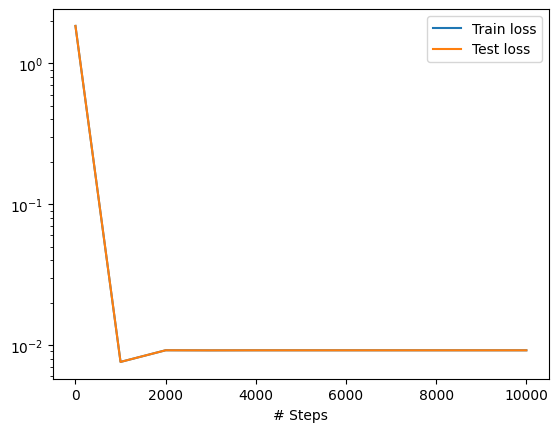

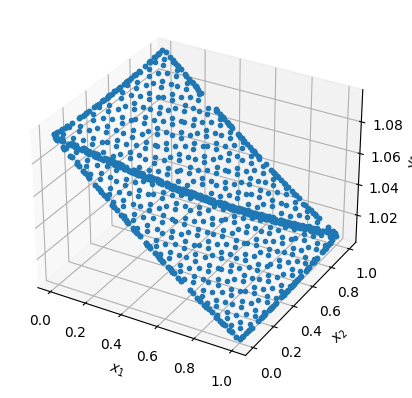

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


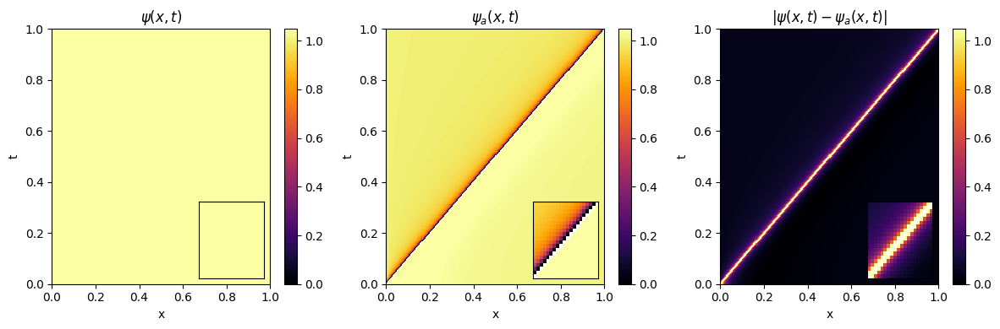

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


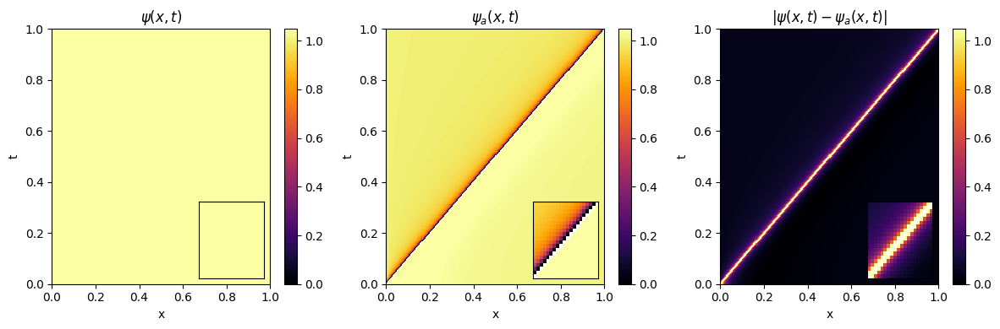

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


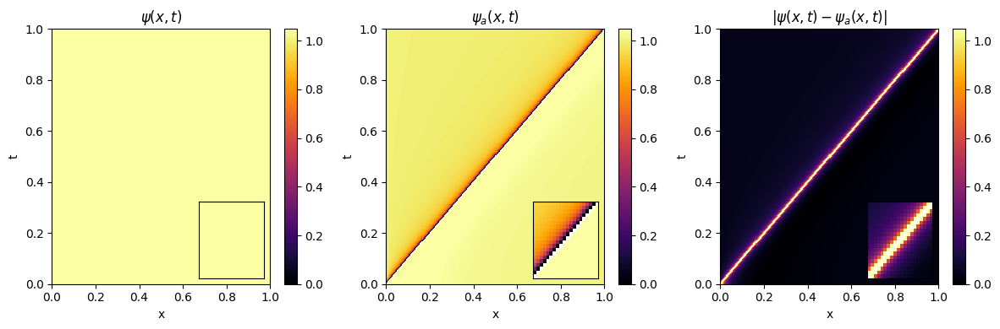

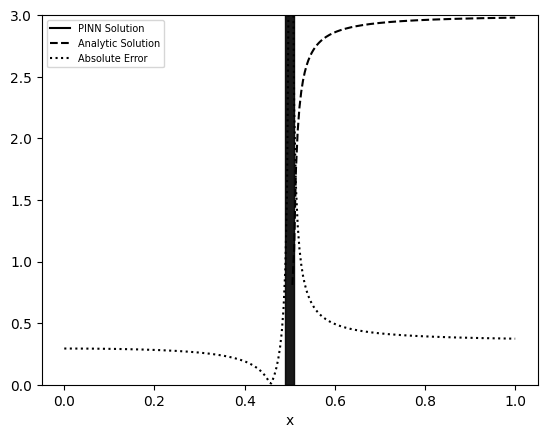

Compiling model...
Building feed-forward neural network...
'build' took 0.074562 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.937454 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [1.05e-02, 1.14e+00, 2.55e-03]    [1.05e-02, 1.14e+00, 2.55e-03]    []  
1000      [3.35e-05, 5.11e-02, 7.37e-04]    [3.35e-05, 5.11e-02, 7.37e-04]    []  
2000      [6.67e-05, 5.15e-02, 6.88e-04]    [6.67e-05, 5.15e-02, 6.88e-04]    []  
3000      [2.64e-04, 6.08e-02, 4.44e-04]    [2.64e-04, 6.08e-02, 4.44e-04]    []  
4000      [2.80e-09, 6.31e-02, 4.27e-10]    [2.80e-09, 6.31e-02, 4.27e-10]    []  
5000      [5.83e-10, 6.31e-02, 1.87e-10]    [5.83e-10, 6.31e-02, 1.87e-10]    []  
6000      [2.53e-11, 6.31e-02, 5.07e-10]    [2.53e-11, 6.31e-02, 5.07e-10]    []  
7000      [1.18e-12, 6.31e-02, 1.84e-13]    [1.18e-12, 6.31e-02, 1.84e-13]    []  
8000      [3.81e-13, 6.31e-02, 5.46e-14]    [3.81e-13, 6.31e-02, 5.46e-14]    []  
9000      [2.53e-13, 6.77e-02, 5.16e-14]    [2.53e-13, 6.77e-02, 5.16e-14]    []  
10000   

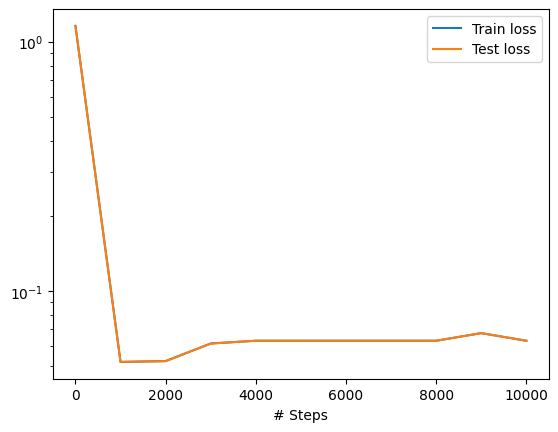

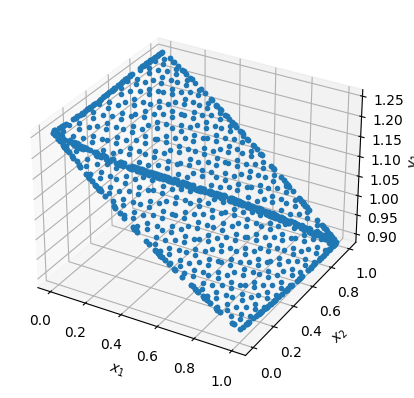

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


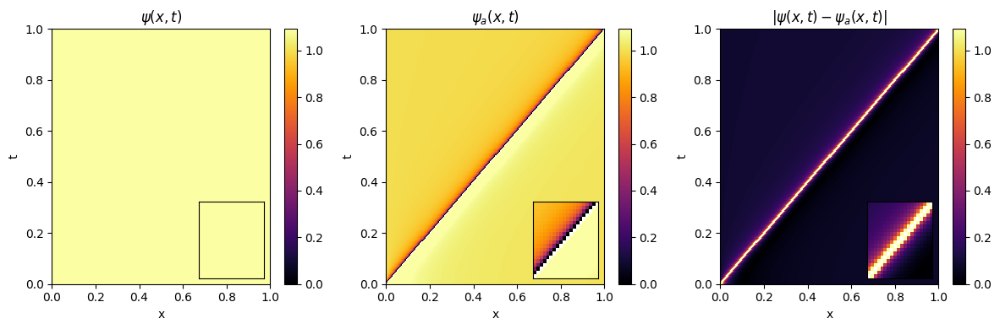

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


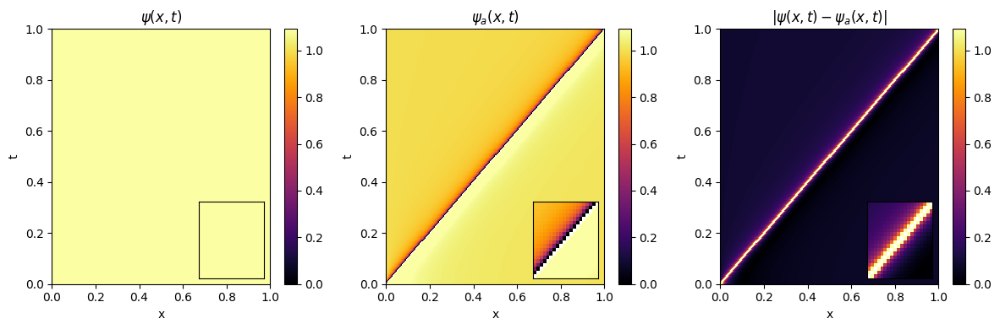

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


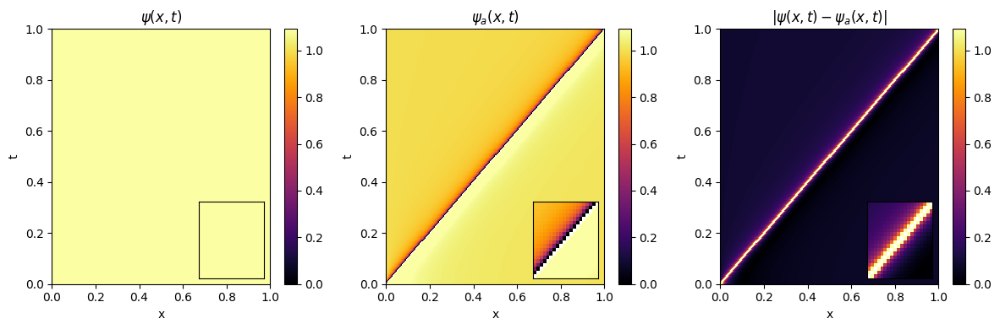

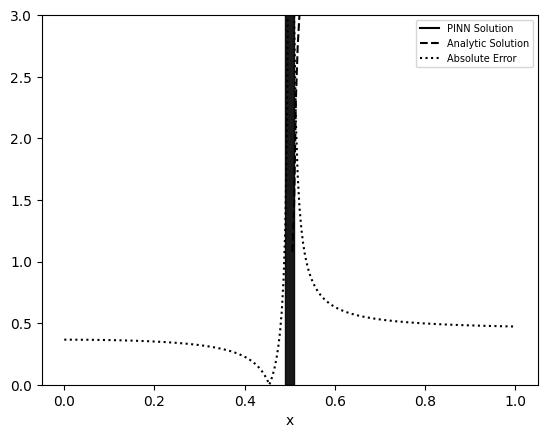

Compiling model...
Building feed-forward neural network...
'build' took 0.064511 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.742813 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [3.85e-03, 9.76e-01, 7.21e-02]    [3.85e-03, 9.76e-01, 7.21e-02]    []  
1000      [1.95e-05, 6.56e-03, 1.58e-04]    [1.95e-05, 6.56e-03, 1.58e-04]    []  
2000      [1.32e-05, 6.79e-03, 2.11e-04]    [1.32e-05, 6.79e-03, 2.11e-04]    []  
3000      [1.62e-05, 7.10e-03, 2.05e-04]    [1.62e-05, 7.10e-03, 2.05e-04]    []  
4000      [3.55e-11, 1.04e-02, 6.91e-12]    [3.55e-11, 1.04e-02, 6.91e-12]    []  
5000      [8.24e-12, 1.04e-02, 1.70e-12]    [8.24e-12, 1.04e-02, 1.70e-12]    []  
6000      [2.51e-12, 1.04e-02, 5.34e-13]    [2.51e-12, 1.04e-02, 5.34e-13]    []  
7000      [7.88e-13, 1.04e-02, 1.72e-13]    [7.88e-13, 1.04e-02, 1.72e-13]    []  
8000      [2.73e-13, 1.40e-02, 6.02e-14]    [2.73e-13, 1.40e-02, 6.02e-14]    []  
9000      [9.45e-14, 1.04e-02, 2.06e-14]    [9.45e-14, 1.04e-02, 2.06e-14]    []  
10000   

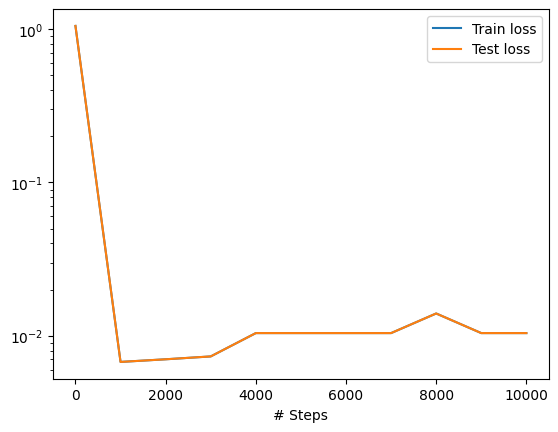

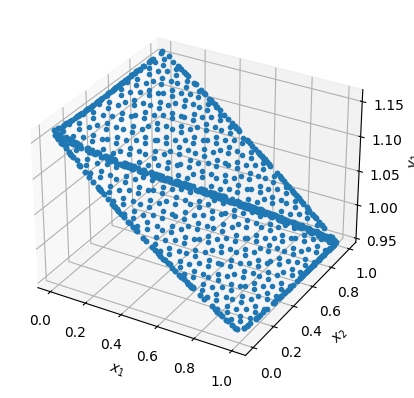

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


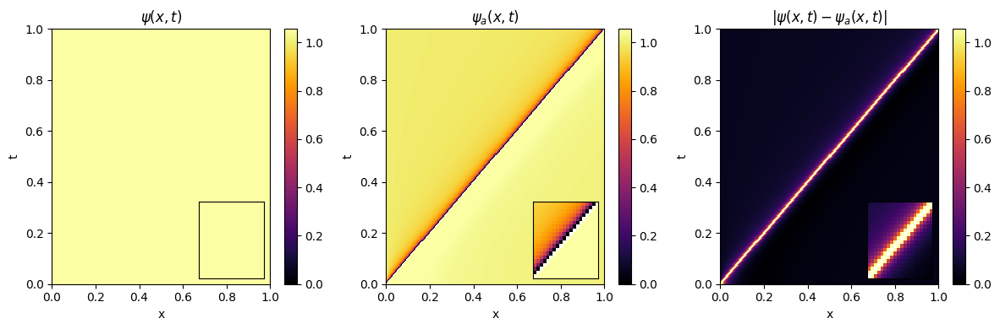

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


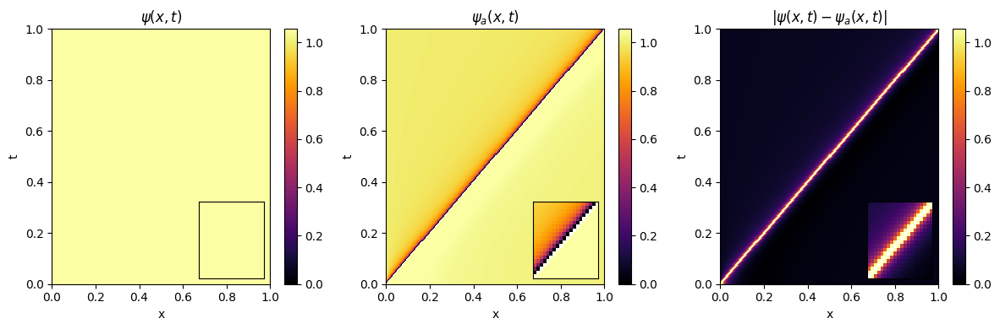

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


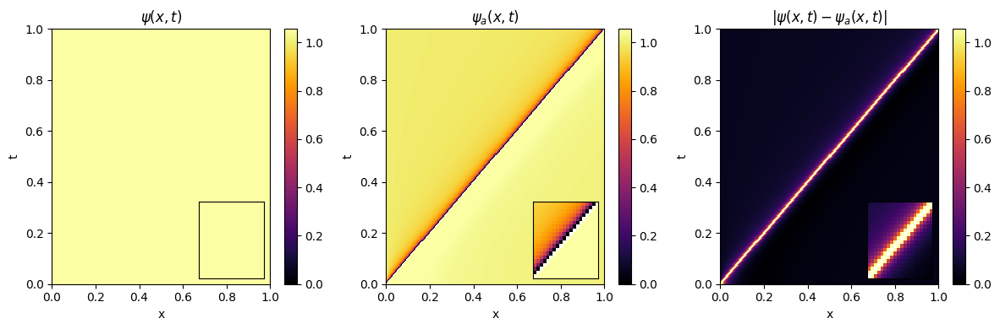

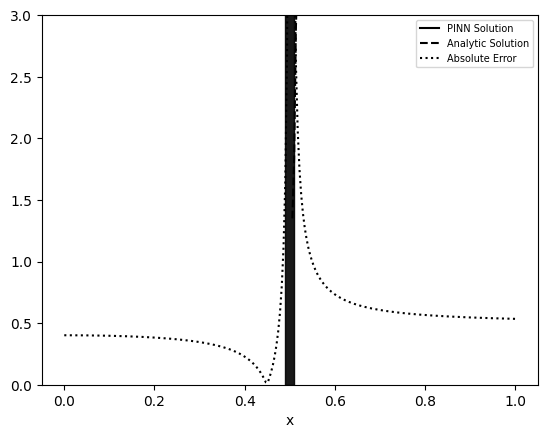

Compiling model...
Building feed-forward neural network...
'build' took 0.060976 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.829692 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [4.18e-03, 9.64e-01, 4.82e-02]    [4.18e-03, 9.64e-01, 4.82e-02]    []  
1000      [2.41e-05, 6.49e-03, 7.71e-05]    [2.41e-05, 6.49e-03, 7.71e-05]    []  
2000      [4.49e-05, 9.85e-03, 7.31e-05]    [4.49e-05, 9.85e-03, 7.31e-05]    []  
3000      [9.13e-06, 6.35e-03, 1.83e-04]    [9.13e-06, 6.35e-03, 1.83e-04]    []  
4000      [9.48e-06, 6.44e-03, 2.10e-04]    [9.48e-06, 6.44e-03, 2.10e-04]    []  
5000      [2.16e-04, 6.60e-03, 2.45e-04]    [2.16e-04, 6.60e-03, 2.45e-04]    []  
6000      [2.99e-11, 3.97e-02, 9.02e-13]    [2.99e-11, 3.97e-02, 9.02e-13]    []  
7000      [5.26e-11, 9.45e-03, 1.47e-12]    [5.26e-11, 9.45e-03, 1.47e-12]    []  
8000      [2.87e-10, 9.45e-03, 8.10e-12]    [2.87e-10, 9.45e-03, 8.10e-12]    []  
9000      [1.66e-21, 9.67e-03, 1.55e-23]    [1.66e-21, 9.67e-03, 1.55e-23]    []  
10000   

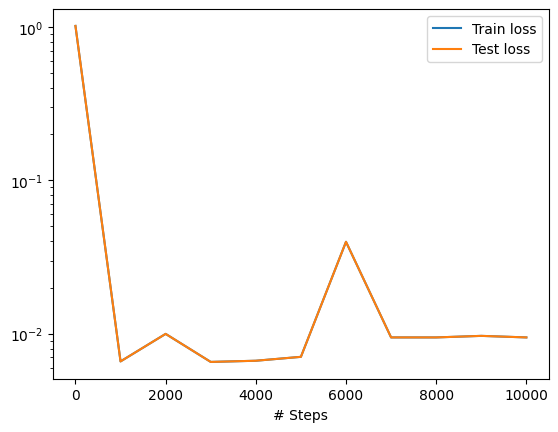

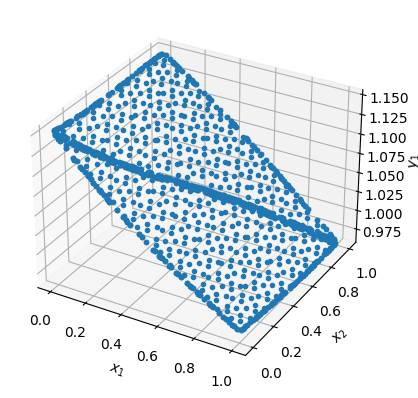

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


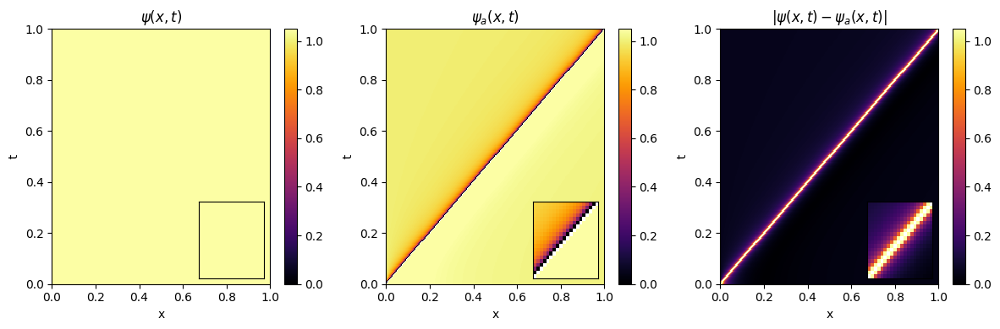

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


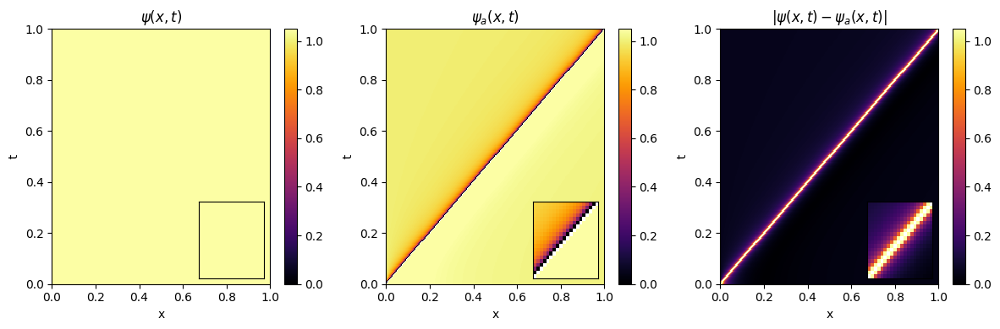

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


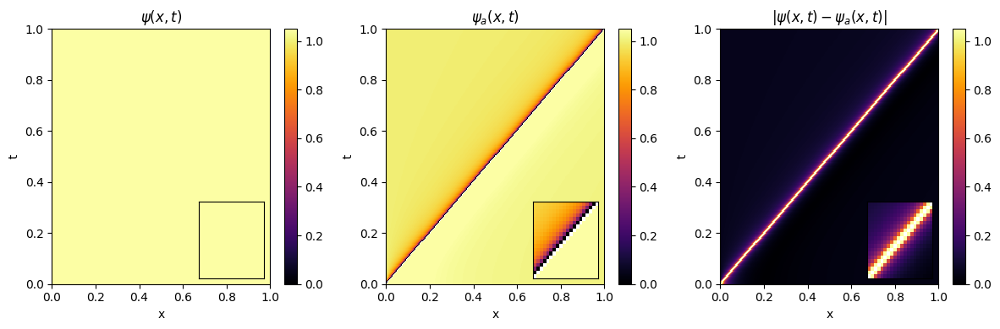

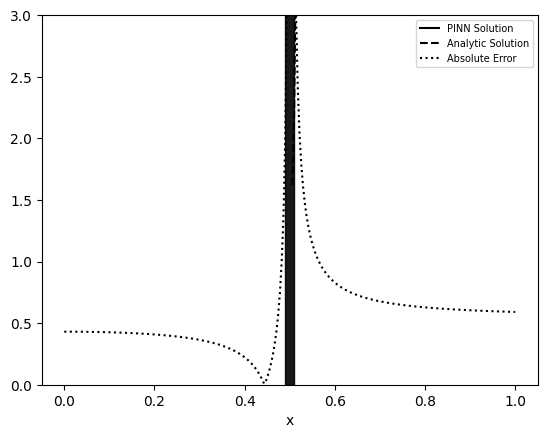

Compiling model...
Building feed-forward neural network...
'build' took 0.081965 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.097901 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [1.06e-01, 8.55e-01, 2.66e-03]    [1.06e-01, 8.55e-01, 2.66e-03]    []  
1000      [2.25e-05, 4.24e-02, 5.22e-04]    [2.25e-05, 4.24e-02, 5.22e-04]    []  
2000      [2.41e-05, 4.23e-02, 5.49e-04]    [2.41e-05, 4.23e-02, 5.49e-04]    []  
3000      [7.60e-05, 4.23e-02, 5.56e-04]    [7.60e-05, 4.23e-02, 5.56e-04]    []  
4000      [5.51e-14, 6.47e-02, 3.97e-14]    [5.51e-14, 6.47e-02, 3.97e-14]    []  
5000      [2.98e-15, 4.85e-02, 1.39e-15]    [2.98e-15, 4.85e-02, 1.39e-15]    []  
6000      [3.07e-15, 4.85e-02, 1.40e-15]    [3.07e-15, 4.85e-02, 1.40e-15]    []  
7000      [3.80e-15, 4.85e-02, 1.48e-15]    [3.80e-15, 4.85e-02, 1.48e-15]    []  
8000      [1.05e-14, 4.85e-02, 2.08e-15]    [1.05e-14, 4.85e-02, 2.08e-15]    []  
9000      [0.00e+00, 4.85e-02, 0.00e+00]    [0.00e+00, 4.85e-02, 0.00e+00]    []  
10000   

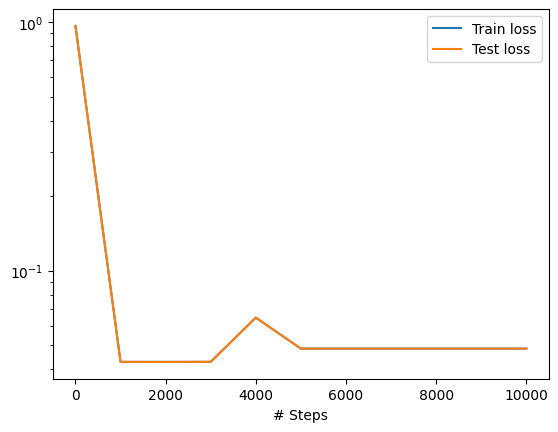

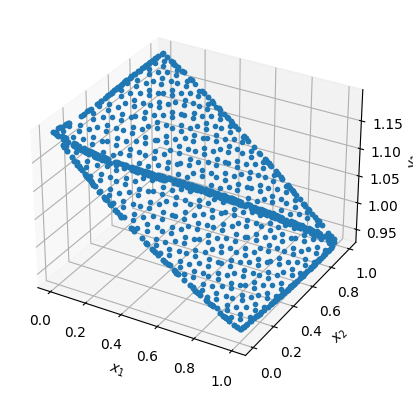

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


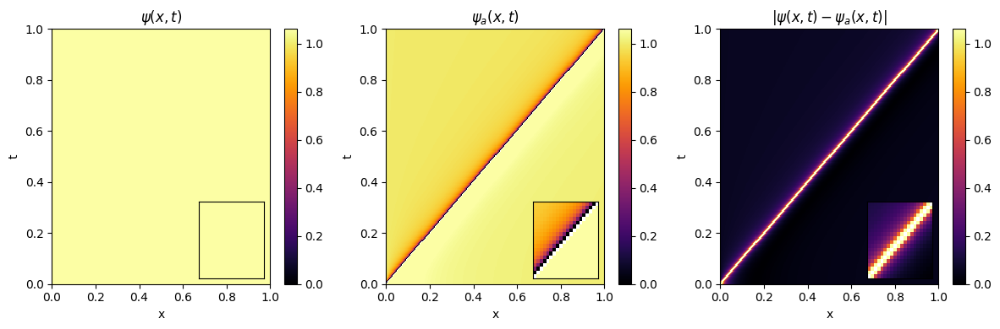

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


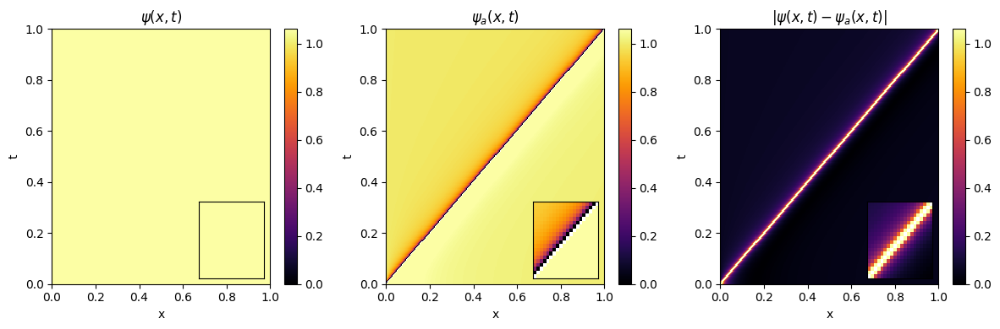

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


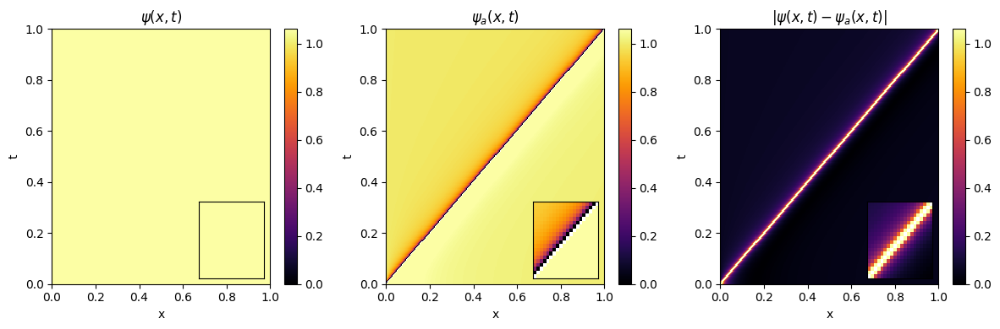

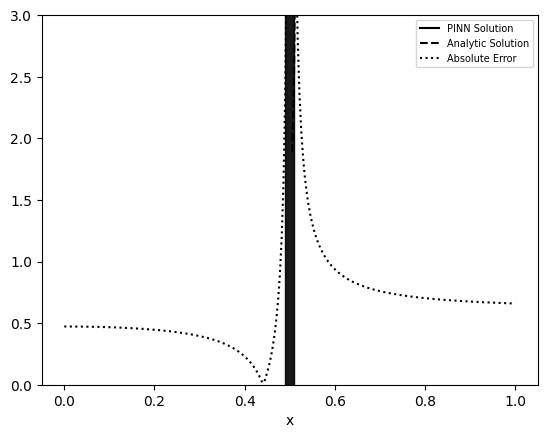

Compiling model...
Building feed-forward neural network...
'build' took 0.092726 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.339664 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [1.25e-01, 1.80e+00, 4.32e-01]    [1.25e-01, 1.80e+00, 4.32e-01]    []  
1000      [5.57e-05, 4.36e-02, 7.44e-04]    [5.57e-05, 4.36e-02, 7.44e-04]    []  
2000      [3.24e-05, 4.39e-02, 7.98e-04]    [3.24e-05, 4.39e-02, 7.98e-04]    []  
3000      [6.11e-05, 4.33e-02, 9.55e-04]    [6.11e-05, 4.33e-02, 9.55e-04]    []  
4000      [4.94e-14, 5.39e-02, 9.05e-16]    [4.94e-14, 5.39e-02, 9.05e-16]    []  
5000      [5.08e-14, 5.39e-02, 9.57e-16]    [5.08e-14, 5.39e-02, 9.57e-16]    []  
6000      [5.45e-14, 5.49e-02, 1.11e-15]    [5.45e-14, 5.49e-02, 1.11e-15]    []  
7000      [6.03e-14, 5.39e-02, 1.34e-15]    [6.03e-14, 5.39e-02, 1.34e-15]    []  
8000      [7.28e-14, 5.39e-02, 1.90e-15]    [7.28e-14, 5.39e-02, 1.90e-15]    []  
9000      [1.03e-13, 5.39e-02, 3.46e-15]    [1.03e-13, 5.39e-02, 3.46e-15]    []  
10000   

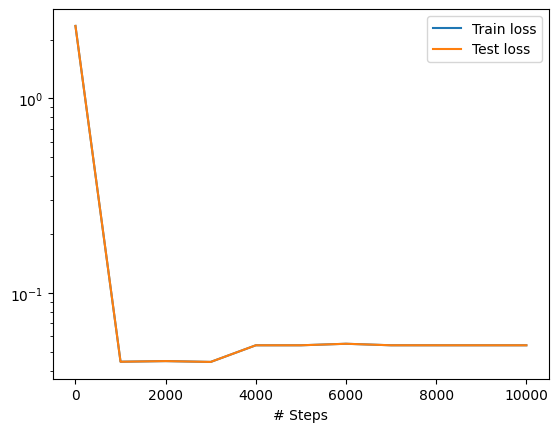

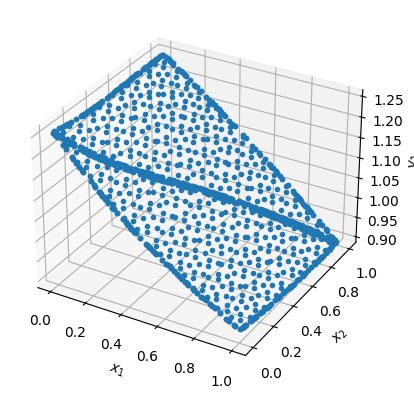

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


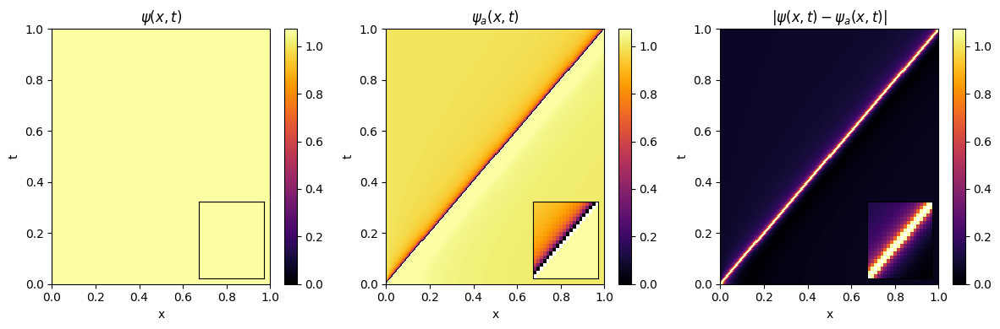

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


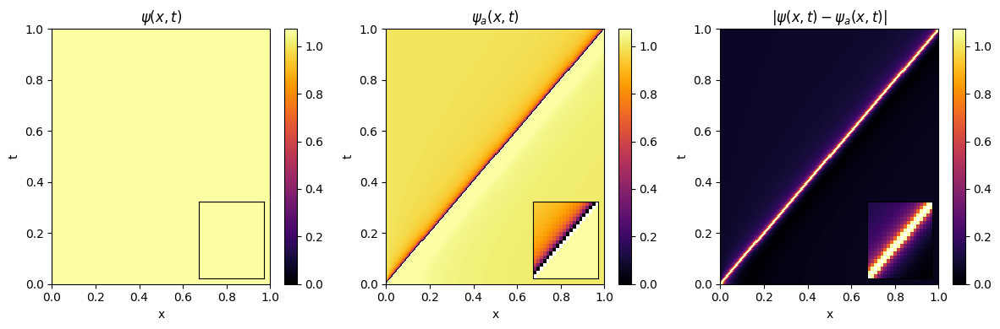

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


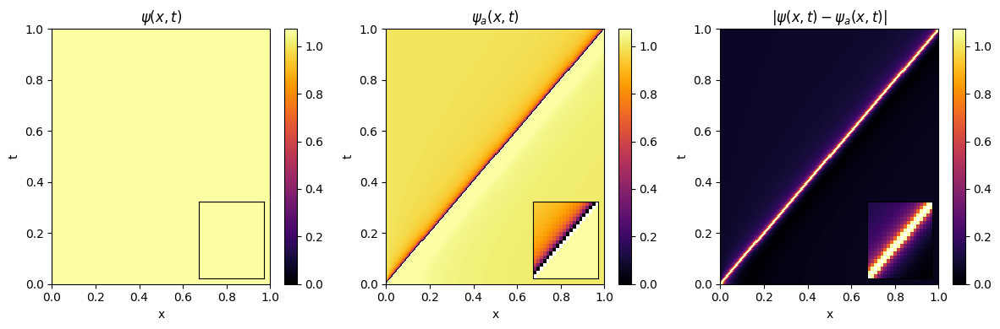

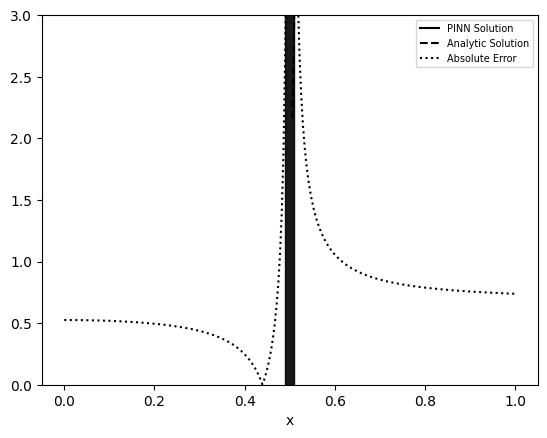

Compiling model...
Building feed-forward neural network...
'build' took 0.101669 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.226403 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [9.40e-03, 5.29e-01, 3.49e-01]    [9.40e-03, 5.29e-01, 3.49e-01]    []  
1000      [6.38e-05, 3.98e-02, 6.62e-04]    [6.38e-05, 3.98e-02, 6.62e-04]    []  
2000      [7.52e-05, 4.08e-02, 5.91e-04]    [7.52e-05, 4.08e-02, 5.91e-04]    []  
3000      [2.32e-04, 4.61e-02, 8.55e-04]    [2.32e-04, 4.61e-02, 8.55e-04]    []  
4000      [2.05e-04, 4.06e-02, 5.13e-04]    [2.05e-04, 4.06e-02, 5.13e-04]    []  
5000      [8.88e-05, 4.01e-02, 5.77e-04]    [8.88e-05, 4.01e-02, 5.77e-04]    []  
6000      [2.96e-06, 5.09e-02, 1.05e-06]    [2.96e-06, 5.09e-02, 1.05e-06]    []  
7000      [4.77e-10, 4.81e-02, 1.27e-10]    [4.77e-10, 4.81e-02, 1.27e-10]    []  
8000      [1.43e-10, 4.81e-02, 4.44e-12]    [1.43e-10, 4.81e-02, 4.44e-12]    []  
9000      [2.08e-09, 4.81e-02, 6.08e-11]    [2.08e-09, 4.81e-02, 6.08e-11]    []  
10000   

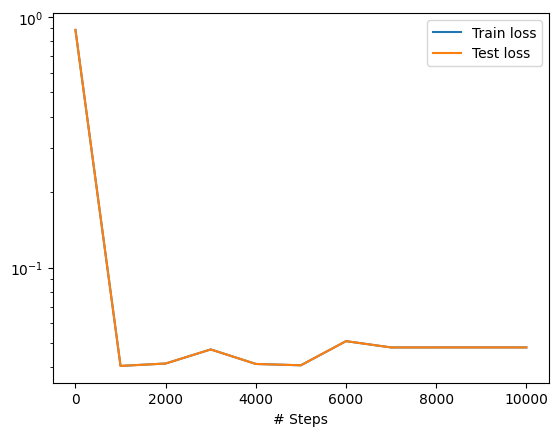

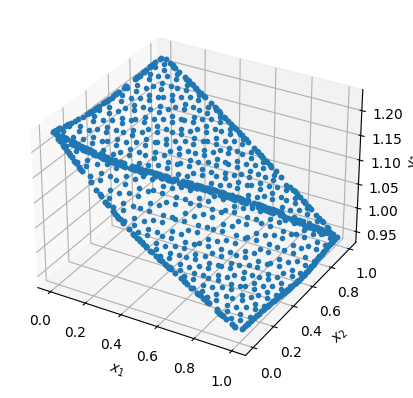

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


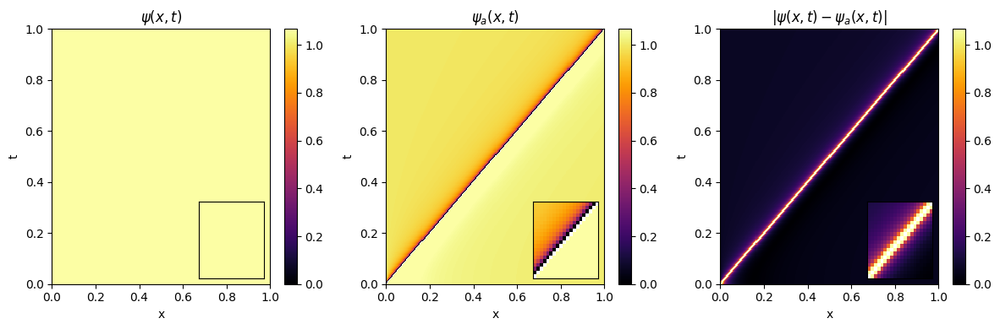

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


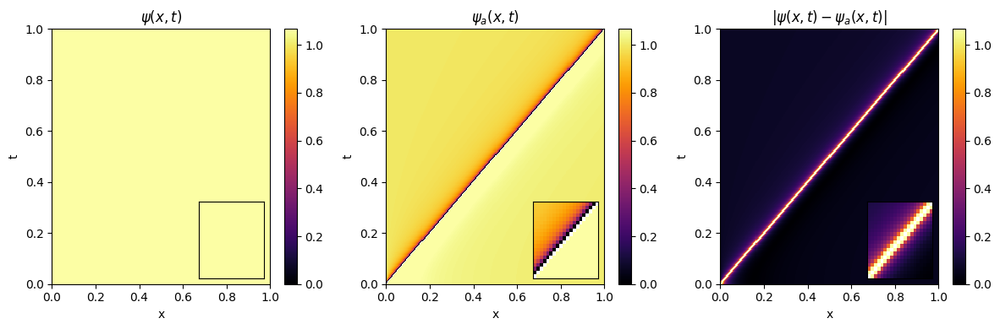

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


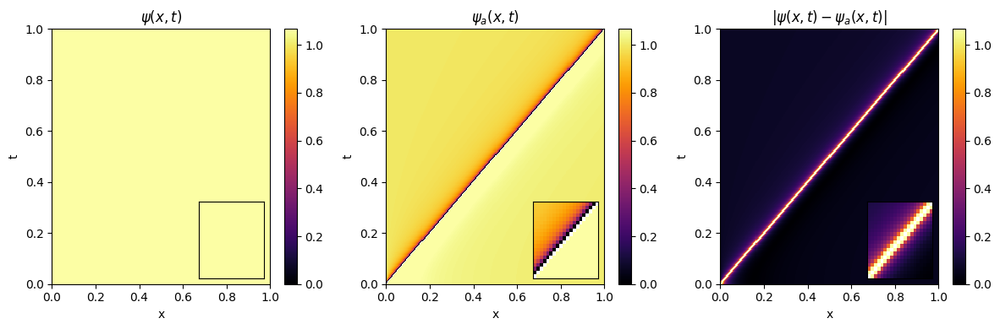

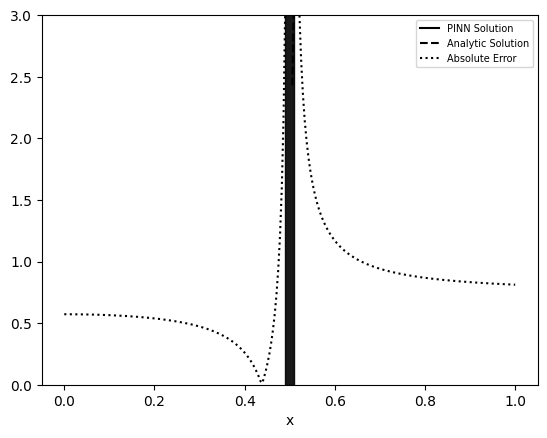

Compiling model...
Building feed-forward neural network...
'build' took 0.073033 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.067930 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [1.54e-02, 1.19e+00, 5.71e-02]    [1.54e-02, 1.19e+00, 5.71e-02]    []  
1000      [5.69e-05, 4.91e-02, 8.67e-04]    [5.69e-05, 4.91e-02, 8.67e-04]    []  
2000      [4.17e-05, 4.91e-02, 9.28e-04]    [4.17e-05, 4.91e-02, 9.28e-04]    []  
3000      [2.94e-05, 5.12e-02, 9.02e-04]    [2.94e-05, 5.12e-02, 9.02e-04]    []  
4000      [5.60e-04, 5.61e-02, 5.93e-04]    [5.60e-04, 5.61e-02, 5.93e-04]    []  
5000      [4.10e-06, 6.06e-02, 1.10e-07]    [4.10e-06, 6.06e-02, 1.10e-07]    []  
6000      [2.52e-11, 6.06e-02, 1.50e-12]    [2.52e-11, 6.06e-02, 1.50e-12]    []  
7000      [1.26e-11, 6.06e-02, 7.81e-13]    [1.26e-11, 6.06e-02, 7.81e-13]    []  
8000      [5.77e-12, 6.06e-02, 3.76e-13]    [5.77e-12, 6.06e-02, 3.76e-13]    []  
9000      [2.32e-12, 6.10e-02, 1.59e-13]    [2.32e-12, 6.10e-02, 1.59e-13]    []  
10000   

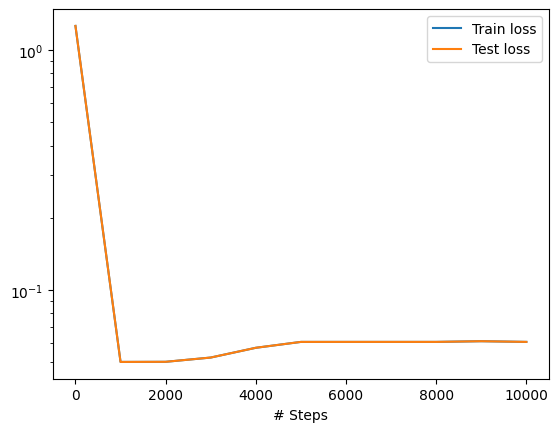

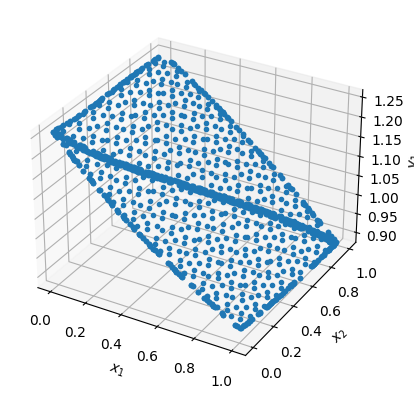

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


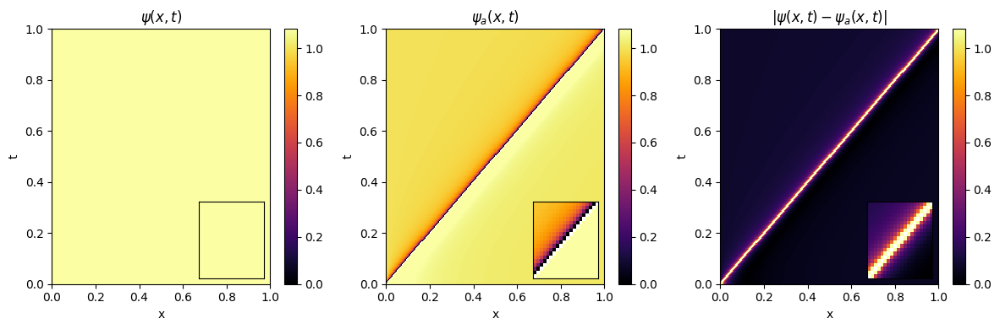

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


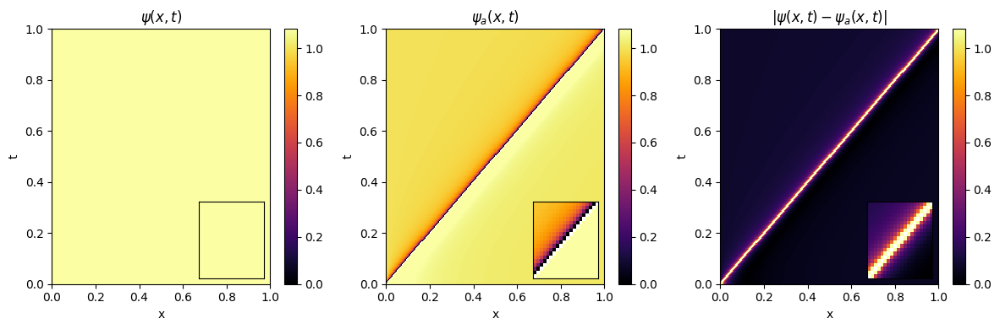

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


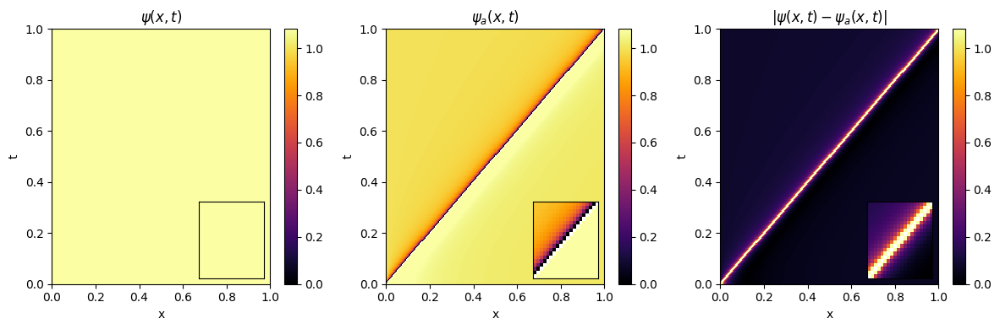

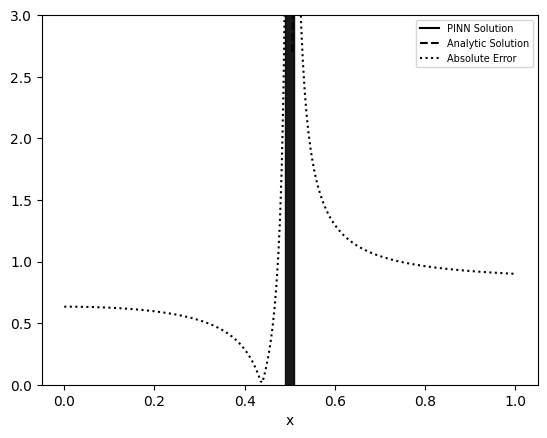

Average Behavior


TypeError: object of type 'float' has no len()

In [8]:

for i in range(sample_size):
    model_0 = generate_evolution_model(throat, 500, 500, 10, 3, lr, iterations, 0);
    analytic_v_0 += plot_evolution_model(throat, model_0)[0];
    v_0 += plot_evolution_model(throat, model_0)[1];
    diff_0 += plot_evolution_model(throat, model_0)[2];
    plot_evolution_slice(throat, 0.5, analytic_v_0, v_0, diff_0)
    
    
print("Average Behavior")
analytic_v_1 = analytic_v_0/sample_size
v_1 = v_1/sample_size 
diff_1 = diff_1/sample_size 

plot_evolution_slice(throat, 0.5, analytic_v_1, v_1, diff_1)


# N = 1

Compiling model...
Building feed-forward neural network...
'build' took 0.039439 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.675789 s

Initializing variables...
Training model...

Step      Train loss                                  Test loss                                   Test metric
0         [9.95e-02, 5.21e-01, 7.00e-01, 1.10e+00]    [9.95e-02, 5.21e-01, 7.00e-01, 1.10e+00]    []  
1000      [2.70e-05, 8.30e-03, 5.50e-04, 1.84e-03]    [2.70e-05, 8.30e-03, 5.50e-04, 1.84e-03]    []  
2000      [2.06e-05, 7.44e-03, 4.77e-04, 3.10e-03]    [2.06e-05, 7.44e-03, 4.77e-04, 3.10e-03]    []  
3000      [3.21e-05, 9.41e-03, 3.54e-04, 1.30e-03]    [3.21e-05, 9.41e-03, 3.54e-04, 1.30e-03]    []  
4000      [3.05e-05, 8.29e-03, 5.46e-04, 1.85e-03]    [3.05e-05, 8.29e-03, 5.46e-04, 1.85e-03]    []  
5000      [3.37e-05, 8.23e-03, 5.15e-04, 1.94e-03]    [3.37e-05, 8.23e-03, 5.15e-04, 1.94e-03]    []  
6000      [4.17e-05, 8.25e-03, 6.07e-04, 1.84e-03]    [4.17e-05, 8.25e-03, 6.07e-04, 1.84e-03]    []  
7000      [7.12e-06, 8.19e-03, 6.31e-04, 1.83e-03]    [7.12e-06, 8.19e-03, 6.31e-04, 1.83e-03]   

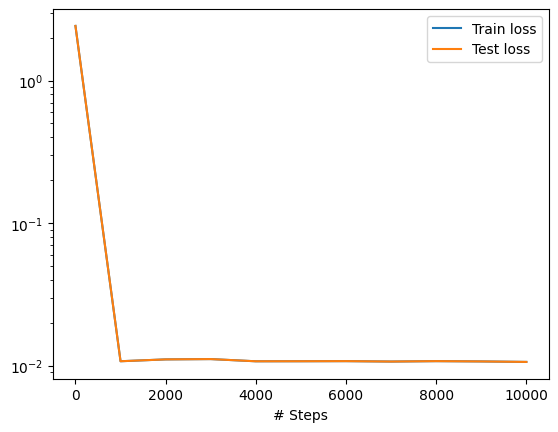

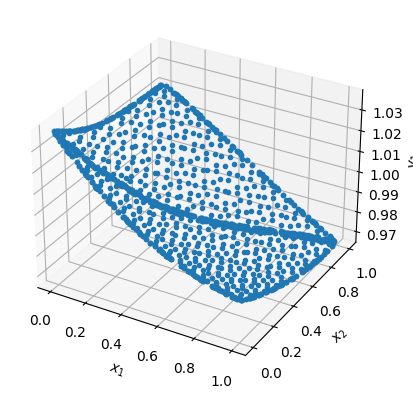

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


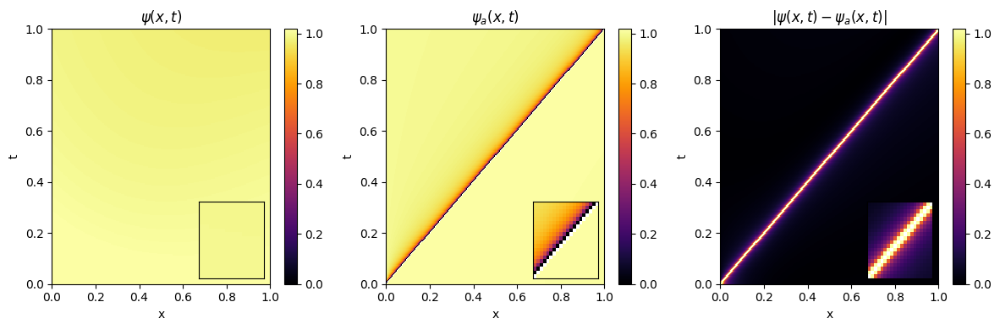

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


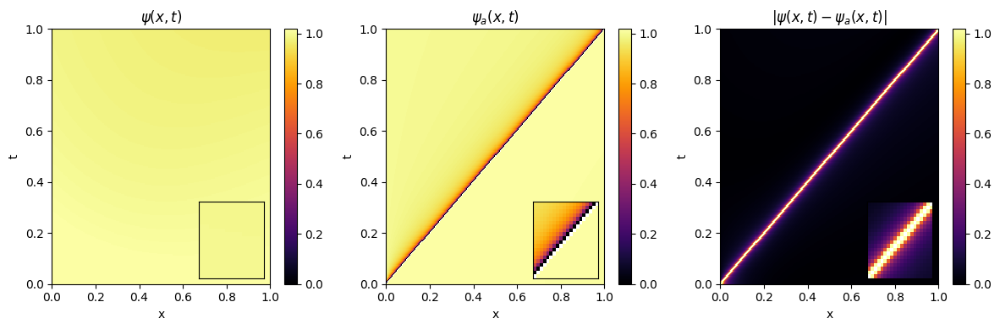

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


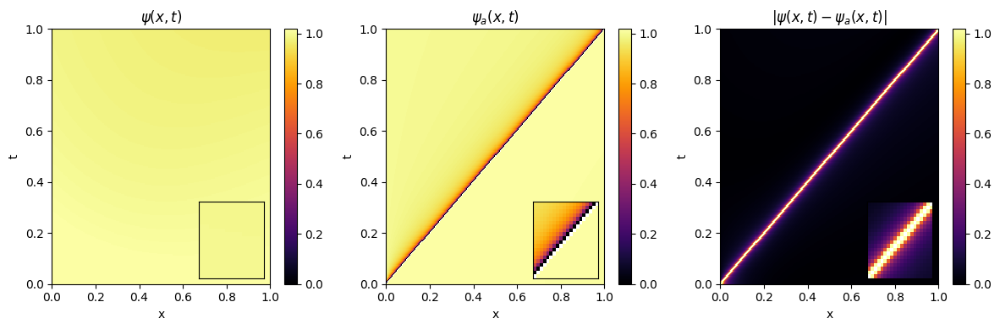

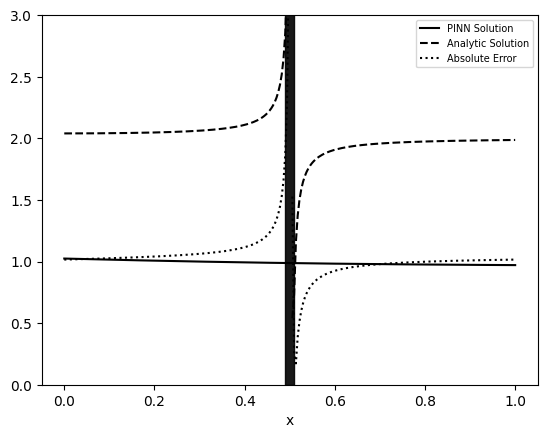

Compiling model...
Building feed-forward neural network...
'build' took 0.032347 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.990139 s

Initializing variables...
Training model...

Step      Train loss                                  Test loss                                   Test metric
0         [7.23e-02, 1.27e+00, 1.60e-01, 6.52e-01]    [7.23e-02, 1.27e+00, 1.60e-01, 6.52e-01]    []  
1000      [2.72e-05, 4.81e-02, 1.22e-03, 3.99e-03]    [2.72e-05, 4.81e-02, 1.22e-03, 3.99e-03]    []  
2000      [2.24e-05, 4.70e-02, 1.07e-03, 5.30e-03]    [2.24e-05, 4.70e-02, 1.07e-03, 5.30e-03]    []  
3000      [2.36e-05, 4.75e-02, 1.52e-03, 3.92e-03]    [2.36e-05, 4.75e-02, 1.52e-03, 3.92e-03]    []  
4000      [2.40e-05, 4.75e-02, 1.55e-03, 3.89e-03]    [2.40e-05, 4.75e-02, 1.55e-03, 3.89e-03]    []  
5000      [2.66e-05, 4.69e-02, 1.49e-03, 4.60e-03]    [2.66e-05, 4.69e-02, 1.49e-03, 4.60e-03]    []  
6000      [2.47e-05, 4.75e-02, 1.45e-03, 3.98e-03]    [2.47e-05, 4.75e-02, 1.45e-03, 3.98e-03]    []  
7000      [3.41e-05, 4.78e-02, 1.36e-03, 4.01e-03]    [3.41e-05, 4.78e-02, 1.36e-03, 4.01e-03]   

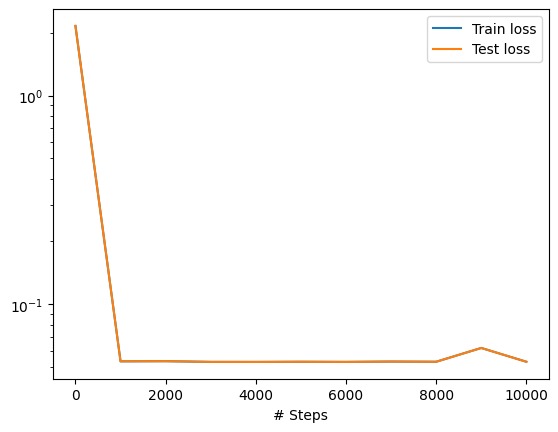

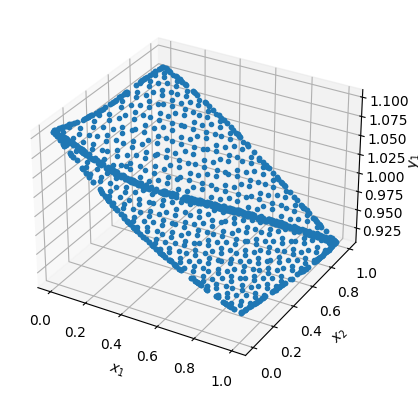

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


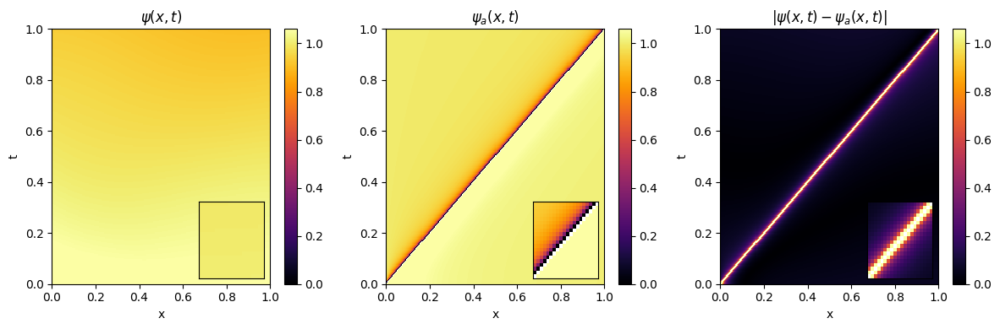

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


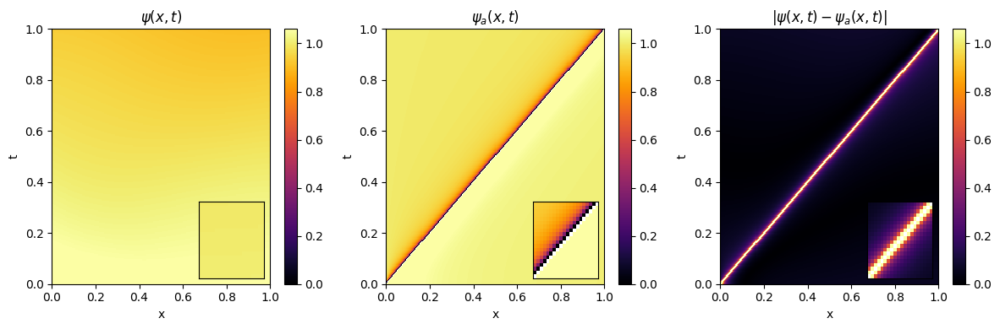

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


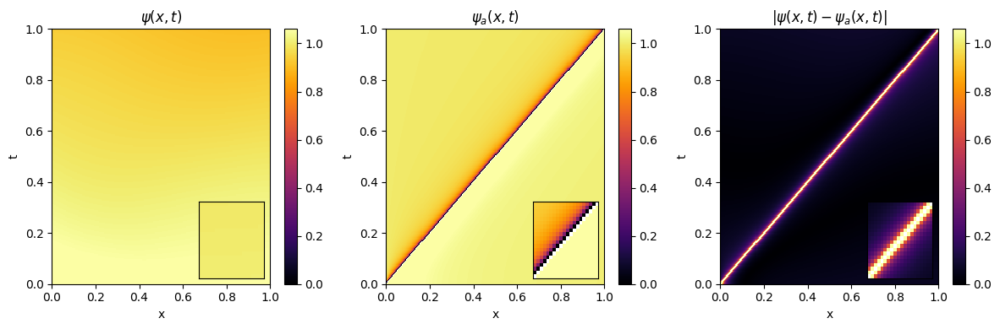

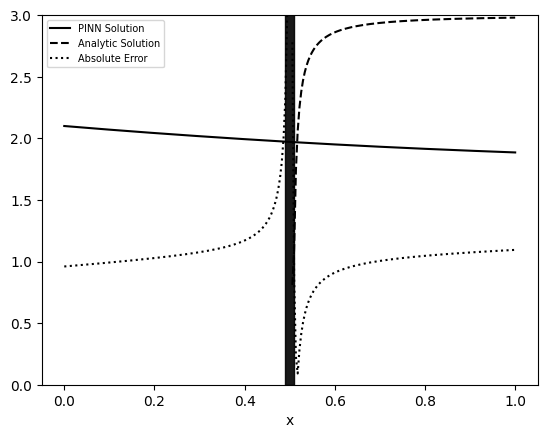

Compiling model...
Building feed-forward neural network...
'build' took 0.034198 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.724460 s

Initializing variables...
Training model...

Step      Train loss                                  Test loss                                   Test metric
0         [8.74e-03, 1.39e+00, 6.41e-01, 2.31e+00]    [8.74e-03, 1.39e+00, 6.41e-01, 2.31e+00]    []  
1000      [8.21e-06, 3.79e-03, 4.45e-04, 1.69e-03]    [8.21e-06, 3.79e-03, 4.45e-04, 1.69e-03]    []  
2000      [2.53e-06, 3.75e-03, 4.80e-04, 1.66e-03]    [2.53e-06, 3.75e-03, 4.80e-04, 1.66e-03]    []  
3000      [2.96e-06, 3.70e-03, 4.94e-04, 1.60e-03]    [2.96e-06, 3.70e-03, 4.94e-04, 1.60e-03]    []  
4000      [1.86e-05, 3.19e-03, 3.01e-04, 2.52e-03]    [1.86e-05, 3.19e-03, 3.01e-04, 2.52e-03]    []  
5000      [2.45e-06, 3.67e-03, 5.20e-04, 1.55e-03]    [2.45e-06, 3.67e-03, 5.20e-04, 1.55e-03]    []  
6000      [3.30e-06, 3.68e-03, 5.16e-04, 1.54e-03]    [3.30e-06, 3.68e-03, 5.16e-04, 1.54e-03]    []  
7000      [1.19e-06, 2.74e-03, 1.40e-04, 4.04e-03]    [1.19e-06, 2.74e-03, 1.40e-04, 4.04e-03]   

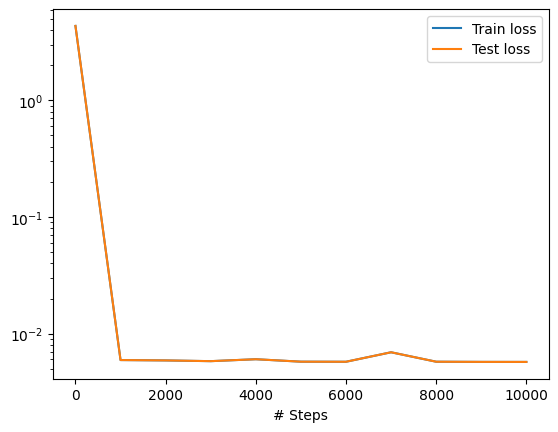

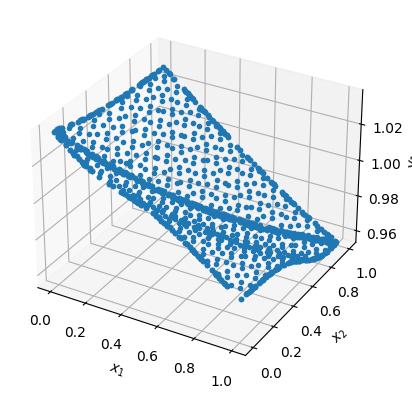

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


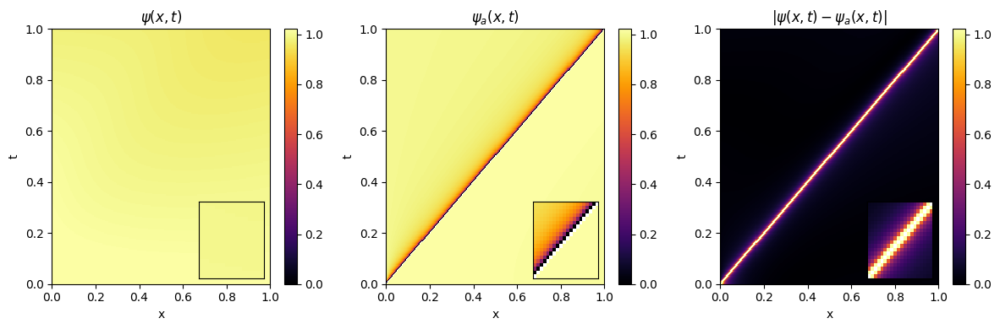

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


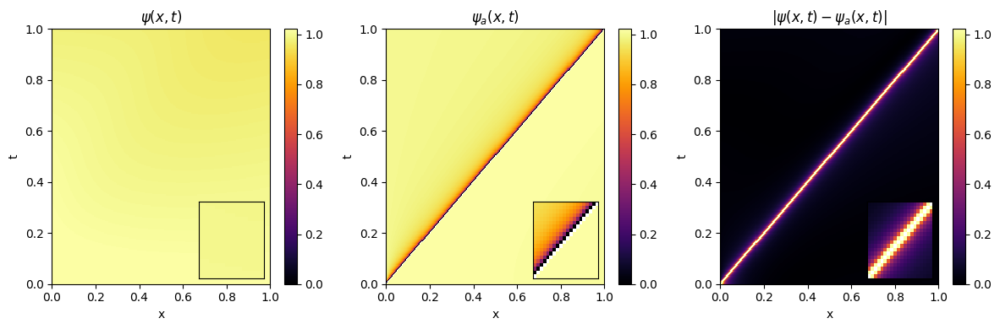

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


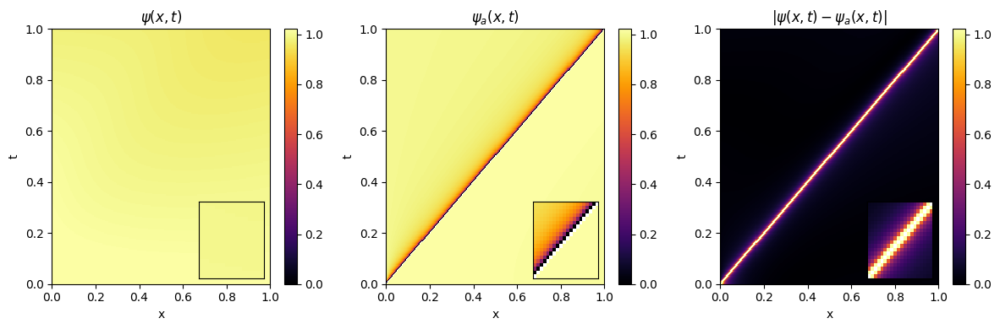

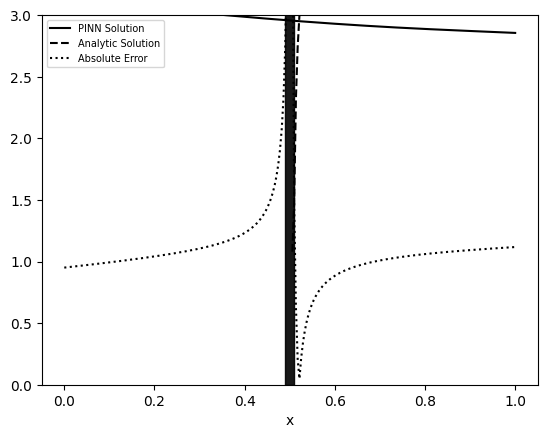

Compiling model...
Building feed-forward neural network...
'build' took 0.045482 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.100171 s

Initializing variables...
Training model...

Step      Train loss                                  Test loss                                   Test metric
0         [1.26e-02, 1.54e+00, 1.08e-01, 9.28e-01]    [1.26e-02, 1.54e+00, 1.08e-01, 9.28e-01]    []  
1000      [8.48e-06, 1.12e-02, 4.48e-04, 2.17e-03]    [8.48e-06, 1.12e-02, 4.48e-04, 2.17e-03]    []  
2000      [7.47e-06, 1.11e-02, 5.15e-04, 2.17e-03]    [7.47e-06, 1.11e-02, 5.15e-04, 2.17e-03]    []  
3000      [4.31e-06, 1.09e-02, 5.69e-04, 2.16e-03]    [4.31e-06, 1.09e-02, 5.69e-04, 2.16e-03]    []  
4000      [5.26e-06, 1.08e-02, 6.72e-04, 2.10e-03]    [5.26e-06, 1.08e-02, 6.72e-04, 2.10e-03]    []  
5000      [5.67e-06, 1.06e-02, 7.75e-04, 2.23e-03]    [5.67e-06, 1.06e-02, 7.75e-04, 2.23e-03]    []  
6000      [5.70e-06, 1.08e-02, 8.41e-04, 1.84e-03]    [5.70e-06, 1.08e-02, 8.41e-04, 1.84e-03]    []  
7000      [6.36e-06, 1.09e-02, 7.83e-04, 1.78e-03]    [6.36e-06, 1.09e-02, 7.83e-04, 1.78e-03]   

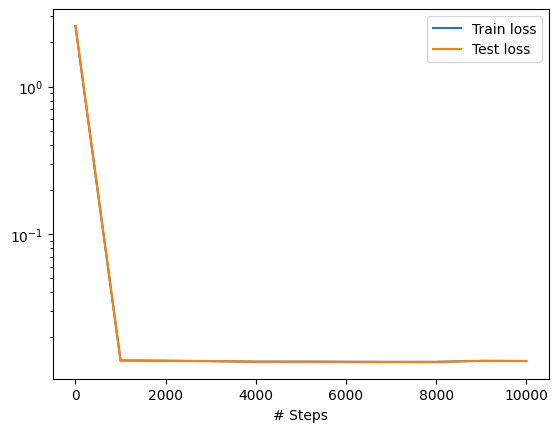

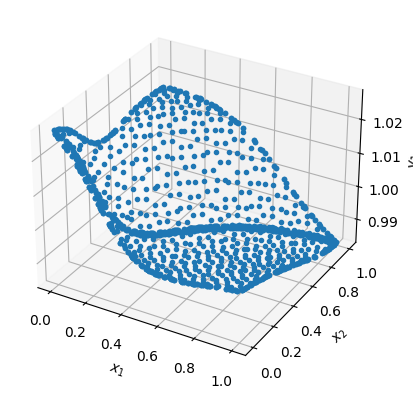

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


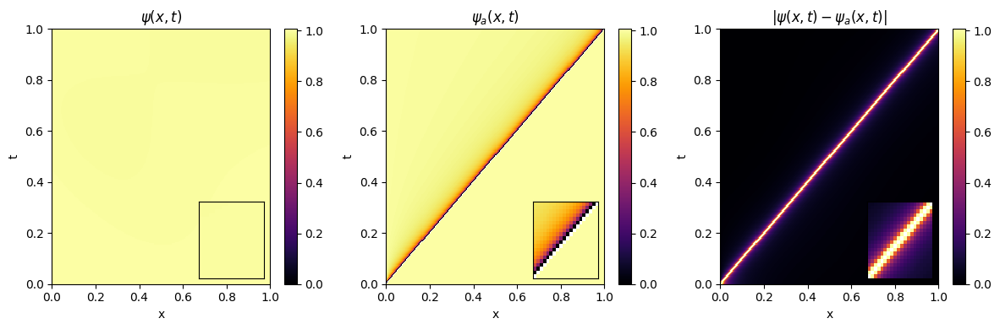

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


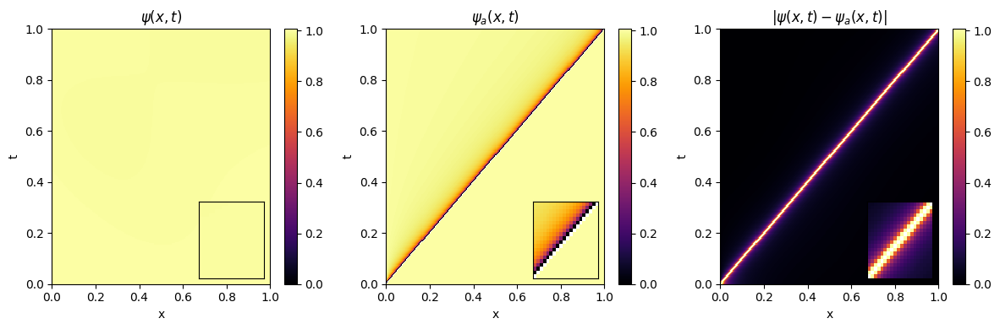

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


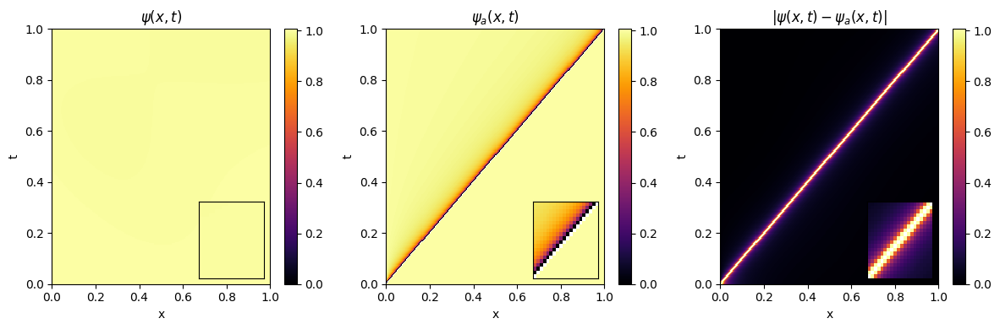

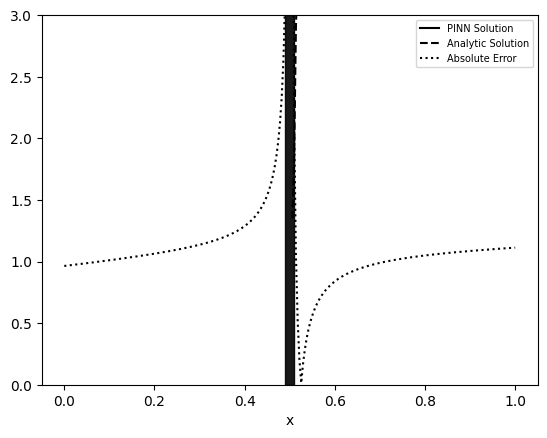

Compiling model...
Building feed-forward neural network...
'build' took 0.039253 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.763196 s

Initializing variables...
Training model...

Step      Train loss                                  Test loss                                   Test metric
0         [2.01e-03, 8.72e-01, 1.55e-02, 4.55e-01]    [2.01e-03, 8.72e-01, 1.55e-02, 4.55e-01]    []  
1000      [2.69e-05, 5.02e-02, 1.38e-03, 4.98e-03]    [2.69e-05, 5.02e-02, 1.38e-03, 4.98e-03]    []  
2000      [2.69e-05, 4.98e-02, 1.50e-03, 5.12e-03]    [2.69e-05, 4.98e-02, 1.50e-03, 5.12e-03]    []  
3000      [2.96e-05, 5.05e-02, 1.42e-03, 4.45e-03]    [2.96e-05, 5.05e-02, 1.42e-03, 4.45e-03]    []  
4000      [5.65e-05, 5.03e-02, 1.04e-03, 5.30e-03]    [5.65e-05, 5.03e-02, 1.04e-03, 5.30e-03]    []  
5000      [2.62e-05, 4.99e-02, 1.56e-03, 4.89e-03]    [2.62e-05, 4.99e-02, 1.56e-03, 4.89e-03]    []  
6000      [2.90e-05, 5.03e-02, 1.74e-03, 4.35e-03]    [2.90e-05, 5.03e-02, 1.74e-03, 4.35e-03]    []  
7000      [2.67e-05, 5.04e-02, 1.27e-03, 5.01e-03]    [2.67e-05, 5.04e-02, 1.27e-03, 5.01e-03]   

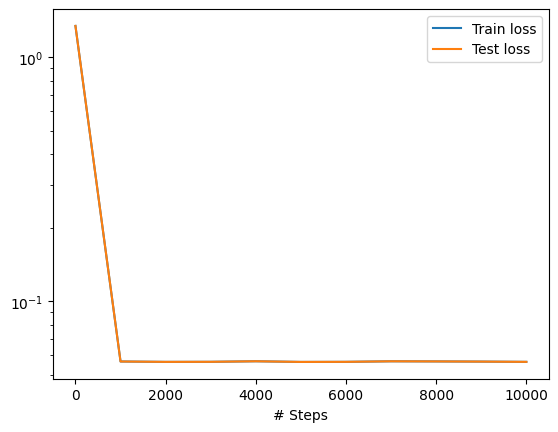

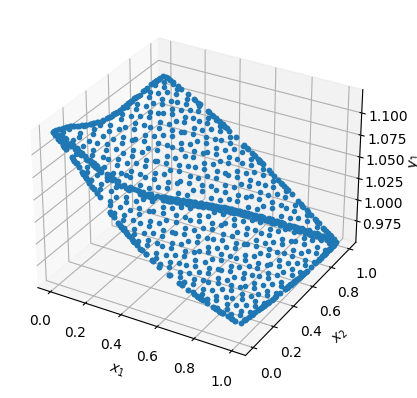

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


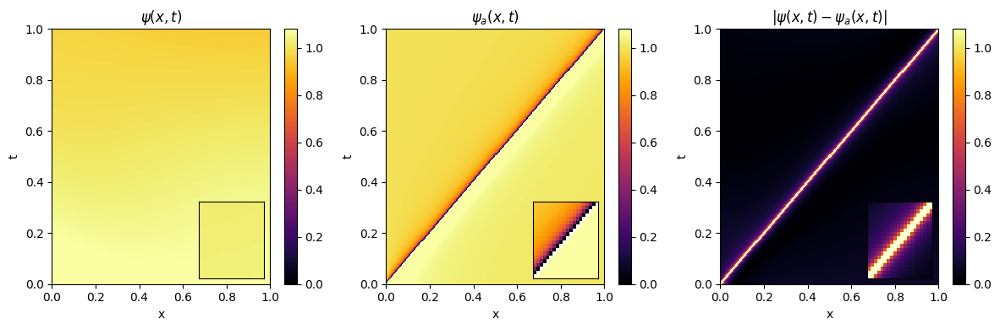

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


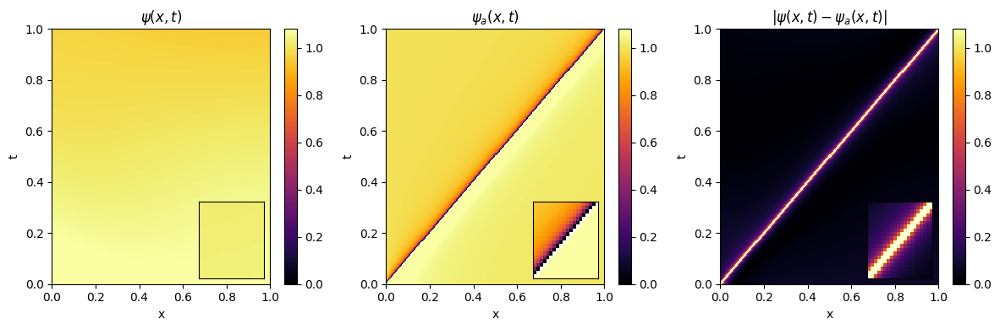

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


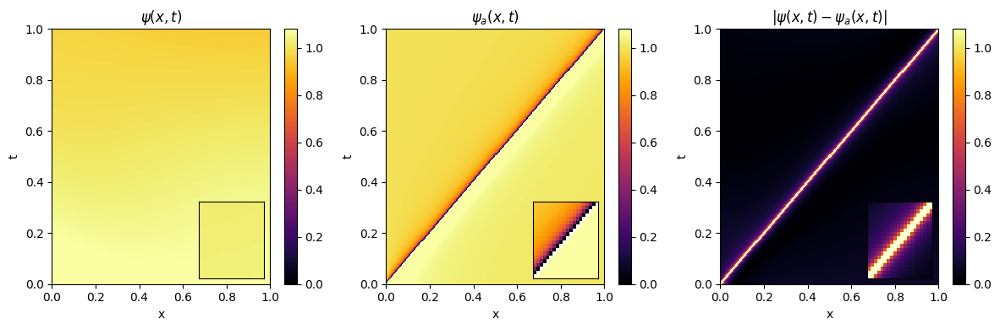

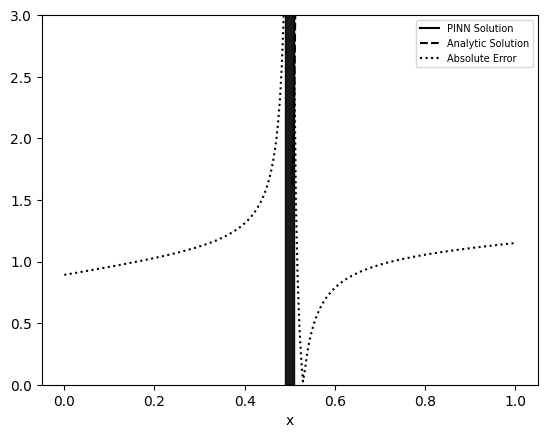

Compiling model...
Building feed-forward neural network...
'build' took 0.036806 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.780188 s

Initializing variables...
Training model...

Step      Train loss                                  Test loss                                   Test metric
0         [3.04e-01, 1.01e+00, 7.06e-02, 9.18e-01]    [3.04e-01, 1.01e+00, 7.06e-02, 9.18e-01]    []  
1000      [2.19e-05, 5.99e-02, 9.91e-04, 4.22e-03]    [2.19e-05, 5.99e-02, 9.91e-04, 4.22e-03]    []  
2000      [2.57e-05, 5.99e-02, 1.07e-03, 4.17e-03]    [2.57e-05, 5.99e-02, 1.07e-03, 4.17e-03]    []  
3000      [2.69e-05, 5.97e-02, 1.12e-03, 4.22e-03]    [2.69e-05, 5.97e-02, 1.12e-03, 4.22e-03]    []  
4000      [2.58e-05, 5.97e-02, 1.12e-03, 4.22e-03]    [2.58e-05, 5.97e-02, 1.12e-03, 4.22e-03]    []  
5000      [2.53e-05, 5.93e-02, 1.10e-03, 4.70e-03]    [2.53e-05, 5.93e-02, 1.10e-03, 4.70e-03]    []  
6000      [2.53e-05, 6.01e-02, 1.13e-03, 3.89e-03]    [2.53e-05, 6.01e-02, 1.13e-03, 3.89e-03]    []  
7000      [1.85e-05, 5.98e-02, 1.11e-03, 4.22e-03]    [1.85e-05, 5.98e-02, 1.11e-03, 4.22e-03]   

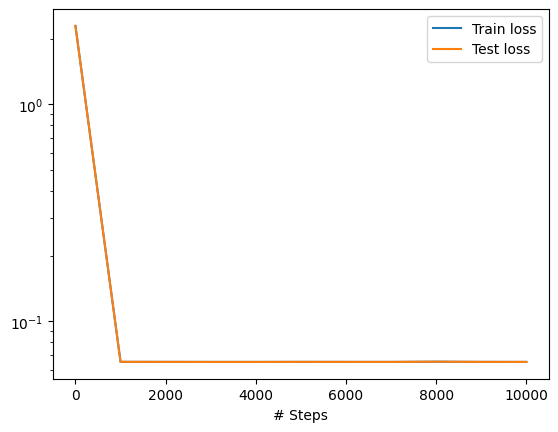

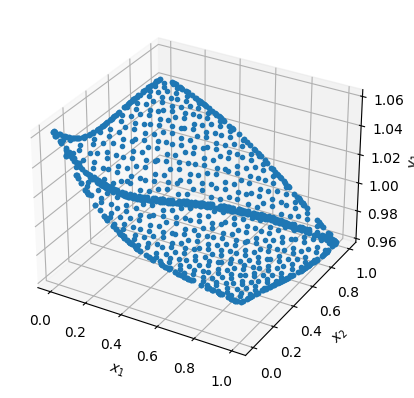

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


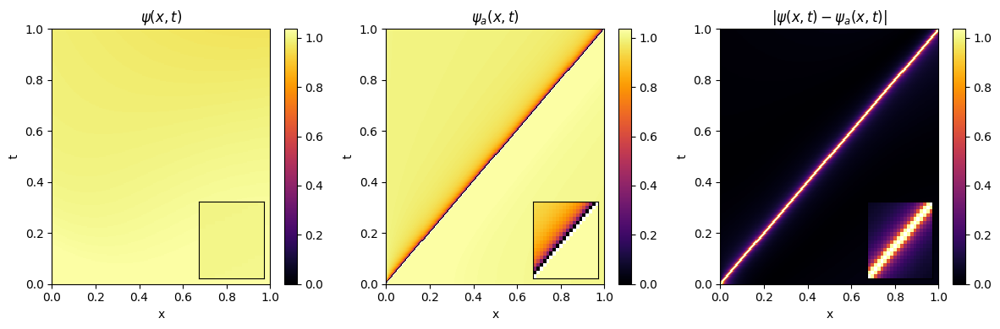

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


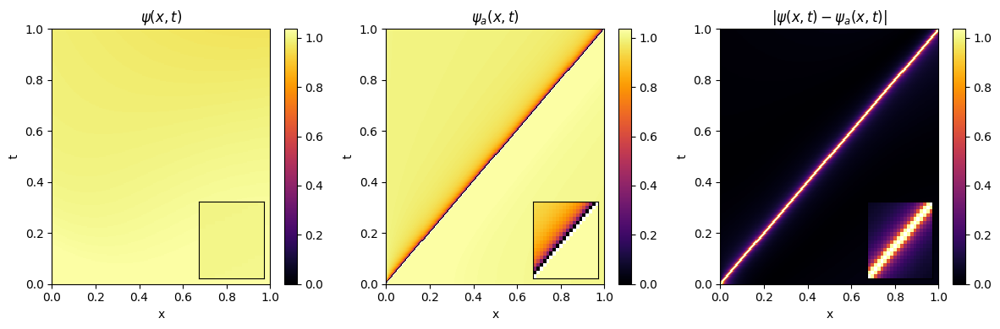

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


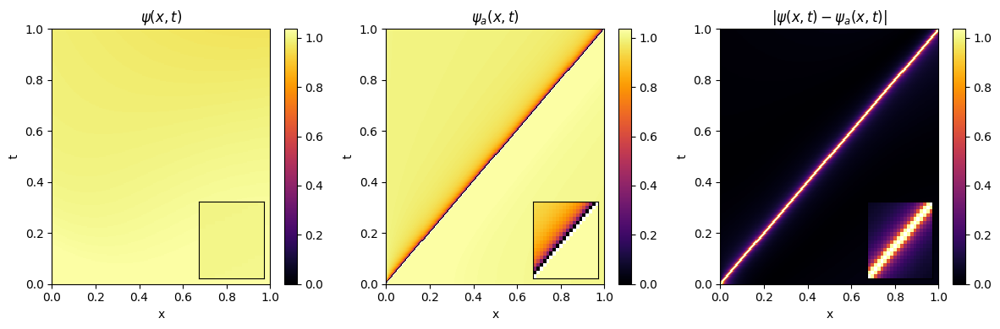

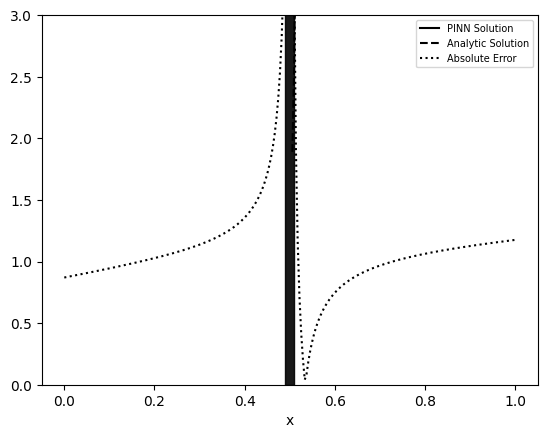

Compiling model...
Building feed-forward neural network...
'build' took 0.035529 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.772971 s

Initializing variables...
Training model...

Step      Train loss                                  Test loss                                   Test metric
0         [6.14e-02, 7.78e-01, 1.23e-01, 4.33e-01]    [6.14e-02, 7.78e-01, 1.23e-01, 4.33e-01]    []  
1000      [4.97e-06, 4.18e-03, 5.22e-04, 1.63e-03]    [4.97e-06, 4.18e-03, 5.22e-04, 1.63e-03]    []  
2000      [1.33e-05, 4.21e-03, 4.49e-04, 1.65e-03]    [1.33e-05, 4.21e-03, 4.49e-04, 1.65e-03]    []  
3000      [3.00e-06, 4.09e-03, 5.73e-04, 1.54e-03]    [3.00e-06, 4.09e-03, 5.73e-04, 1.54e-03]    []  
4000      [2.86e-06, 4.09e-03, 5.71e-04, 1.55e-03]    [2.86e-06, 4.09e-03, 5.71e-04, 1.55e-03]    []  
5000      [2.98e-06, 4.07e-03, 5.97e-04, 1.53e-03]    [2.98e-06, 4.07e-03, 5.97e-04, 1.53e-03]    []  
6000      [2.18e-05, 4.65e-03, 3.99e-04, 1.38e-03]    [2.18e-05, 4.65e-03, 3.99e-04, 1.38e-03]    []  
7000      [5.17e-06, 4.19e-03, 5.25e-04, 1.62e-03]    [5.17e-06, 4.19e-03, 5.25e-04, 1.62e-03]   

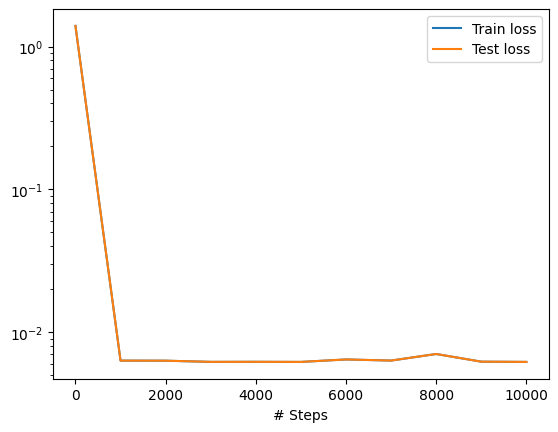

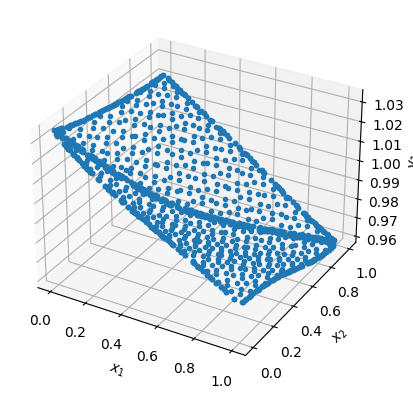

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


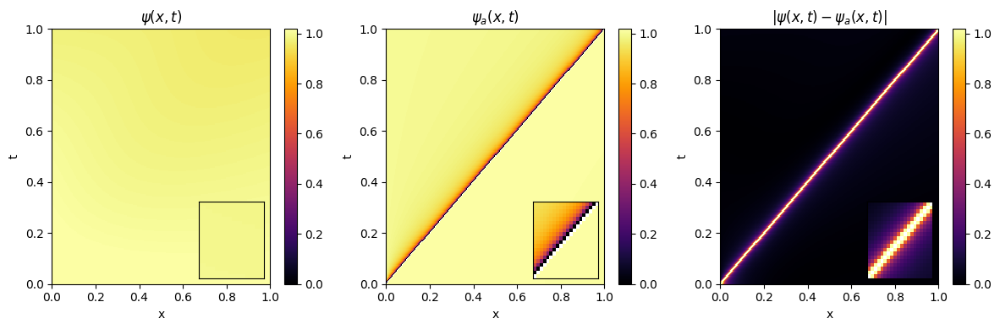

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


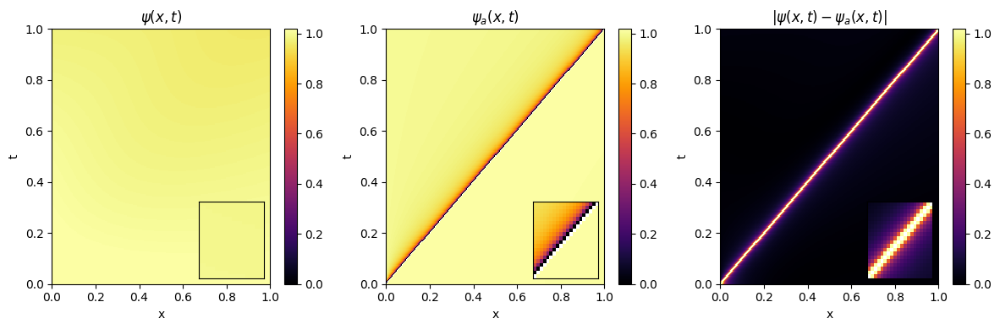

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


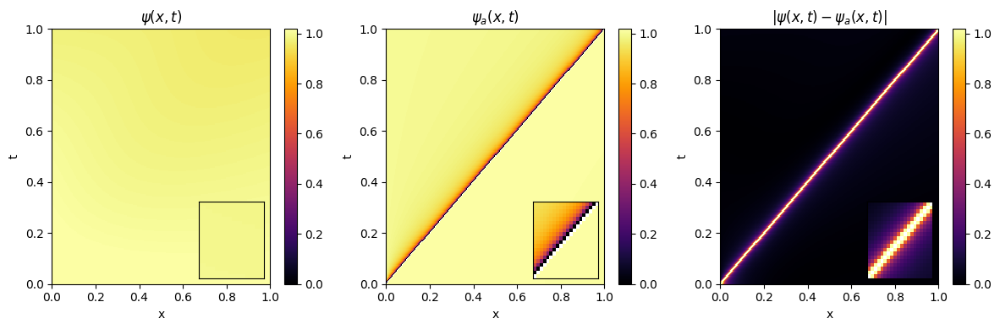

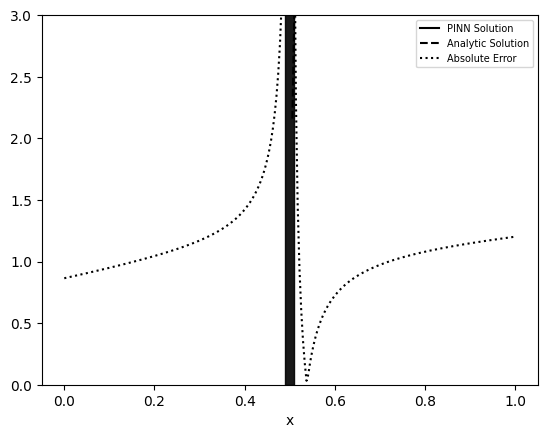

Compiling model...
Building feed-forward neural network...
'build' took 0.036682 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.977131 s

Initializing variables...
Training model...

Step      Train loss                                  Test loss                                   Test metric
0         [6.78e-03, 8.07e-01, 7.63e-02, 8.63e-01]    [6.78e-03, 8.07e-01, 7.63e-02, 8.63e-01]    []  
1000      [2.84e-05, 4.90e-02, 1.73e-03, 3.94e-03]    [2.84e-05, 4.90e-02, 1.73e-03, 3.94e-03]    []  
2000      [3.89e-05, 5.94e-02, 2.62e-03, 7.59e-04]    [3.89e-05, 5.94e-02, 2.62e-03, 7.59e-04]    []  
3000      [4.15e-05, 4.87e-02, 1.90e-03, 3.79e-03]    [4.15e-05, 4.87e-02, 1.90e-03, 3.79e-03]    []  
4000      [2.99e-05, 4.85e-02, 1.86e-03, 4.08e-03]    [2.99e-05, 4.85e-02, 1.86e-03, 4.08e-03]    []  
5000      [3.05e-05, 4.86e-02, 1.96e-03, 3.75e-03]    [3.05e-05, 4.86e-02, 1.96e-03, 3.75e-03]    []  
6000      [3.98e-05, 5.04e-02, 1.97e-03, 2.40e-03]    [3.98e-05, 5.04e-02, 1.97e-03, 2.40e-03]    []  
7000      [4.50e-05, 5.17e-02, 1.80e-03, 1.91e-03]    [4.50e-05, 5.17e-02, 1.80e-03, 1.91e-03]   

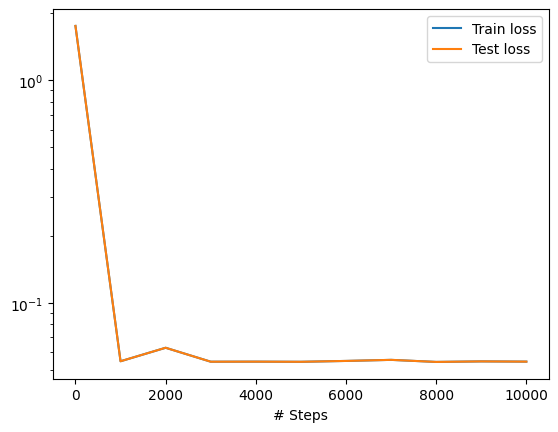

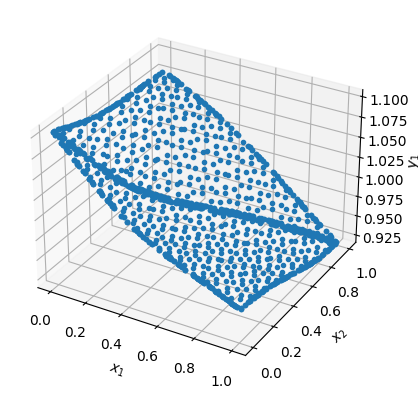

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


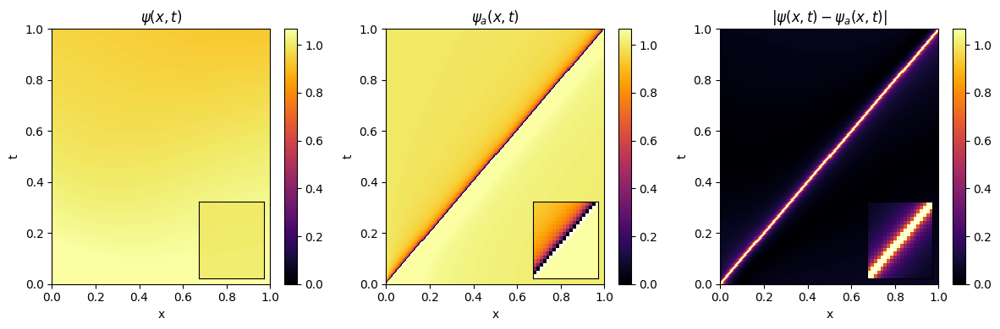

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


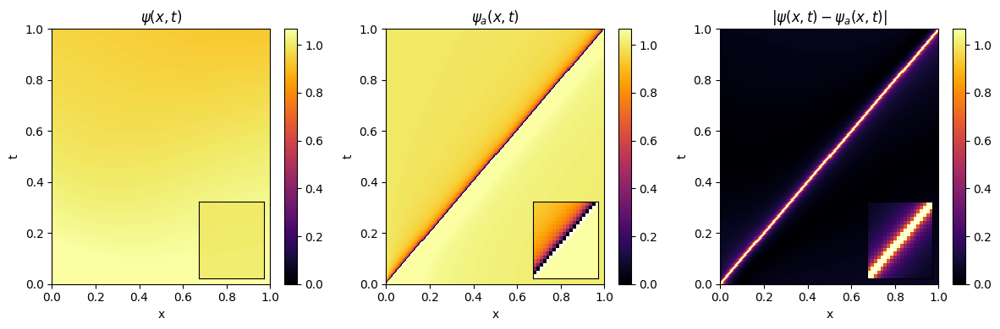

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


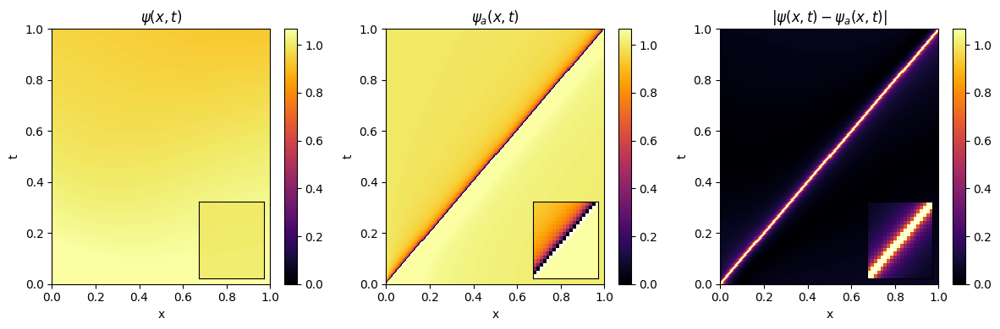

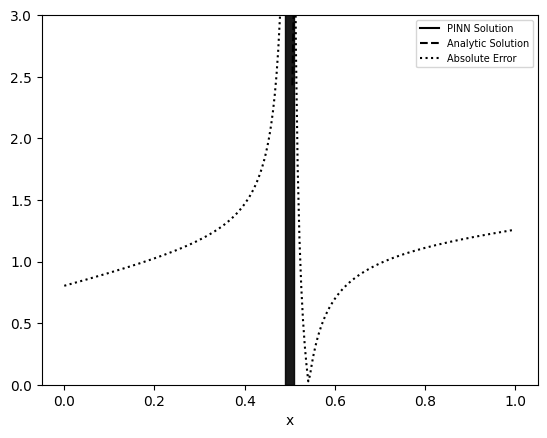

Compiling model...
Building feed-forward neural network...
'build' took 0.031233 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.775412 s

Initializing variables...
Training model...

Step      Train loss                                  Test loss                                   Test metric
0         [3.00e-03, 8.81e-01, 1.60e-01, 5.55e-01]    [3.00e-03, 8.81e-01, 1.60e-01, 5.55e-01]    []  
1000      [2.26e-06, 2.36e-03, 1.55e-04, 1.46e-03]    [2.26e-06, 2.36e-03, 1.55e-04, 1.46e-03]    []  
2000      [6.12e-06, 1.80e-03, 3.53e-05, 2.46e-03]    [6.12e-06, 1.80e-03, 3.53e-05, 2.46e-03]    []  
3000      [7.20e-07, 2.33e-03, 1.79e-04, 1.44e-03]    [7.20e-07, 2.33e-03, 1.79e-04, 1.44e-03]    []  
4000      [8.94e-07, 2.50e-03, 2.54e-04, 1.21e-03]    [8.94e-07, 2.50e-03, 2.54e-04, 1.21e-03]    []  
5000      [3.51e-07, 2.32e-03, 1.42e-04, 1.49e-03]    [3.51e-07, 2.32e-03, 1.42e-04, 1.49e-03]    []  
6000      [1.15e-06, 2.23e-03, 1.48e-04, 1.57e-03]    [1.15e-06, 2.23e-03, 1.48e-04, 1.57e-03]    []  
7000      [3.06e-06, 2.34e-03, 1.61e-04, 1.47e-03]    [3.06e-06, 2.34e-03, 1.61e-04, 1.47e-03]   

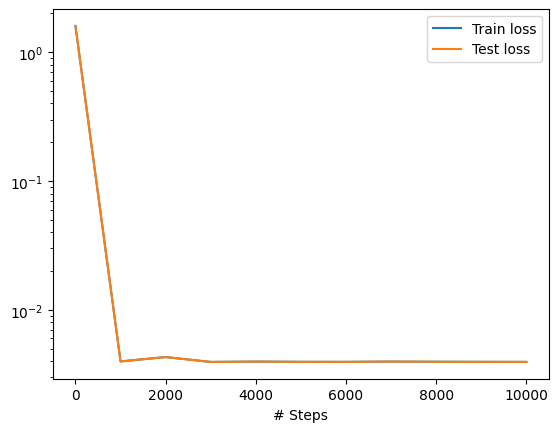

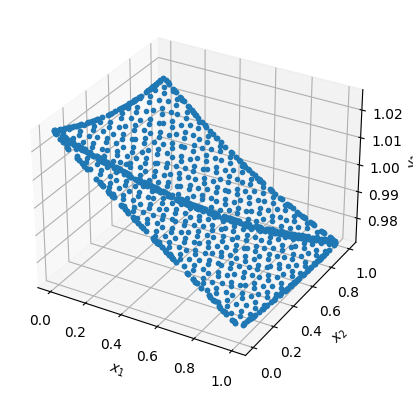

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


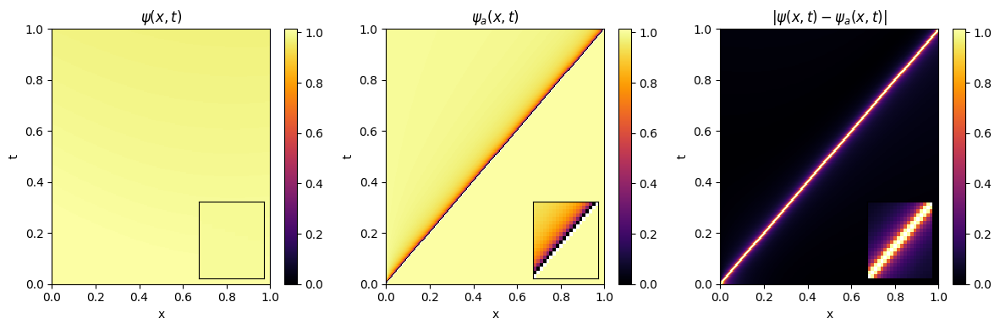

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


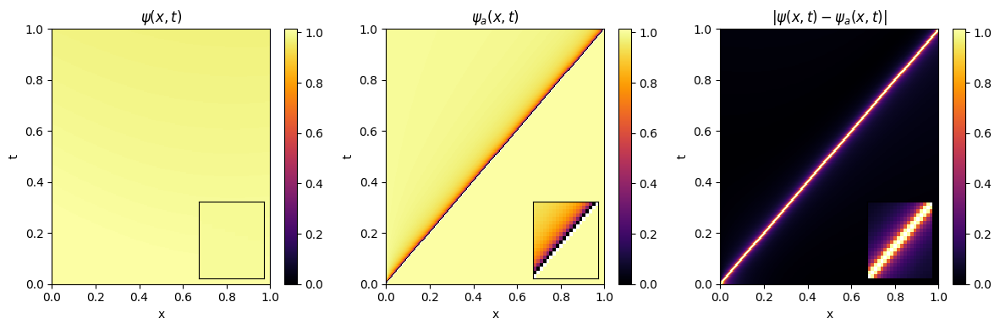

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


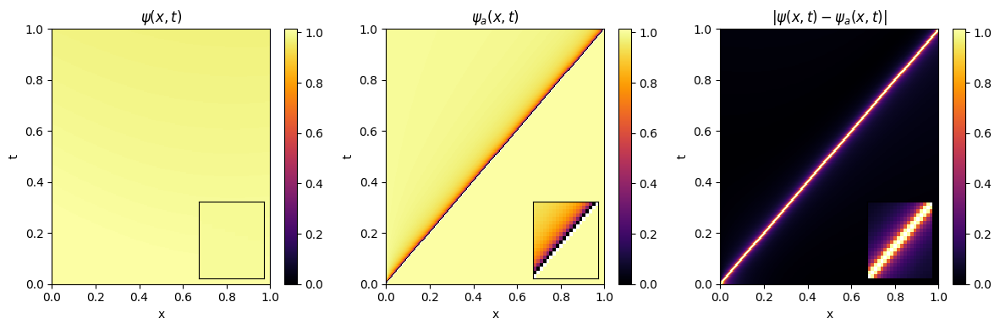

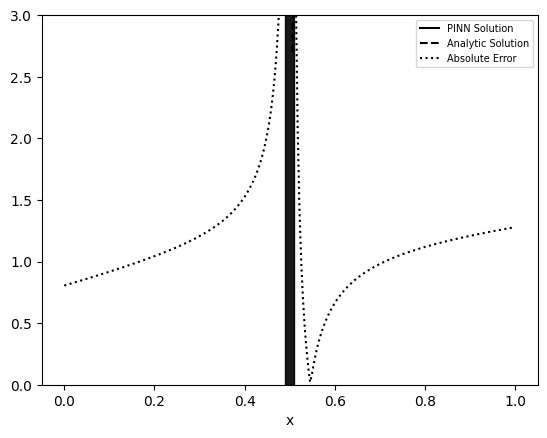

Compiling model...
Building feed-forward neural network...
'build' took 0.031318 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.772402 s

Initializing variables...
Training model...

Step      Train loss                                  Test loss                                   Test metric
0         [3.54e-03, 1.44e+00, 7.98e-03, 1.06e+00]    [3.54e-03, 1.44e+00, 7.98e-03, 1.06e+00]    []  
1000      [1.95e-05, 5.21e-02, 1.49e-03, 3.60e-03]    [1.95e-05, 5.21e-02, 1.49e-03, 3.60e-03]    []  
2000      [2.25e-05, 5.17e-02, 1.70e-03, 3.47e-03]    [2.25e-05, 5.17e-02, 1.70e-03, 3.47e-03]    []  
3000      [2.24e-05, 5.16e-02, 1.76e-03, 3.42e-03]    [2.24e-05, 5.16e-02, 1.76e-03, 3.42e-03]    []  
4000      [2.25e-05, 5.16e-02, 1.77e-03, 3.40e-03]    [2.25e-05, 5.16e-02, 1.77e-03, 3.40e-03]    []  
5000      [2.40e-05, 5.16e-02, 2.13e-03, 3.08e-03]    [2.40e-05, 5.16e-02, 2.13e-03, 3.08e-03]    []  
6000      [2.37e-05, 5.17e-02, 1.73e-03, 3.36e-03]    [2.37e-05, 5.17e-02, 1.73e-03, 3.36e-03]    []  
7000      [2.29e-05, 5.16e-02, 1.76e-03, 3.43e-03]    [2.29e-05, 5.16e-02, 1.76e-03, 3.43e-03]   

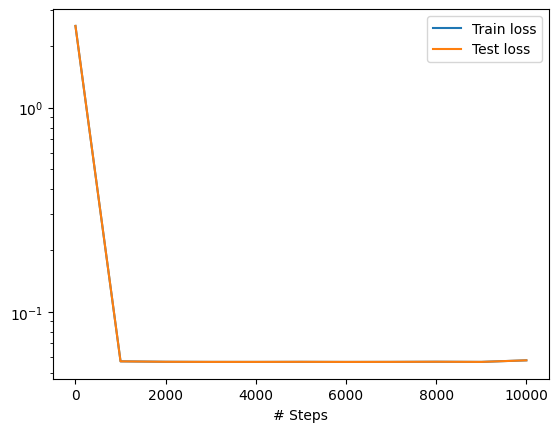

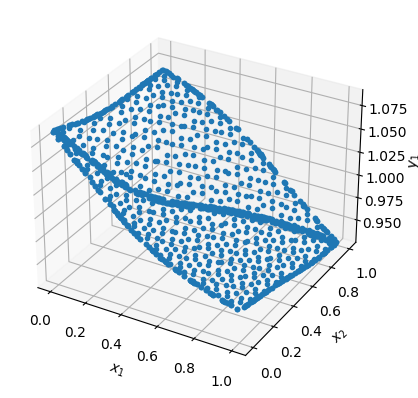

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


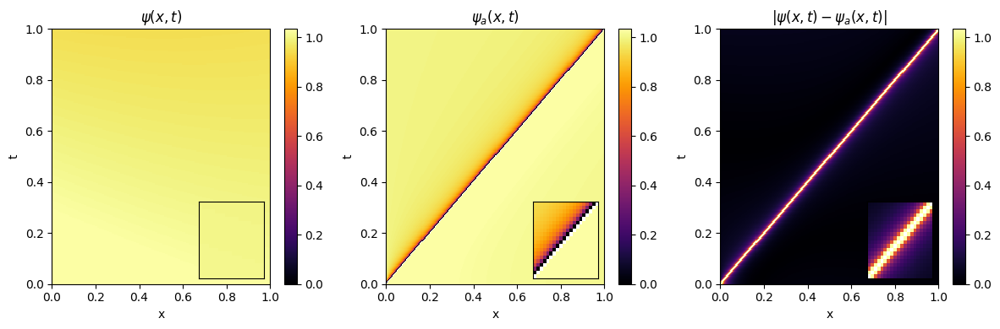

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


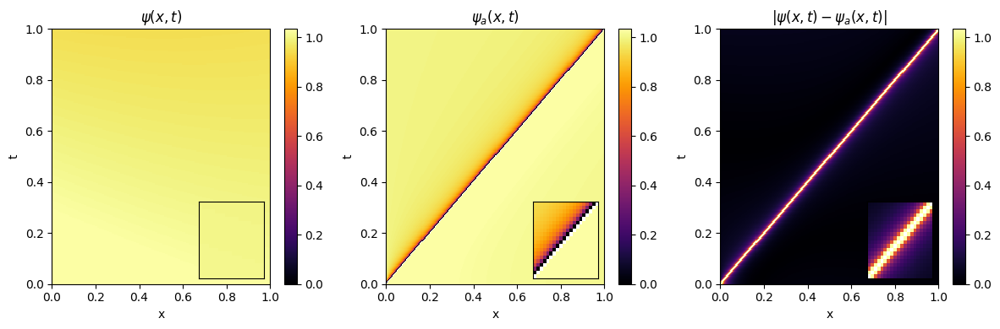

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


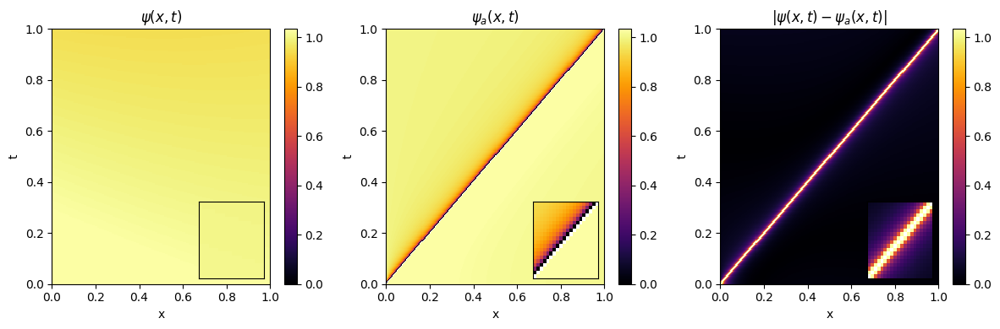

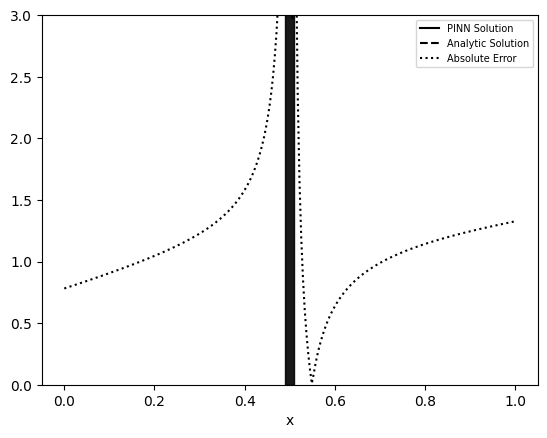

Average Behavior


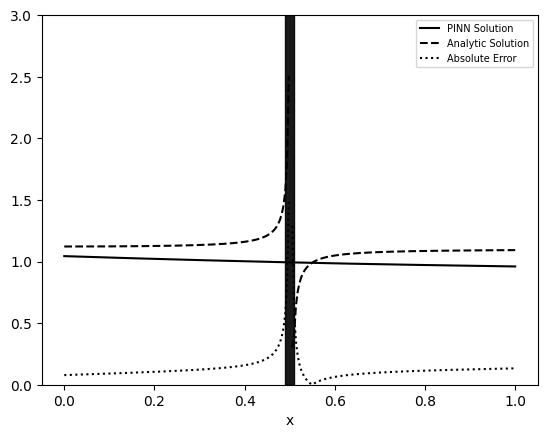

In [9]:

for i in range(sample_size):
    model_1 = generate_evolution_model(throat, 500, 500, 10, 1, lr, iterations,1);
    analytic_v_1 += plot_evolution_model(throat, model_1)[0];
    v_1 += plot_evolution_model(throat, model_1)[1];
    diff_1 += plot_evolution_model(throat, model_1)[2];
    plot_evolution_slice(throat, 0.5, analytic_v_1, v_1, diff_1)
    
    
print("Average Behavior")
analytic_v_1 = analytic_v_1/sample_size
v_1 = v_1/sample_size 
diff_1 = diff_1/sample_size 

plot_evolution_slice(throat, 0.5, analytic_v_1, v_1, diff_1)


# N = 2

Compiling model...
Building feed-forward neural network...
'build' took 0.031470 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.857557 s

Initializing variables...
Training model...

Step      Train loss                                            Test loss                                             Test metric
0         [1.03e-02, 5.92e-01, 4.79e-02, 3.30e-01, 4.86e-01]    [1.03e-02, 5.92e-01, 4.79e-02, 3.30e-01, 4.86e-01]    []  
1000      [1.86e-06, 9.83e-03, 3.65e-04, 2.49e-03, 4.45e-04]    [1.86e-06, 9.83e-03, 3.65e-04, 2.49e-03, 4.45e-04]    []  
2000      [3.16e-06, 9.66e-03, 4.46e-04, 2.42e-03, 4.36e-04]    [3.16e-06, 9.66e-03, 4.46e-04, 2.42e-03, 4.36e-04]    []  
3000      [5.63e-06, 9.58e-03, 4.98e-04, 2.40e-03, 4.41e-04]    [5.63e-06, 9.58e-03, 4.98e-04, 2.40e-03, 4.41e-04]    []  
4000      [4.64e-06, 9.55e-03, 5.25e-04, 2.40e-03, 4.43e-04]    [4.64e-06, 9.55e-03, 5.25e-04, 2.40e-03, 4.43e-04]    []  
5000      [3.92e-06, 9.55e-03, 5.02e-04, 2.44e-03, 4.26e-04]    [3.92e-06, 9.55e-03, 5.02e-04, 2.44e-03, 4.26e-04]    []  
6000      [4.52e-06, 9.56e-03, 5.03e-04, 2.41e-03, 4.51e-04]

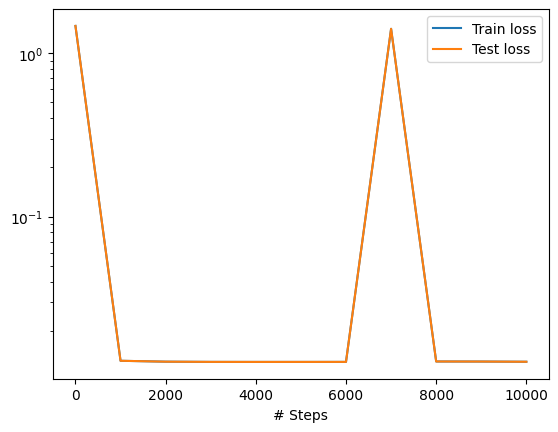

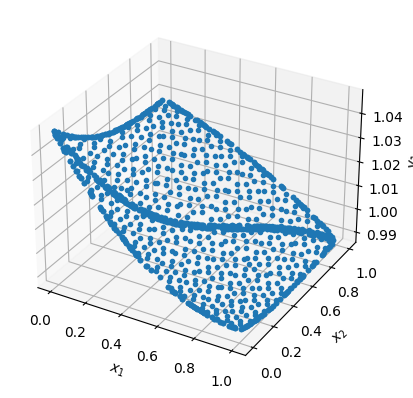

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


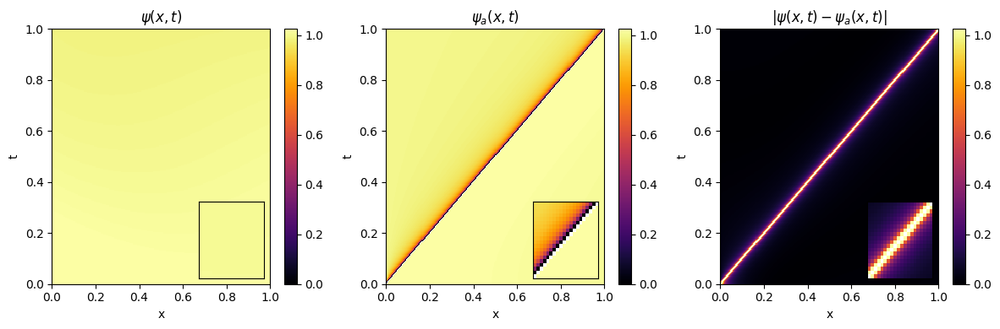

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


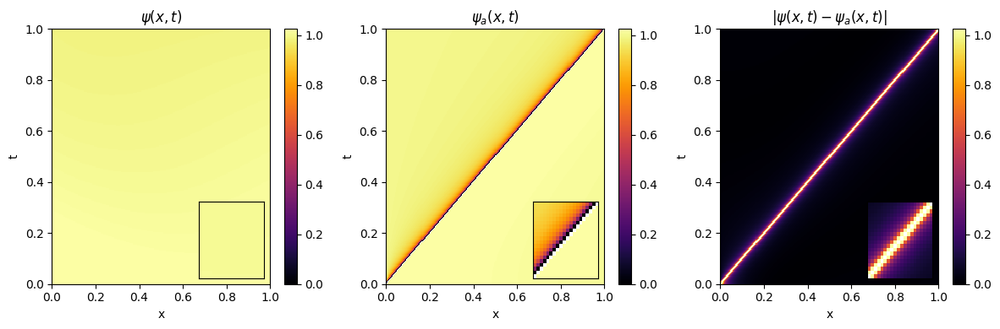

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


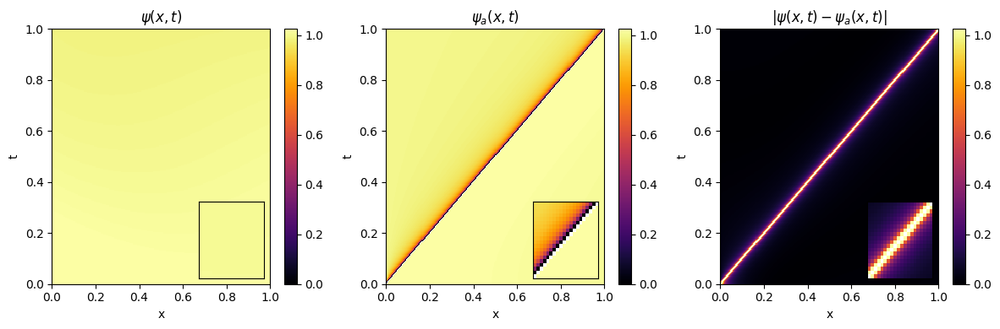

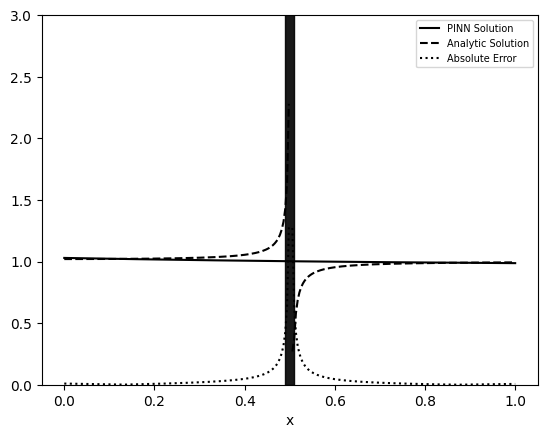

Compiling model...
Building feed-forward neural network...
'build' took 0.031566 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.875438 s

Initializing variables...
Training model...

Step      Train loss                                            Test loss                                             Test metric
0         [1.42e-03, 9.72e-01, 3.37e-02, 6.66e-01, 5.15e-01]    [1.42e-03, 9.72e-01, 3.37e-02, 6.66e-01, 5.15e-01]    []  
1000      [1.77e-05, 9.79e-03, 7.78e-04, 2.94e-03, 3.54e-04]    [1.77e-05, 9.79e-03, 7.78e-04, 2.94e-03, 3.54e-04]    []  
2000      [1.15e-05, 9.74e-03, 7.88e-04, 2.95e-03, 3.52e-04]    [1.15e-05, 9.74e-03, 7.88e-04, 2.95e-03, 3.52e-04]    []  
3000      [1.06e-05, 9.09e-03, 7.63e-04, 4.60e-03, 9.96e-06]    [1.06e-05, 9.09e-03, 7.63e-04, 4.60e-03, 9.96e-06]    []  
4000      [1.27e-05, 9.62e-03, 8.40e-04, 2.98e-03, 3.41e-04]    [1.27e-05, 9.62e-03, 8.40e-04, 2.98e-03, 3.41e-04]    []  
5000      [1.04e-05, 9.44e-03, 8.10e-04, 3.38e-03, 1.94e-04]    [1.04e-05, 9.44e-03, 8.10e-04, 3.38e-03, 1.94e-04]    []  
6000      [1.23e-05, 9.85e-03, 7.48e-04, 2.98e-03, 3.49e-04]

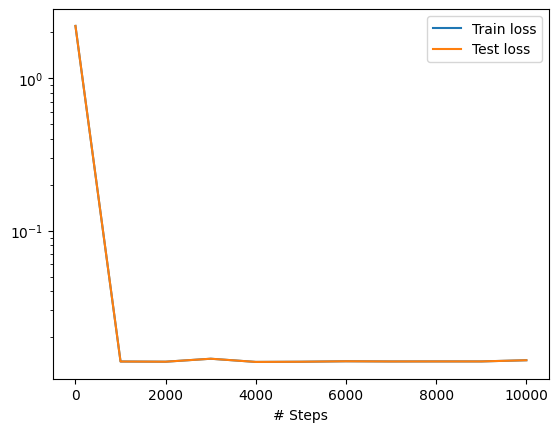

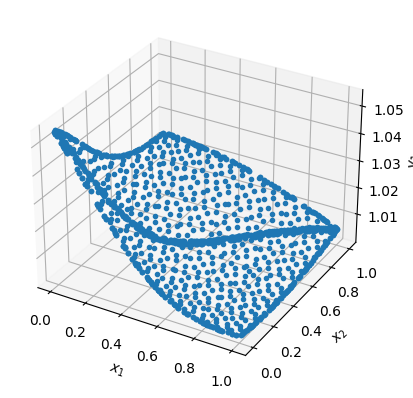

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


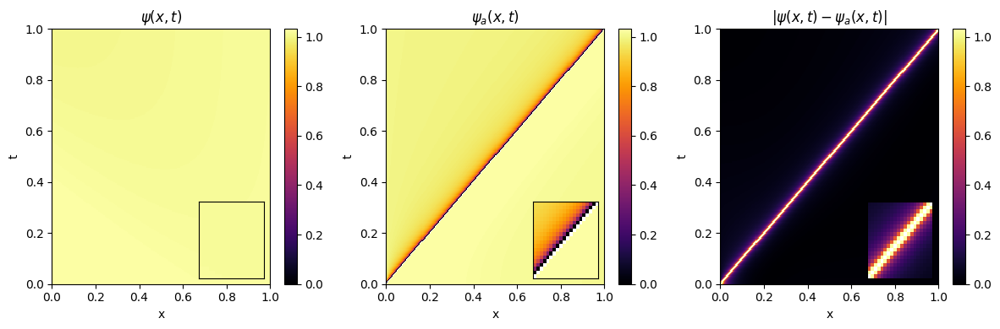

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


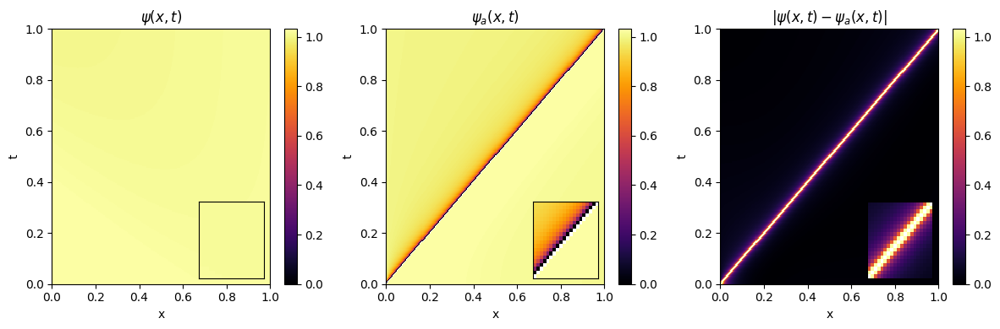

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


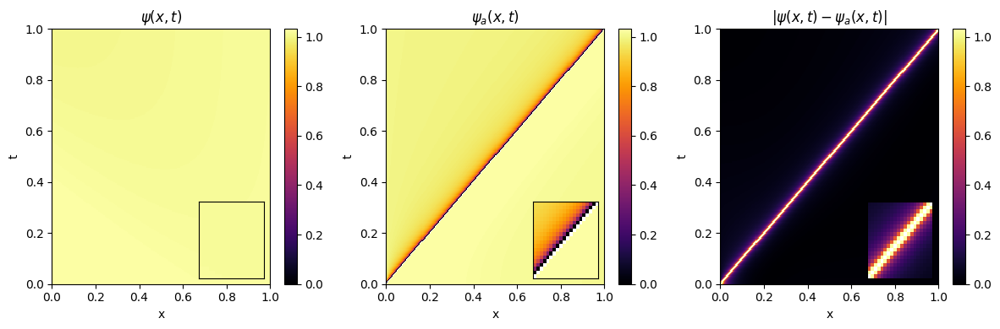

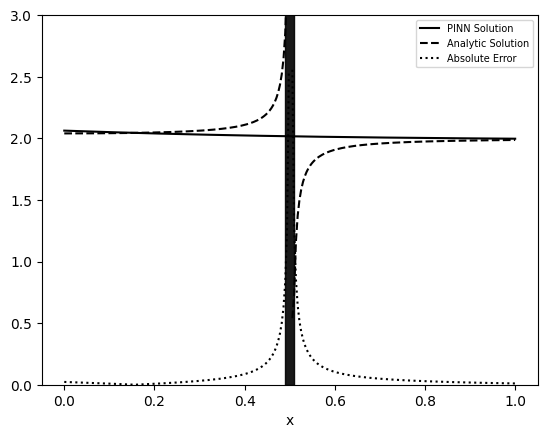

Compiling model...
Building feed-forward neural network...
'build' took 0.032529 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.907144 s

Initializing variables...
Training model...

Step      Train loss                                            Test loss                                             Test metric
0         [4.37e-02, 5.83e-01, 6.22e-03, 4.47e-01, 8.76e-01]    [4.37e-02, 5.83e-01, 6.22e-03, 4.47e-01, 8.76e-01]    []  
1000      [6.79e-06, 3.68e-03, 3.58e-04, 1.60e-03, 4.63e-06]    [6.79e-06, 3.68e-03, 3.58e-04, 1.60e-03, 4.63e-06]    []  
2000      [1.05e-06, 3.62e-03, 3.94e-04, 1.59e-03, 5.39e-06]    [1.05e-06, 3.62e-03, 3.94e-04, 1.59e-03, 5.39e-06]    []  
3000      [2.24e-06, 3.60e-03, 3.59e-04, 1.66e-03, 2.65e-06]    [2.24e-06, 3.60e-03, 3.59e-04, 1.66e-03, 2.65e-06]    []  
4000      [1.52e-06, 3.62e-03, 4.08e-04, 1.54e-03, 6.54e-06]    [1.52e-06, 3.62e-03, 4.08e-04, 1.54e-03, 6.54e-06]    []  
5000      [7.19e-06, 3.60e-03, 2.54e-04, 1.83e-03, 1.07e-06]    [7.19e-06, 3.60e-03, 2.54e-04, 1.83e-03, 1.07e-06]    []  
6000      [1.14e-06, 3.60e-03, 4.12e-04, 1.57e-03, 4.63e-06]

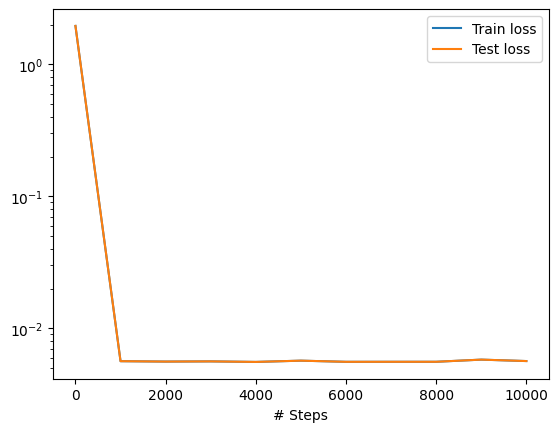

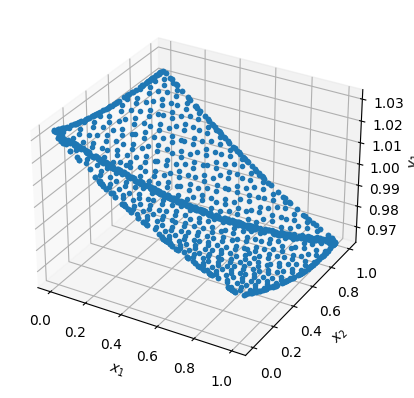

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


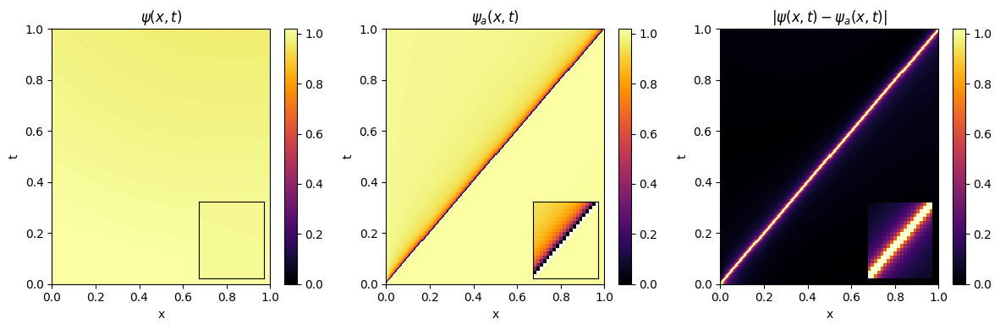

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


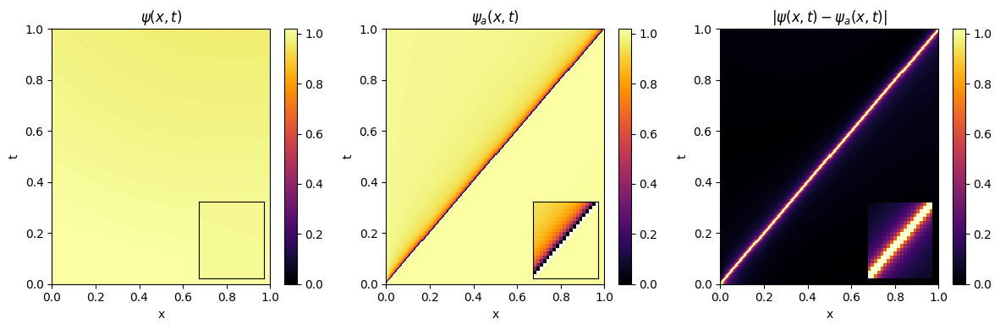

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


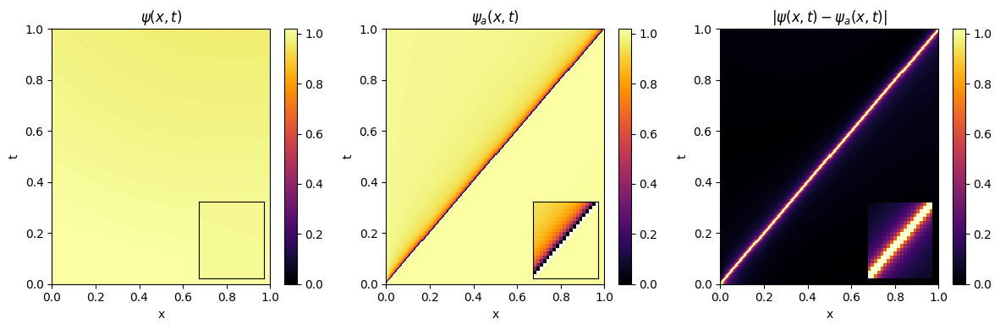

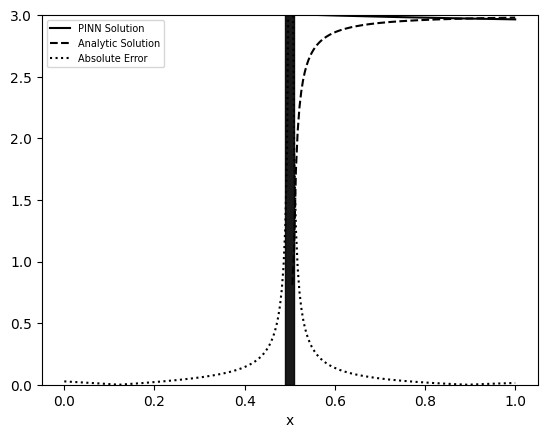

Compiling model...
Building feed-forward neural network...
'build' took 0.037941 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.927901 s

Initializing variables...
Training model...

Step      Train loss                                            Test loss                                             Test metric
0         [1.11e-01, 9.72e-01, 5.27e-02, 9.77e-01, 9.76e-01]    [1.11e-01, 9.72e-01, 5.27e-02, 9.77e-01, 9.76e-01]    []  
1000      [1.15e-05, 7.43e-03, 4.36e-04, 2.54e-03, 2.81e-04]    [1.15e-05, 7.43e-03, 4.36e-04, 2.54e-03, 2.81e-04]    []  
2000      [2.90e-06, 7.26e-03, 5.81e-04, 2.44e-03, 2.41e-04]    [2.90e-06, 7.26e-03, 5.81e-04, 2.44e-03, 2.41e-04]    []  
3000      [2.48e-06, 7.20e-03, 5.90e-04, 2.49e-03, 2.12e-04]    [2.48e-06, 7.20e-03, 5.90e-04, 2.49e-03, 2.12e-04]    []  
4000      [2.51e-06, 7.26e-03, 5.99e-04, 2.40e-03, 2.24e-04]    [2.51e-06, 7.26e-03, 5.99e-04, 2.40e-03, 2.24e-04]    []  
5000      [2.77e-06, 7.16e-03, 6.68e-04, 2.28e-03, 1.47e-04]    [2.77e-06, 7.16e-03, 6.68e-04, 2.28e-03, 1.47e-04]    []  
6000      [6.85e-05, 7.05e-03, 1.24e-03, 2.79e-03, 4.14e-06]

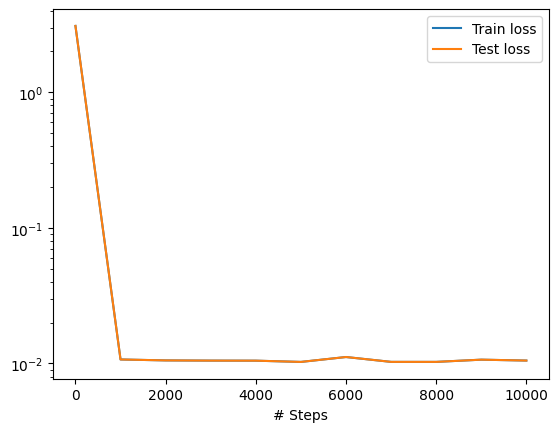

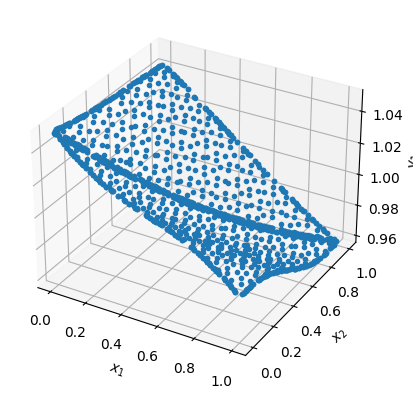

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


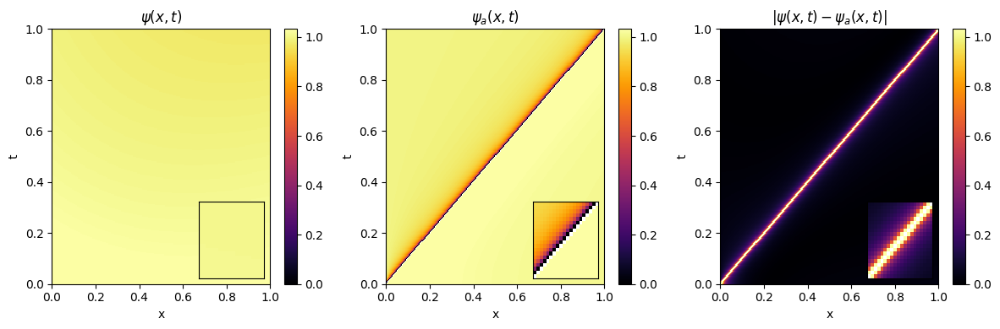

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


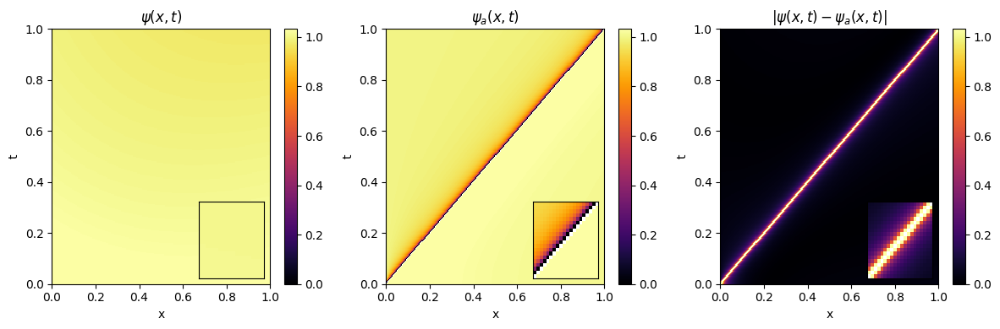

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


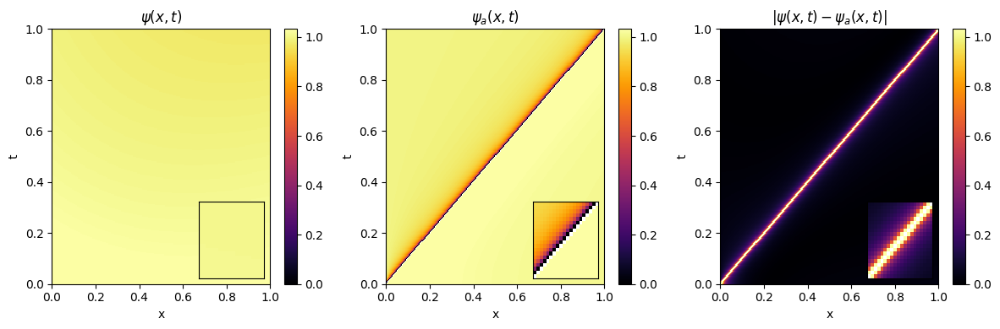

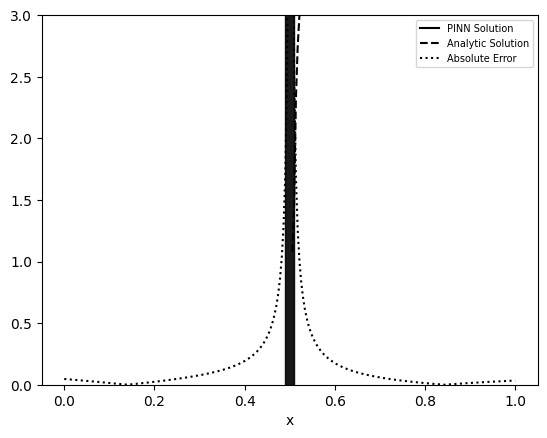

Compiling model...
Building feed-forward neural network...
'build' took 0.033971 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.969446 s

Initializing variables...
Training model...

Step      Train loss                                            Test loss                                             Test metric
0         [1.87e-03, 1.12e+00, 3.10e-01, 1.32e+00, 1.50e+00]    [1.87e-03, 1.12e+00, 3.10e-01, 1.32e+00, 1.50e+00]    []  
1000      [1.10e-05, 4.80e-02, 9.02e-04, 3.50e-03, 5.49e-04]    [1.10e-05, 4.80e-02, 9.02e-04, 3.50e-03, 5.49e-04]    []  
2000      [1.31e-05, 4.78e-02, 1.01e-03, 3.47e-03, 4.86e-04]    [1.31e-05, 4.78e-02, 1.01e-03, 3.47e-03, 4.86e-04]    []  
3000      [1.15e-05, 4.75e-02, 1.22e-03, 3.42e-03, 4.42e-04]    [1.15e-05, 4.75e-02, 1.22e-03, 3.42e-03, 4.42e-04]    []  
4000      [1.19e-05, 4.74e-02, 1.20e-03, 3.55e-03, 4.38e-04]    [1.19e-05, 4.74e-02, 1.20e-03, 3.55e-03, 4.38e-04]    []  
5000      [9.24e-06, 4.73e-02, 1.20e-03, 3.69e-03, 4.49e-04]    [9.24e-06, 4.73e-02, 1.20e-03, 3.69e-03, 4.49e-04]    []  
6000      [1.40e-05, 4.70e-02, 1.25e-03, 4.08e-03, 5.01e-04]

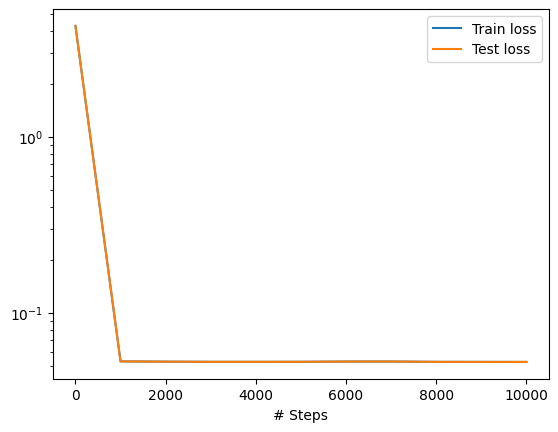

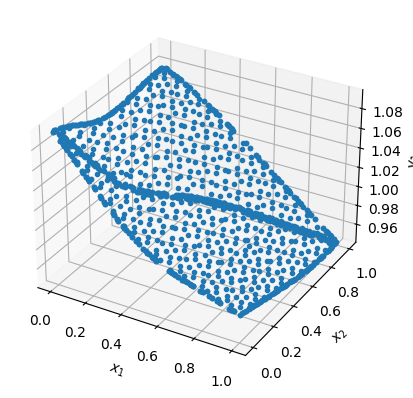

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


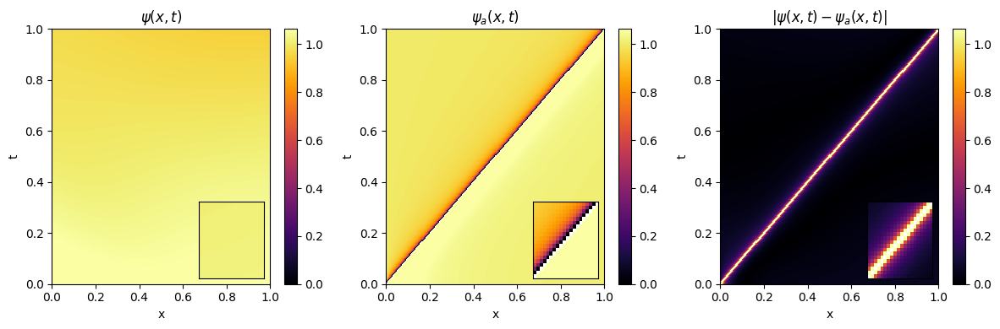

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


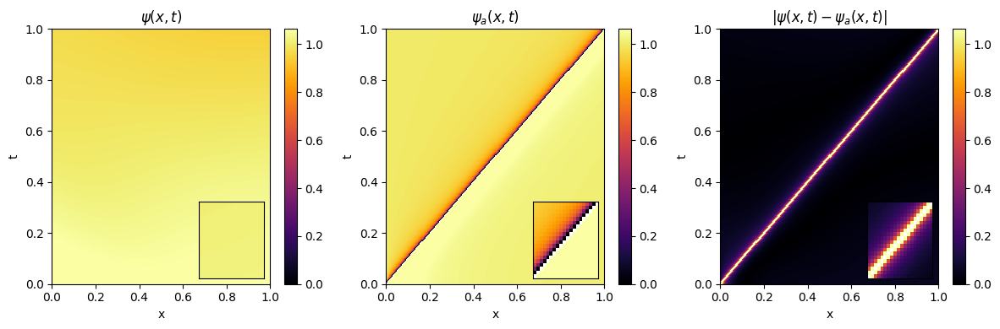

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


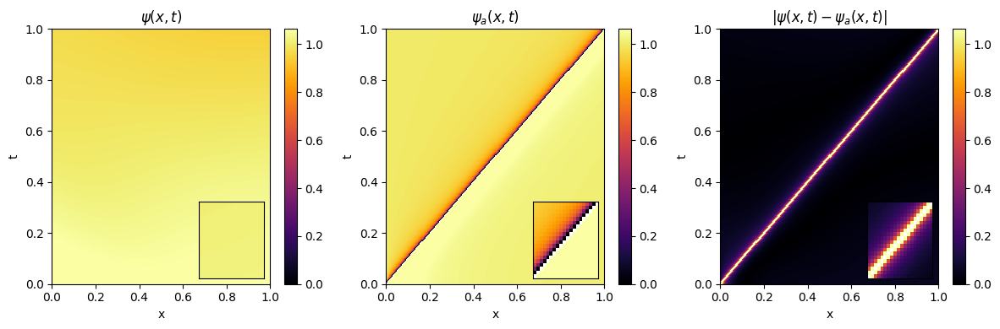

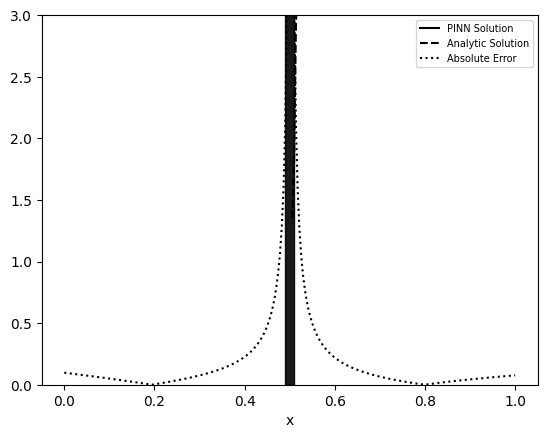

Compiling model...
Building feed-forward neural network...
'build' took 0.037213 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.126255 s

Initializing variables...
Training model...

Step      Train loss                                            Test loss                                             Test metric
0         [3.01e-02, 9.87e-01, 2.65e-01, 4.85e-01, 6.10e-01]    [3.01e-02, 9.87e-01, 2.65e-01, 4.85e-01, 6.10e-01]    []  
1000      [8.48e-06, 1.89e-03, 1.54e-04, 2.15e-03, 1.96e-04]    [8.48e-06, 1.89e-03, 1.54e-04, 2.15e-03, 1.96e-04]    []  
2000      [1.88e-07, 1.90e-03, 1.78e-04, 2.09e-03, 2.20e-04]    [1.88e-07, 1.90e-03, 1.78e-04, 2.09e-03, 2.20e-04]    []  
3000      [1.36e-07, 1.91e-03, 1.76e-04, 2.09e-03, 2.18e-04]    [1.36e-07, 1.91e-03, 1.76e-04, 2.09e-03, 2.18e-04]    []  
4000      [5.36e-08, 1.90e-03, 1.81e-04, 2.08e-03, 2.22e-04]    [5.36e-08, 1.90e-03, 1.81e-04, 2.08e-03, 2.22e-04]    []  
5000      [1.04e-06, 1.97e-03, 1.46e-04, 2.11e-03, 2.04e-04]    [1.04e-06, 1.97e-03, 1.46e-04, 2.11e-03, 2.04e-04]    []  
6000      [9.14e-07, 1.98e-03, 1.46e-04, 2.11e-03, 2.05e-04]

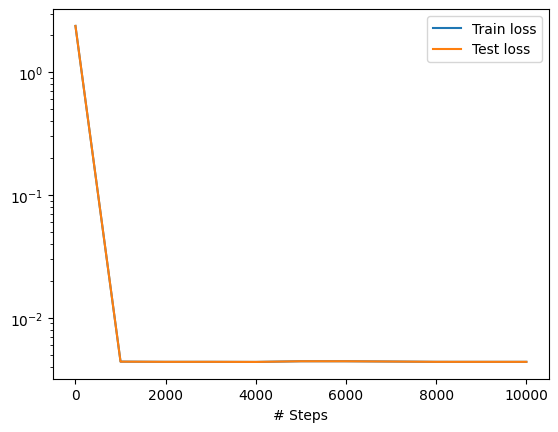

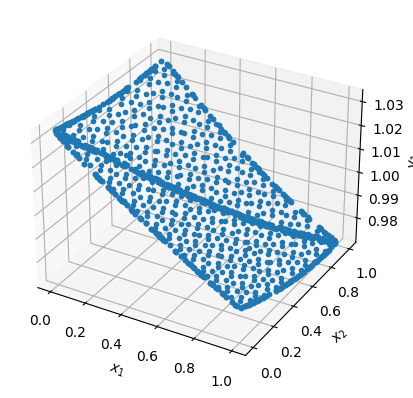

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


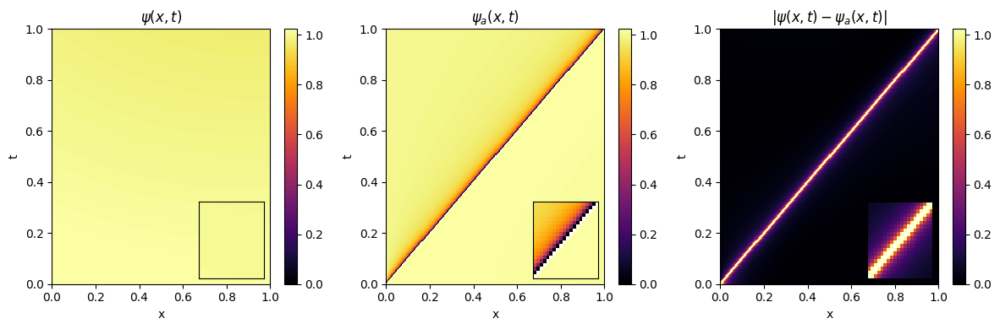

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


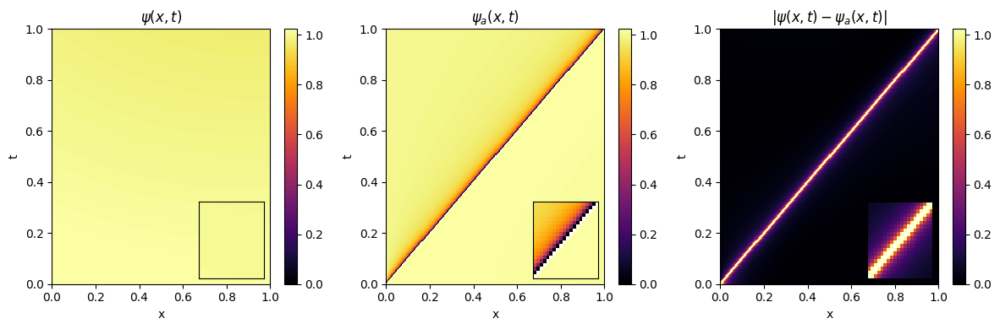

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


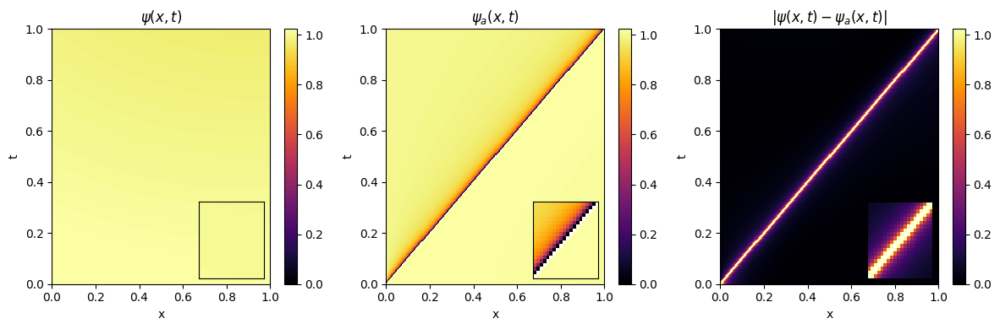

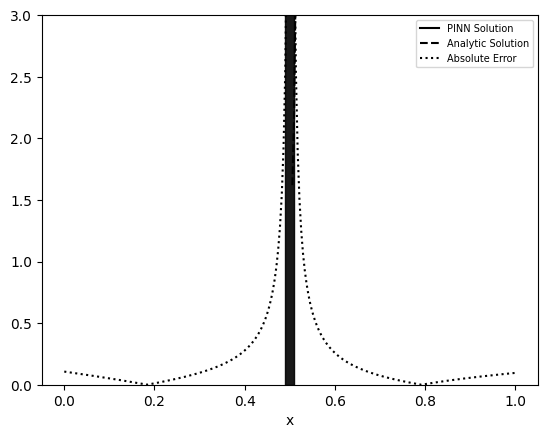

Compiling model...
Building feed-forward neural network...
'build' took 0.031393 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.997936 s

Initializing variables...
Training model...

Step      Train loss                                            Test loss                                             Test metric
0         [9.47e-04, 9.89e-01, 8.91e-03, 8.85e-01, 1.03e+00]    [9.47e-04, 9.89e-01, 8.91e-03, 8.85e-01, 1.03e+00]    []  
1000      [1.87e-06, 7.11e-03, 3.06e-04, 2.45e-03, 4.14e-04]    [1.87e-06, 7.11e-03, 3.06e-04, 2.45e-03, 4.14e-04]    []  
2000      [2.44e-06, 7.03e-03, 3.46e-04, 2.46e-03, 3.75e-04]    [2.44e-06, 7.03e-03, 3.46e-04, 2.46e-03, 3.75e-04]    []  
3000      [3.43e-06, 7.06e-03, 3.29e-04, 2.50e-03, 3.29e-04]    [3.43e-06, 7.06e-03, 3.29e-04, 2.50e-03, 3.29e-04]    []  
4000      [4.95e-06, 6.11e-03, 1.58e-04, 6.56e-03, 5.57e-04]    [4.95e-06, 6.11e-03, 1.58e-04, 6.56e-03, 5.57e-04]    []  
5000      [4.50e-06, 6.86e-03, 3.56e-04, 2.68e-03, 2.81e-04]    [4.50e-06, 6.86e-03, 3.56e-04, 2.68e-03, 2.81e-04]    []  
6000      [2.10e-06, 7.20e-03, 5.18e-04, 1.99e-03, 4.98e-04]

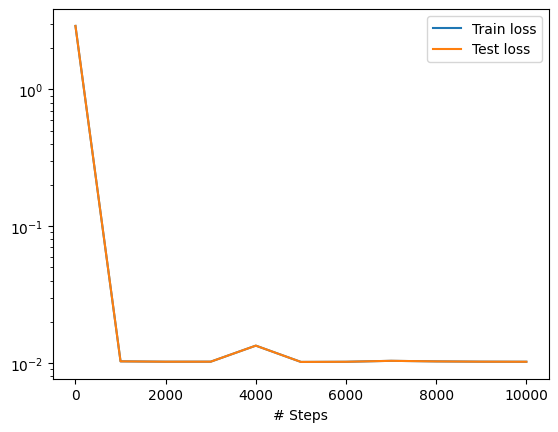

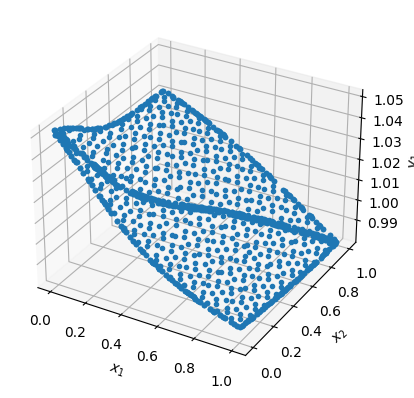

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


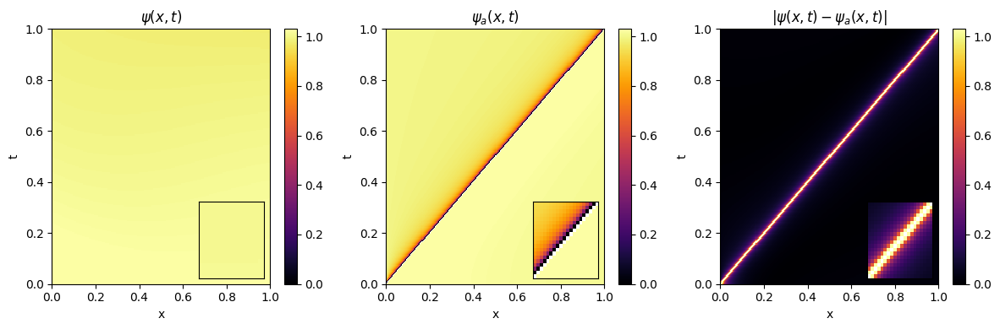

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


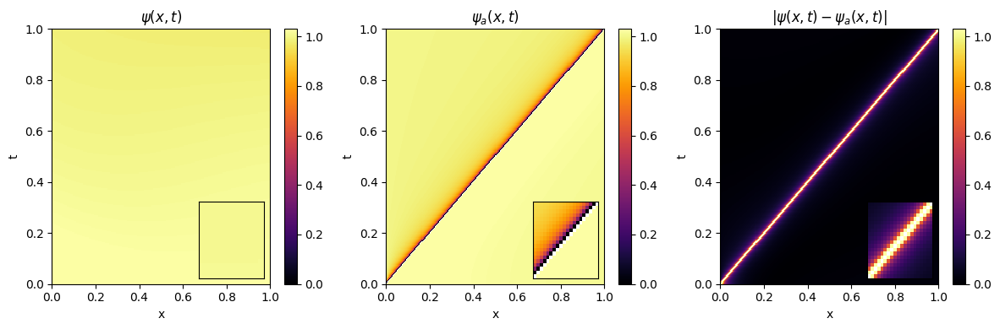

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


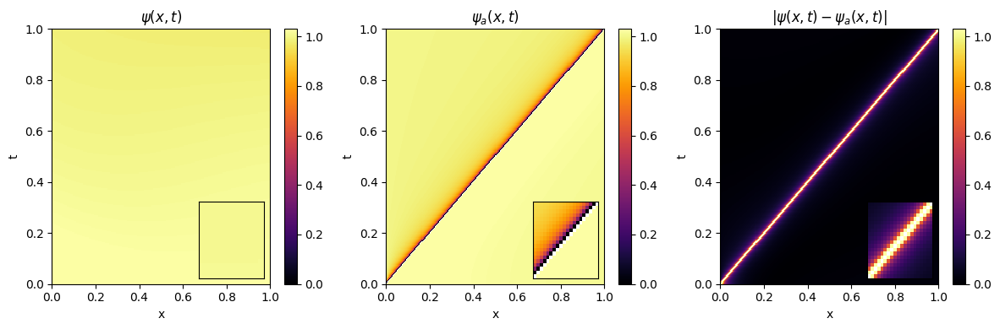

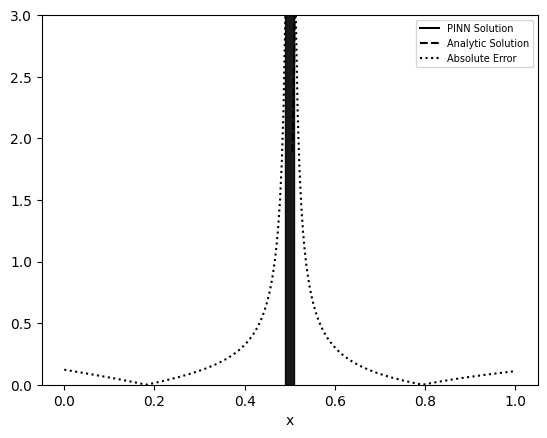

Compiling model...
Building feed-forward neural network...
'build' took 0.035898 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.978775 s

Initializing variables...
Training model...

Step      Train loss                                            Test loss                                             Test metric
0         [4.85e-02, 6.11e-01, 1.57e-01, 2.59e-01, 1.17e-01]    [4.85e-02, 6.11e-01, 1.57e-01, 2.59e-01, 1.17e-01]    []  
1000      [5.25e-06, 9.41e-03, 4.70e-04, 2.90e-03, 4.16e-04]    [5.25e-06, 9.41e-03, 4.70e-04, 2.90e-03, 4.16e-04]    []  
2000      [1.06e-05, 9.31e-03, 6.12e-04, 2.75e-03, 4.03e-04]    [1.06e-05, 9.31e-03, 6.12e-04, 2.75e-03, 4.03e-04]    []  
3000      [1.09e-05, 9.08e-03, 5.04e-04, 3.85e-03, 1.27e-04]    [1.09e-05, 9.08e-03, 5.04e-04, 3.85e-03, 1.27e-04]    []  
4000      [7.22e-05, 9.34e-03, 3.30e-04, 3.05e-03, 5.30e-04]    [7.22e-05, 9.34e-03, 3.30e-04, 3.05e-03, 5.30e-04]    []  
5000      [1.30e-05, 9.01e-03, 6.17e-04, 3.23e-03, 3.28e-04]    [1.30e-05, 9.01e-03, 6.17e-04, 3.23e-03, 3.28e-04]    []  
6000      [2.17e-05, 9.40e-03, 5.39e-04, 2.78e-03, 4.09e-04]

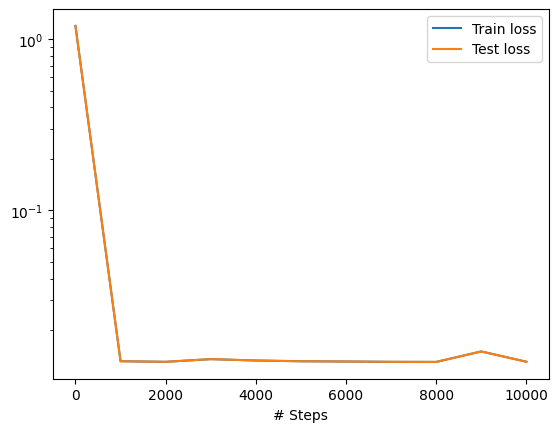

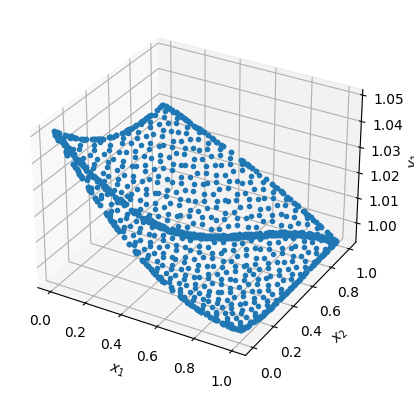

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


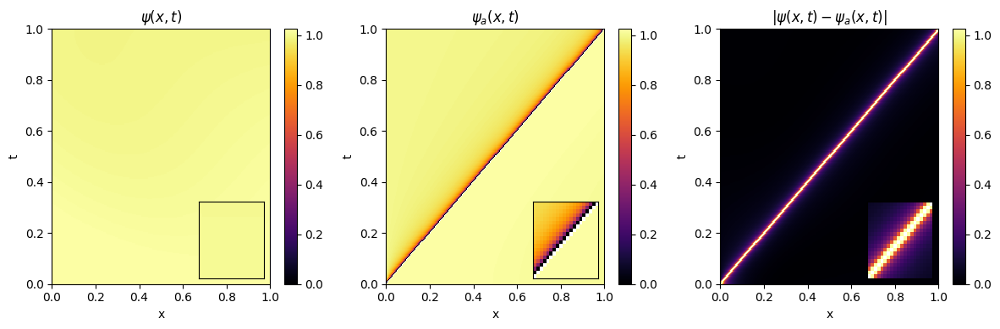

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


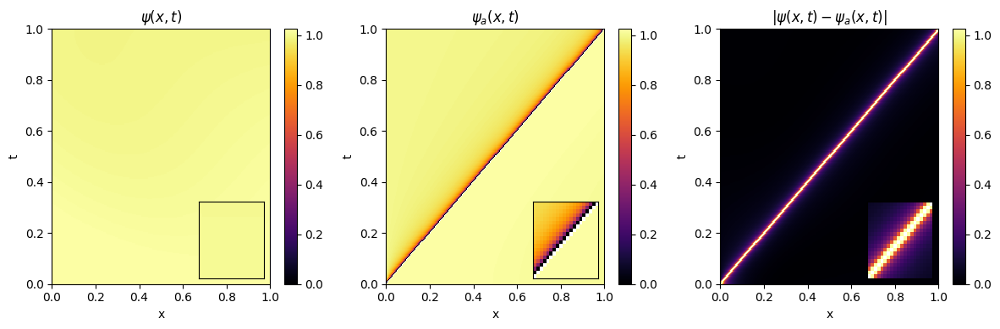

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


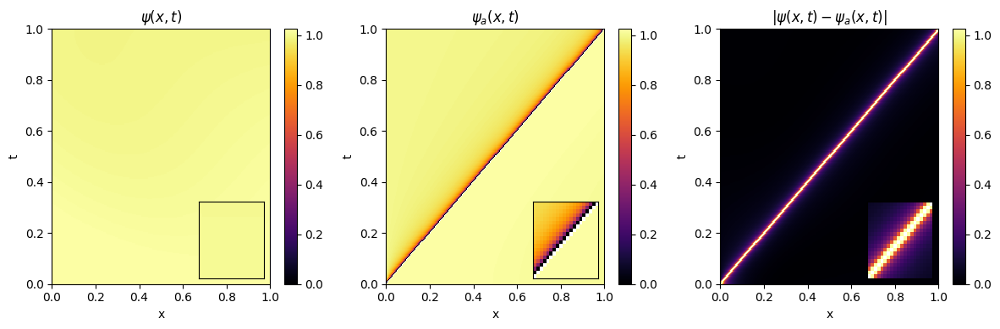

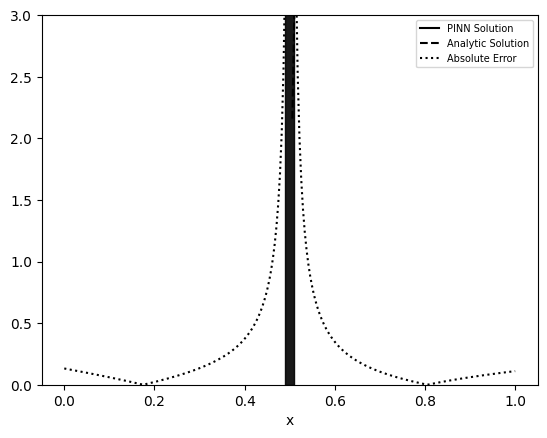

Compiling model...
Building feed-forward neural network...
'build' took 0.034385 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.021144 s

Initializing variables...
Training model...

Step      Train loss                                            Test loss                                             Test metric
0         [4.74e-02, 1.00e+00, 3.41e-01, 1.23e+00, 1.07e+00]    [4.74e-02, 1.00e+00, 3.41e-01, 1.23e+00, 1.07e+00]    []  
1000      [1.38e-05, 4.75e-02, 9.87e-04, 3.79e-03, 3.69e-04]    [1.38e-05, 4.75e-02, 9.87e-04, 3.79e-03, 3.69e-04]    []  
2000      [1.46e-05, 4.72e-02, 1.12e-03, 3.79e-03, 3.71e-04]    [1.46e-05, 4.72e-02, 1.12e-03, 3.79e-03, 3.71e-04]    []  
3000      [1.55e-05, 4.71e-02, 1.16e-03, 3.80e-03, 3.65e-04]    [1.55e-05, 4.71e-02, 1.16e-03, 3.80e-03, 3.65e-04]    []  
4000      [1.62e-05, 4.70e-02, 1.26e-03, 3.74e-03, 3.69e-04]    [1.62e-05, 4.70e-02, 1.26e-03, 3.74e-03, 3.69e-04]    []  
5000      [1.98e-05, 4.70e-02, 1.30e-03, 3.61e-03, 4.02e-04]    [1.98e-05, 4.70e-02, 1.30e-03, 3.61e-03, 4.02e-04]    []  
6000      [1.91e-05, 4.68e-02, 1.35e-03, 3.85e-03, 2.72e-04]

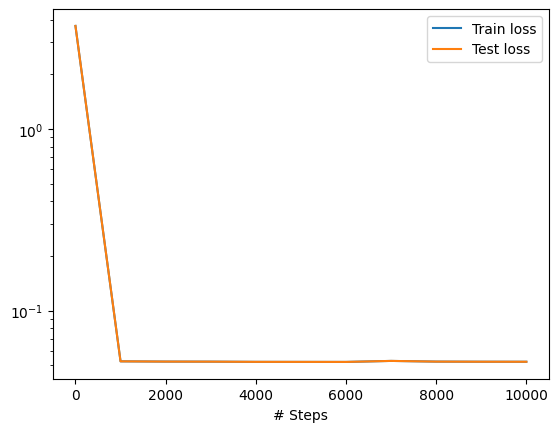

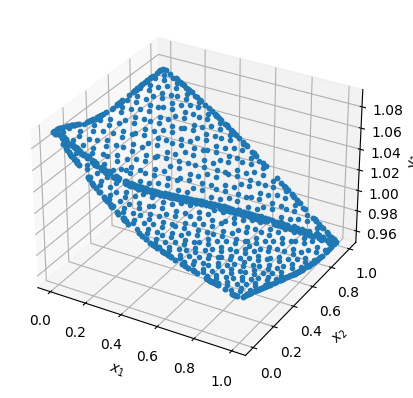

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


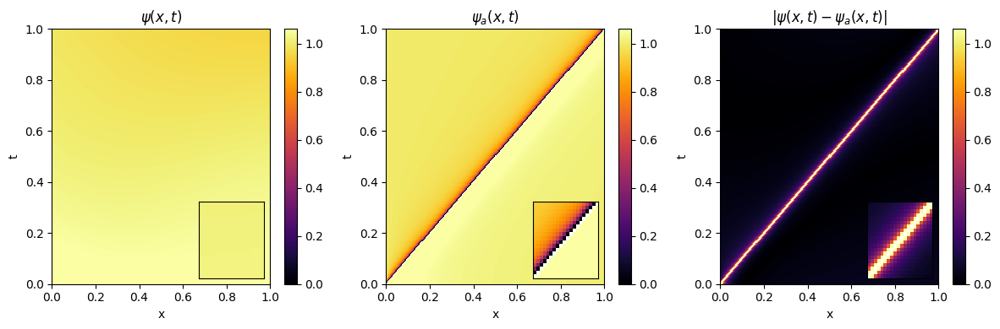

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


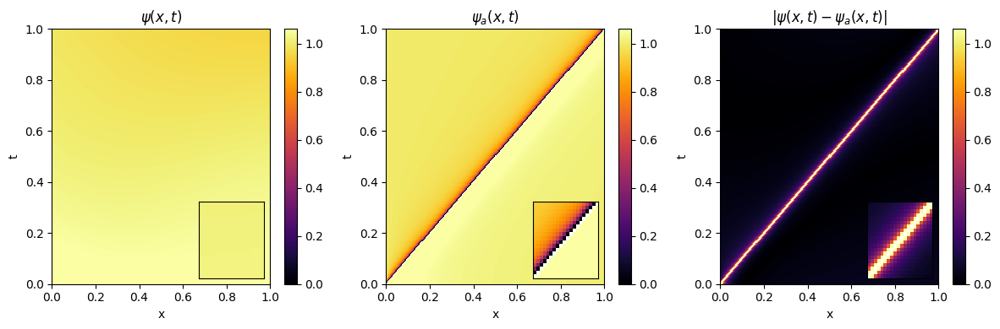

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


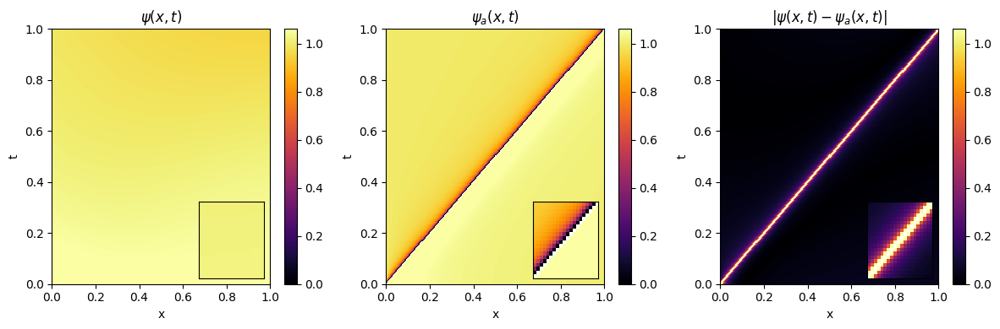

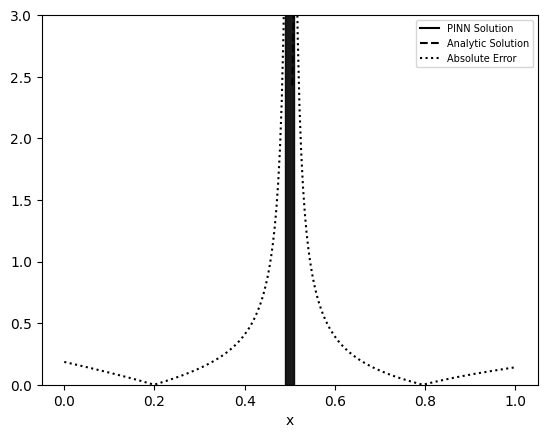

Compiling model...
Building feed-forward neural network...
'build' took 0.031977 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.018229 s

Initializing variables...
Training model...

Step      Train loss                                            Test loss                                             Test metric
0         [3.35e-02, 1.60e+00, 1.83e-01, 1.74e+00, 2.34e+00]    [3.35e-02, 1.60e+00, 1.83e-01, 1.74e+00, 2.34e+00]    []  
1000      [2.57e-05, 4.21e-02, 1.24e-03, 4.28e-03, 3.31e-04]    [2.57e-05, 4.21e-02, 1.24e-03, 4.28e-03, 3.31e-04]    []  
2000      [1.75e-05, 4.17e-02, 1.28e-03, 4.41e-03, 3.50e-04]    [1.75e-05, 4.17e-02, 1.28e-03, 4.41e-03, 3.50e-04]    []  
3000      [2.31e-05, 4.24e-02, 1.63e-03, 3.16e-03, 7.69e-04]    [2.31e-05, 4.24e-02, 1.63e-03, 3.16e-03, 7.69e-04]    []  
4000      [1.69e-05, 4.13e-02, 1.49e-03, 4.35e-03, 3.34e-04]    [1.69e-05, 4.13e-02, 1.49e-03, 4.35e-03, 3.34e-04]    []  
5000      [1.60e-05, 4.11e-02, 1.43e-03, 4.75e-03, 2.73e-04]    [1.60e-05, 4.11e-02, 1.43e-03, 4.75e-03, 2.73e-04]    []  
6000      [1.73e-05, 4.14e-02, 1.51e-03, 4.20e-03, 3.67e-04]

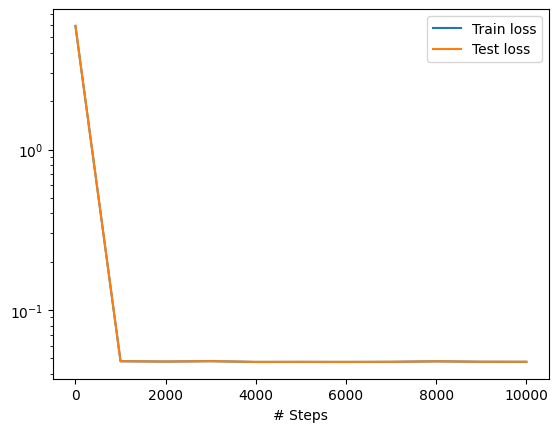

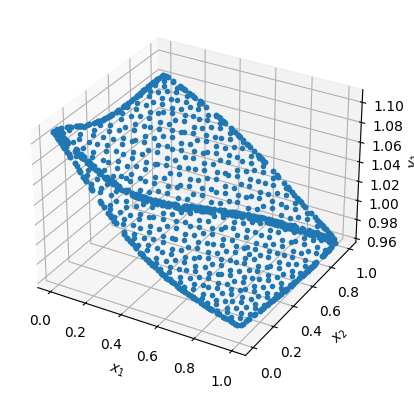

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


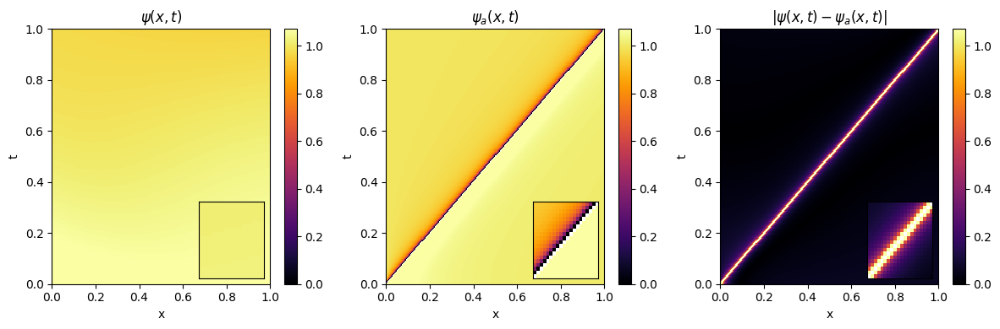

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


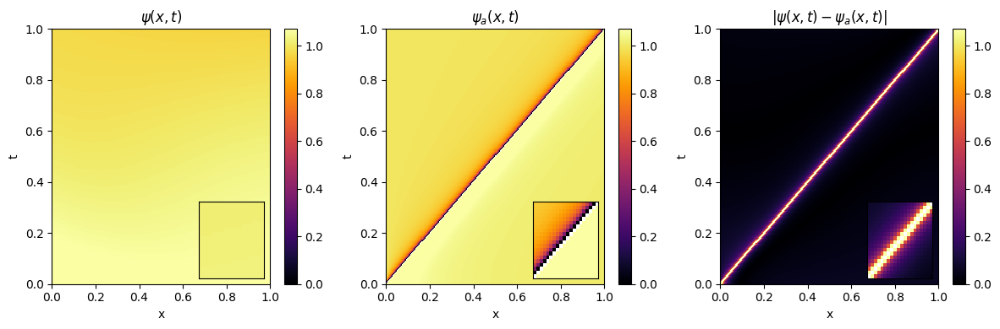

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


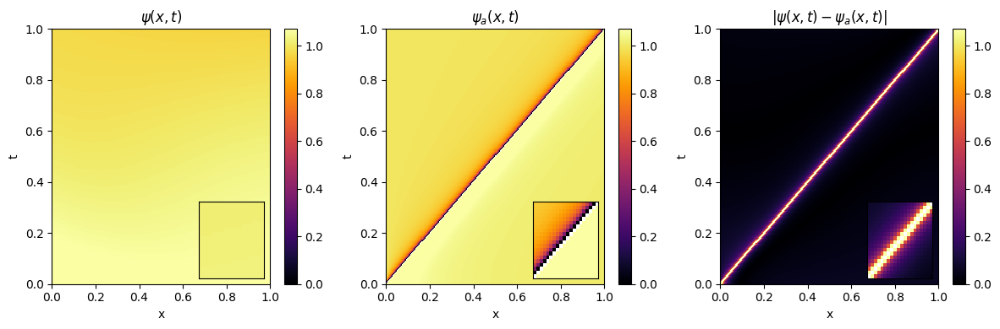

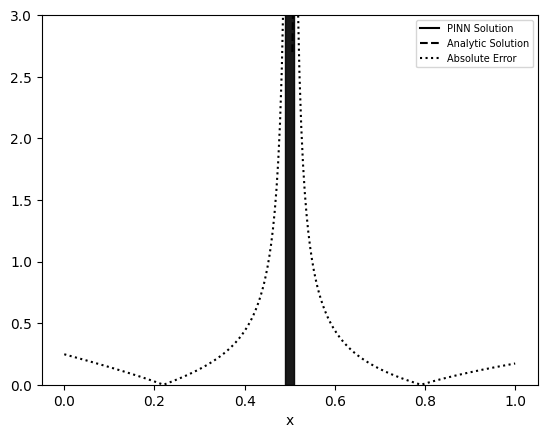

Average Behavior


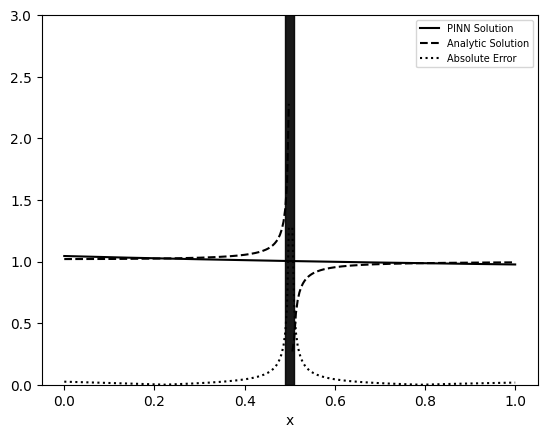

In [10]:

for i in range(sample_size):
    model_2 = generate_evolution_model(throat, 500, 500, 10, 1, lr, iterations,2);
    analytic_v_2 += plot_evolution_model(throat, model_2)[0];
    v_2 += plot_evolution_model(throat, model_2)[1];
    diff_2 += plot_evolution_model(throat, model_2)[2];
    plot_evolution_slice(throat, 0.5, analytic_v_2, v_2, diff_2)
    
    
print("Average Behavior")
analytic_v_2 = analytic_v_2/sample_size
v_2 = v_2/sample_size 
diff_2 = diff_2/sample_size 

plot_evolution_slice(throat, 0.5, analytic_v_2, v_2, diff_2)


# N = 3

Compiling model...
Building feed-forward neural network...
'build' took 0.033004 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.109411 s

Initializing variables...
Training model...

Step      Train loss                                                      Test loss                                                       Test metric
0         [3.64e-02, 5.24e-01, 5.17e-02, 4.10e-01, 1.86e-01, 3.55e-01]    [3.64e-02, 5.24e-01, 5.17e-02, 4.10e-01, 1.86e-01, 3.55e-01]    []  
1000      [1.56e-05, 4.45e-02, 1.02e-03, 4.78e-03, 3.63e-04, 1.09e-04]    [1.56e-05, 4.45e-02, 1.02e-03, 4.78e-03, 3.63e-04, 1.09e-04]    []  
2000      [1.72e-05, 4.44e-02, 1.08e-03, 4.75e-03, 3.71e-04, 1.03e-04]    [1.72e-05, 4.44e-02, 1.08e-03, 4.75e-03, 3.71e-04, 1.03e-04]    []  
3000      [1.59e-05, 4.42e-02, 1.24e-03, 4.61e-03, 3.98e-04, 1.06e-04]    [1.59e-05, 4.42e-02, 1.24e-03, 4.61e-03, 3.98e-04, 1.06e-04]    []  
4000      [1.63e-05, 4.41e-02, 1.29e-03, 4.67e-03, 3.71e-04, 9.96e-05]    [1.63e-05, 4.41e-02, 1.29e-03, 4.67e-03, 3.71e-04, 9.96e-05]    []  
5000      [1.59e-05, 4.41e-02, 1.28e-03, 4.77e-03, 3.33e-04, 8.

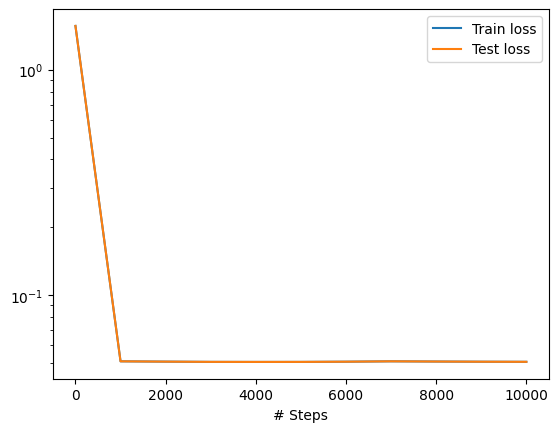

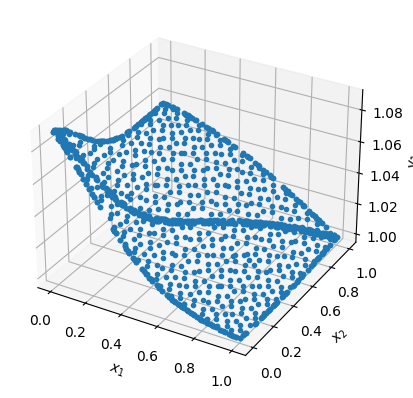

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


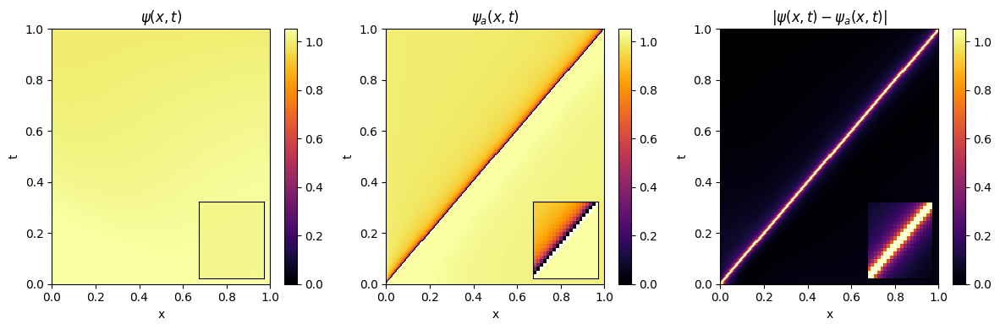

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


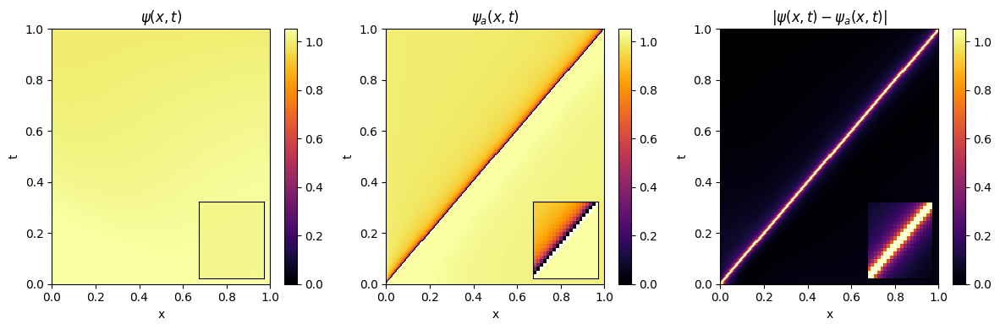

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


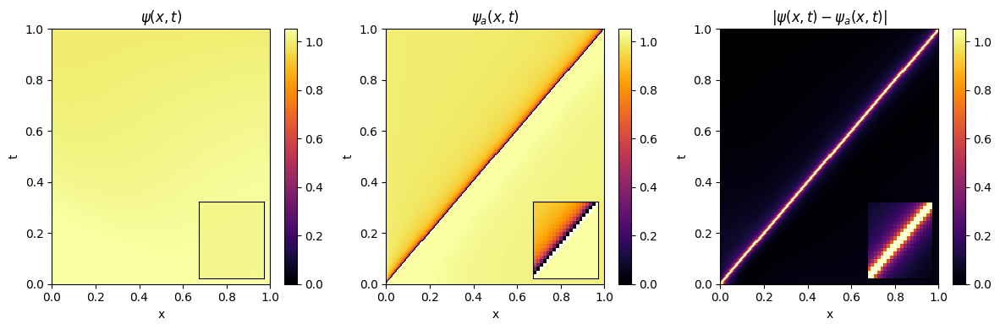

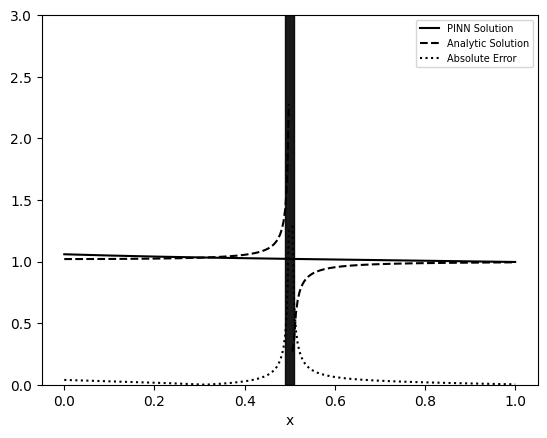

Compiling model...
Building feed-forward neural network...
'build' took 0.040886 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.114328 s

Initializing variables...
Training model...

Step      Train loss                                                      Test loss                                                       Test metric
0         [5.27e-03, 1.31e+00, 4.85e-02, 9.54e-01, 1.09e+00, 1.08e+00]    [5.27e-03, 1.31e+00, 4.85e-02, 9.54e-01, 1.09e+00, 1.08e+00]    []  
1000      [2.13e-07, 2.42e-03, 1.50e-04, 2.92e-03, 2.77e-04, 2.01e-04]    [2.13e-07, 2.42e-03, 1.50e-04, 2.92e-03, 2.77e-04, 2.01e-04]    []  
2000      [2.02e-06, 2.44e-03, 1.55e-04, 2.88e-03, 2.85e-04, 1.87e-04]    [2.02e-06, 2.44e-03, 1.55e-04, 2.88e-03, 2.85e-04, 1.87e-04]    []  
3000      [2.23e-06, 2.51e-03, 1.42e-04, 2.79e-03, 3.13e-04, 1.58e-04]    [2.23e-06, 2.51e-03, 1.42e-04, 2.79e-03, 3.13e-04, 1.58e-04]    []  
4000      [1.02e-06, 2.46e-03, 1.47e-04, 2.86e-03, 2.93e-04, 1.81e-04]    [1.02e-06, 2.46e-03, 1.47e-04, 2.86e-03, 2.93e-04, 1.81e-04]    []  
5000      [1.23e-06, 2.64e-03, 1.05e-04, 2.76e-03, 3.18e-04, 2.

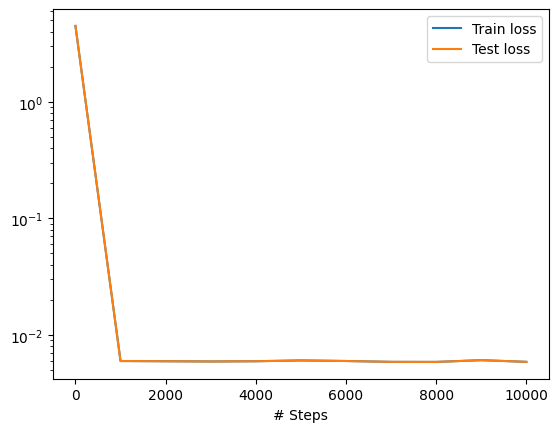

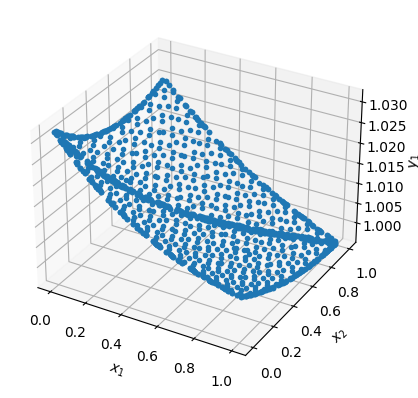

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


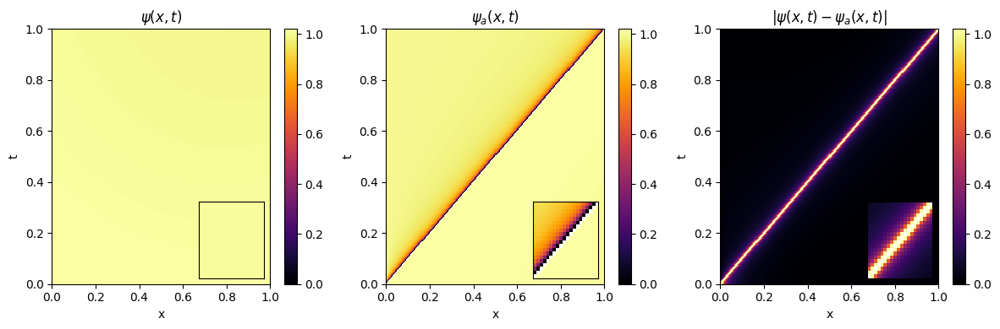

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


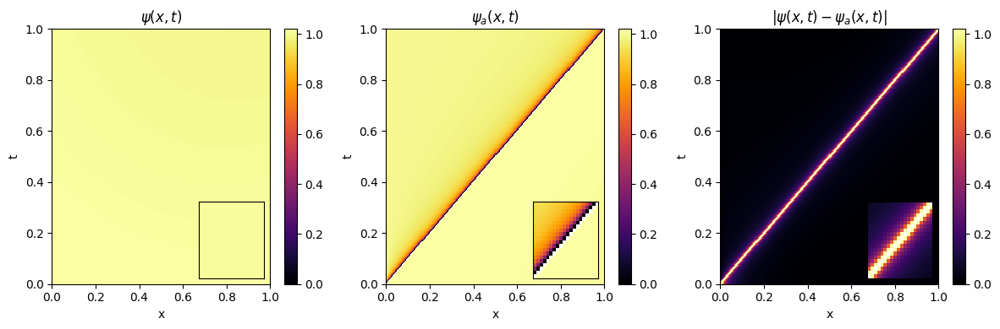

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


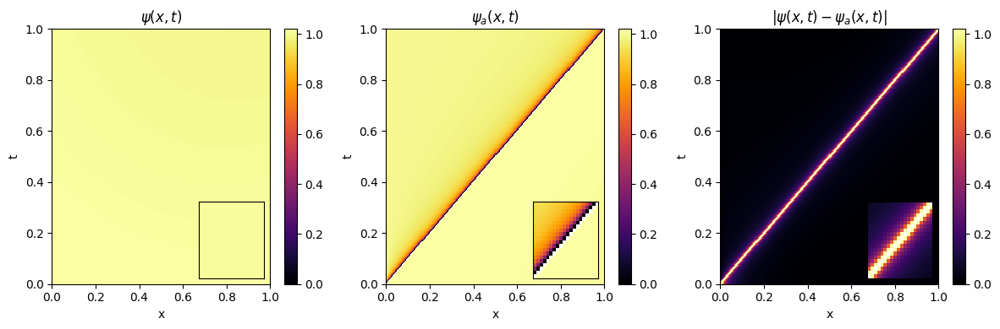

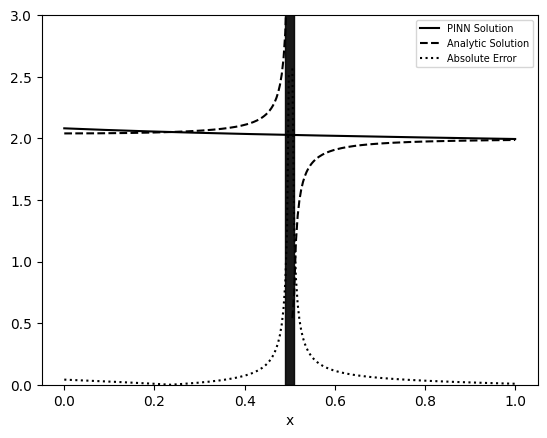

Compiling model...
Building feed-forward neural network...
'build' took 0.033498 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.172611 s

Initializing variables...
Training model...

Step      Train loss                                                      Test loss                                                       Test metric
0         [2.96e-01, 2.89e+00, 7.79e-02, 2.24e+00, 2.46e+00, 2.96e+00]    [2.96e-01, 2.89e+00, 7.79e-02, 2.24e+00, 2.46e+00, 2.96e+00]    []  
1000      [3.13e-05, 3.61e-03, 1.51e-04, 2.90e-03, 1.71e-04, 2.36e-04]    [3.13e-05, 3.61e-03, 1.51e-04, 2.90e-03, 1.71e-04, 2.36e-04]    []  
2000      [4.58e-06, 3.57e-03, 2.25e-04, 2.85e-03, 1.72e-04, 2.34e-04]    [4.58e-06, 3.57e-03, 2.25e-04, 2.85e-03, 1.72e-04, 2.34e-04]    []  
3000      [9.00e-07, 3.56e-03, 2.34e-04, 2.84e-03, 1.71e-04, 2.36e-04]    [9.00e-07, 3.56e-03, 2.34e-04, 2.84e-03, 1.71e-04, 2.36e-04]    []  
4000      [1.23e-06, 3.57e-03, 2.25e-04, 2.87e-03, 1.65e-04, 2.13e-04]    [1.23e-06, 3.57e-03, 2.25e-04, 2.87e-03, 1.65e-04, 2.13e-04]    []  
5000      [9.72e-07, 3.54e-03, 2.52e-04, 2.82e-03, 1.59e-04, 2.

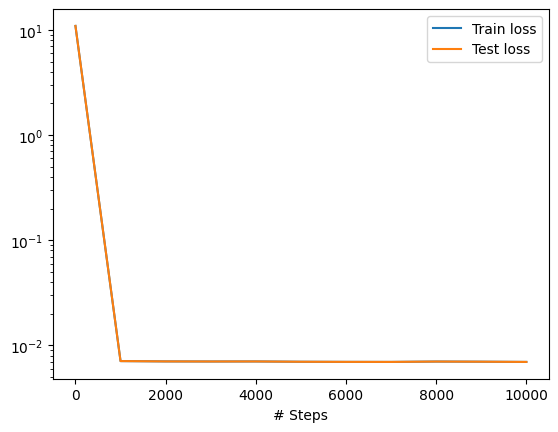

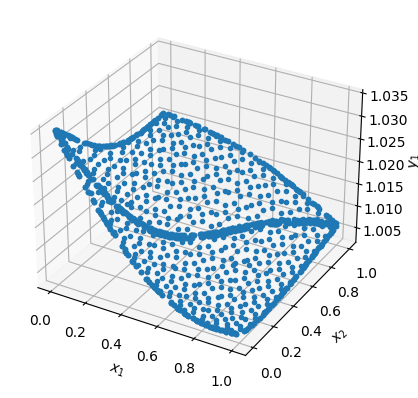

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


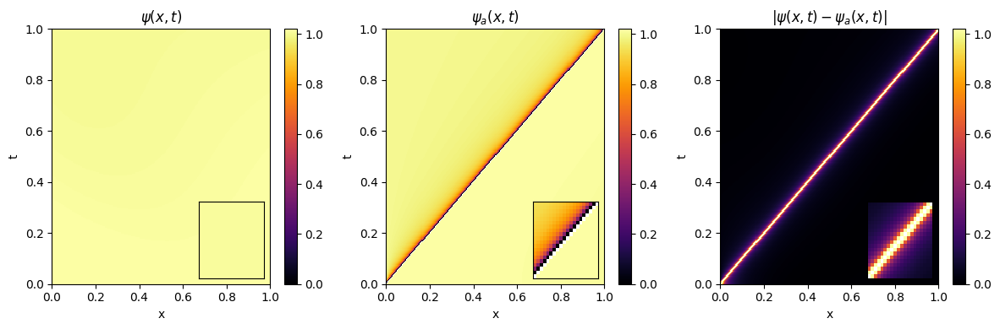

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


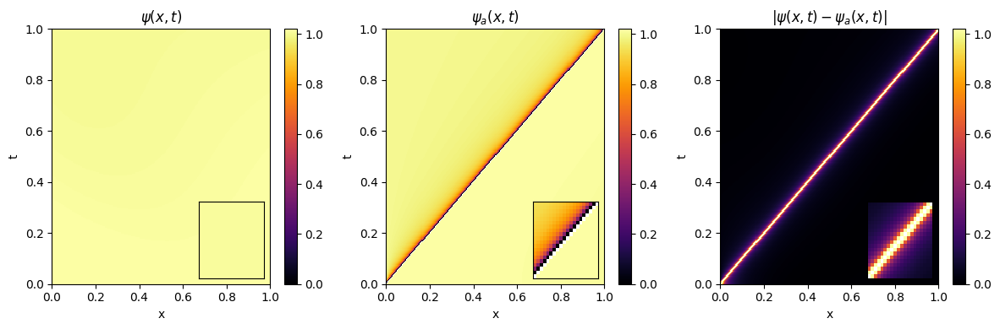

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


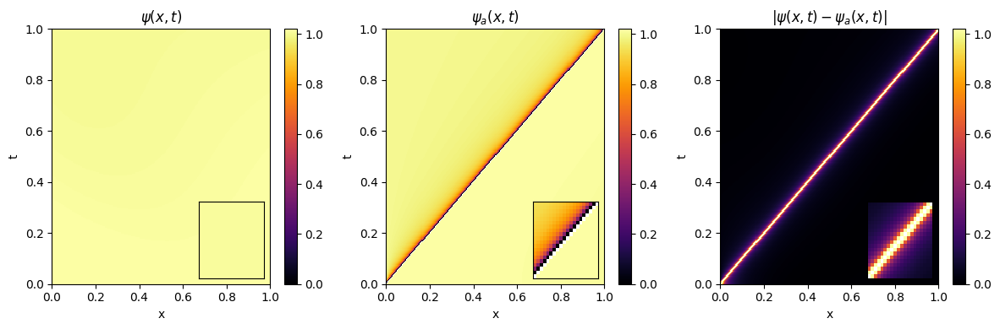

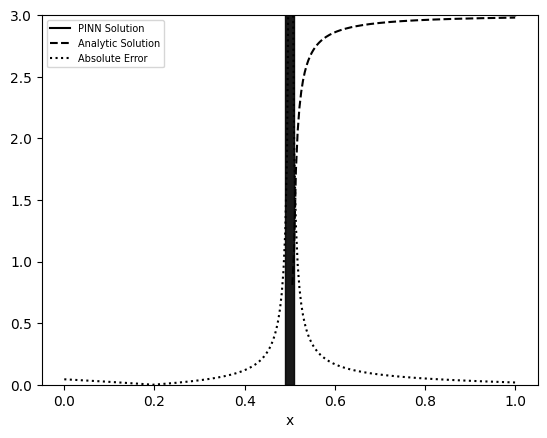

Compiling model...
Building feed-forward neural network...
'build' took 0.032339 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.187172 s

Initializing variables...
Training model...

Step      Train loss                                                      Test loss                                                       Test metric
0         [7.69e-03, 7.60e-01, 3.39e-02, 7.33e-01, 6.80e-01, 8.40e-01]    [7.69e-03, 7.60e-01, 3.39e-02, 7.33e-01, 6.80e-01, 8.40e-01]    []  
1000      [5.33e-06, 7.34e-03, 4.44e-04, 2.79e-03, 2.25e-04, 8.45e-05]    [5.33e-06, 7.34e-03, 4.44e-04, 2.79e-03, 2.25e-04, 8.45e-05]    []  
2000      [4.54e-06, 7.41e-03, 2.31e-04, 2.98e-03, 2.03e-04, 9.86e-05]    [4.54e-06, 7.41e-03, 2.31e-04, 2.98e-03, 2.03e-04, 9.86e-05]    []  
3000      [3.87e-06, 7.30e-03, 4.52e-04, 2.79e-03, 2.23e-04, 8.84e-05]    [3.87e-06, 7.30e-03, 4.52e-04, 2.79e-03, 2.23e-04, 8.84e-05]    []  
4000      [3.49e-06, 7.30e-03, 4.48e-04, 2.82e-03, 2.12e-04, 7.81e-05]    [3.49e-06, 7.30e-03, 4.48e-04, 2.82e-03, 2.12e-04, 7.81e-05]    []  
5000      [2.07e-06, 7.70e-03, 7.44e-04, 1.71e-03, 9.04e-04, 5.

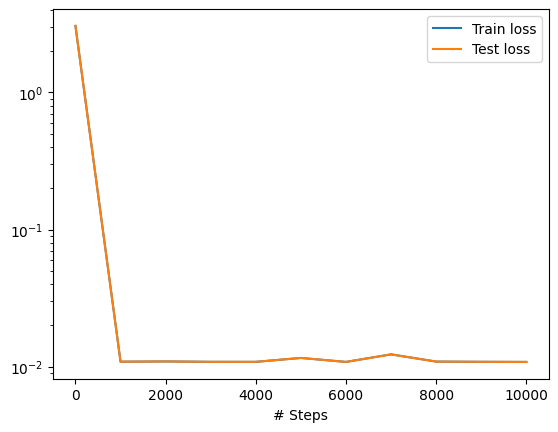

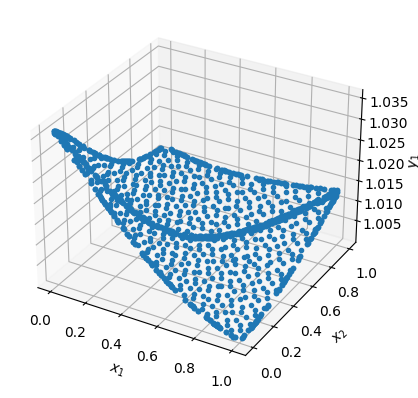

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


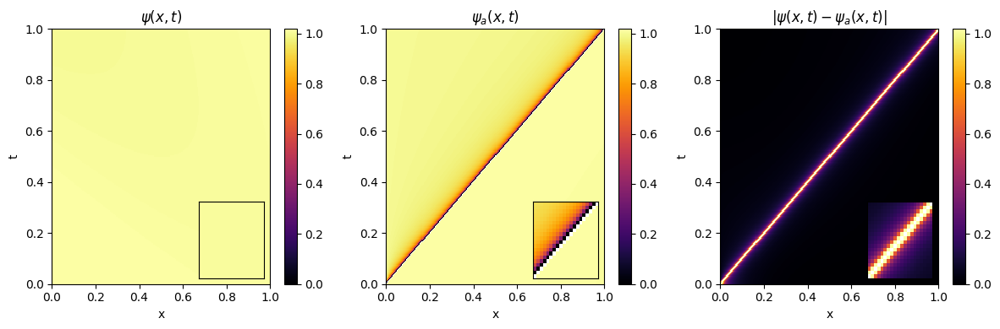

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


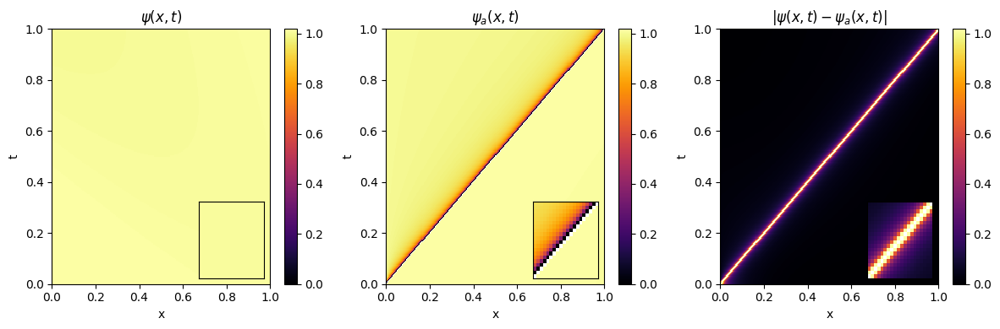

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


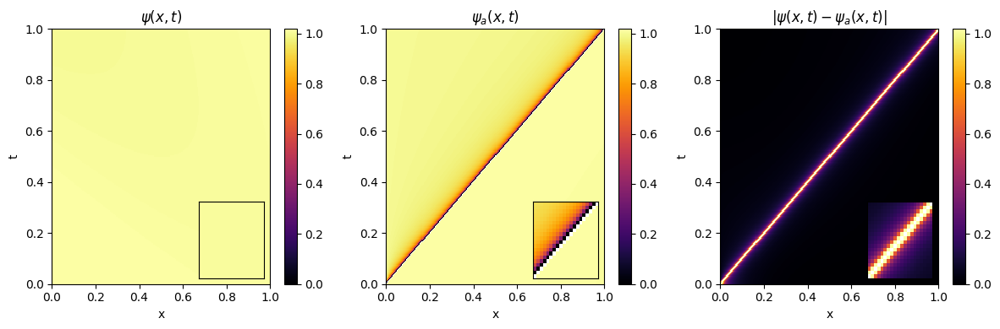

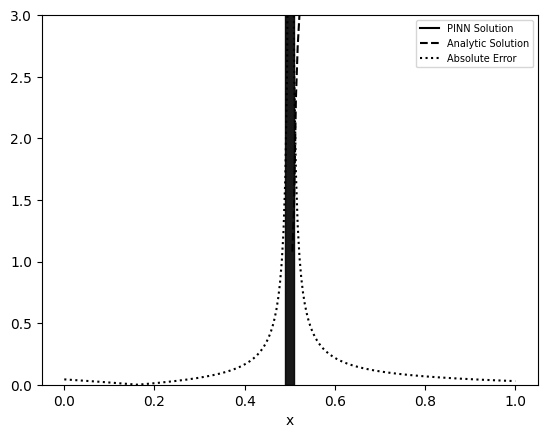

Compiling model...
Building feed-forward neural network...
'build' took 0.032200 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.182077 s

Initializing variables...
Training model...

Step      Train loss                                                      Test loss                                                       Test metric
0         [2.89e-04, 1.24e+00, 2.43e-04, 9.21e-01, 1.04e+00, 1.05e+00]    [2.89e-04, 1.24e+00, 2.43e-04, 9.21e-01, 1.04e+00, 1.05e+00]    []  
1000      [3.45e-05, 5.58e-02, 2.08e-03, 4.31e-03, 6.30e-04, 5.10e-04]    [3.45e-05, 5.58e-02, 2.08e-03, 4.31e-03, 6.30e-04, 5.10e-04]    []  
2000      [3.35e-05, 5.52e-02, 2.24e-03, 4.41e-03, 6.56e-04, 5.01e-04]    [3.35e-05, 5.52e-02, 2.24e-03, 4.41e-03, 6.56e-04, 5.01e-04]    []  
3000      [2.84e-05, 5.49e-02, 2.38e-03, 4.42e-03, 6.34e-04, 4.92e-04]    [2.84e-05, 5.49e-02, 2.38e-03, 4.42e-03, 6.34e-04, 4.92e-04]    []  
4000      [3.26e-05, 5.49e-02, 2.47e-03, 4.35e-03, 6.66e-04, 4.64e-04]    [3.26e-05, 5.49e-02, 2.47e-03, 4.35e-03, 6.66e-04, 4.64e-04]    []  
5000      [3.06e-05, 5.50e-02, 2.51e-03, 4.22e-03, 7.18e-04, 4.

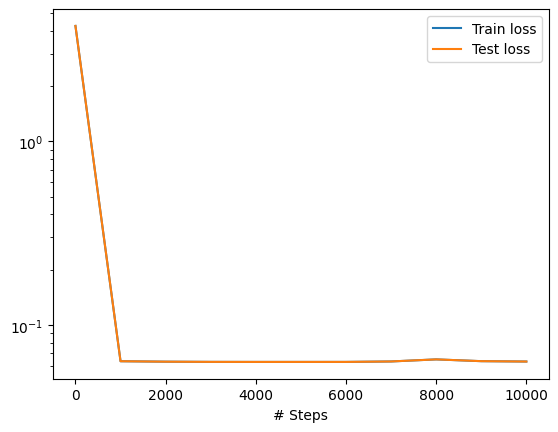

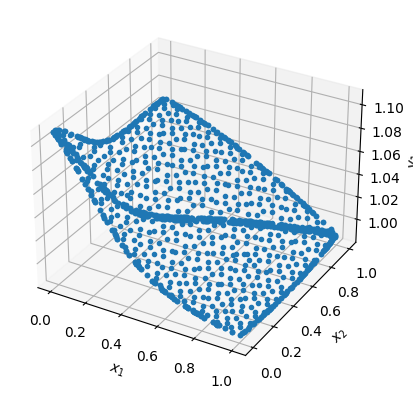

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


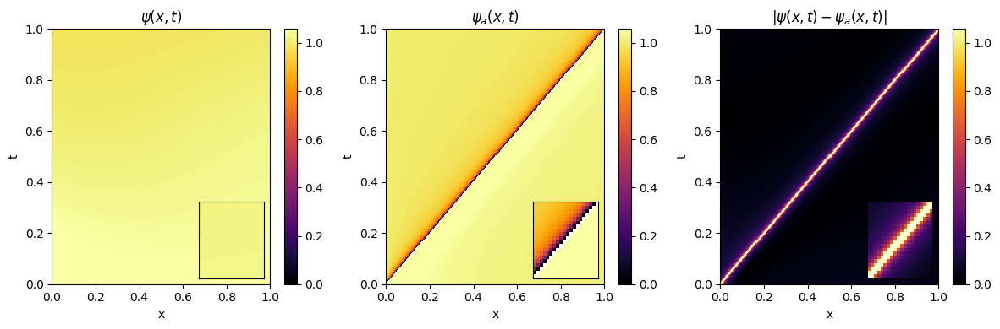

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


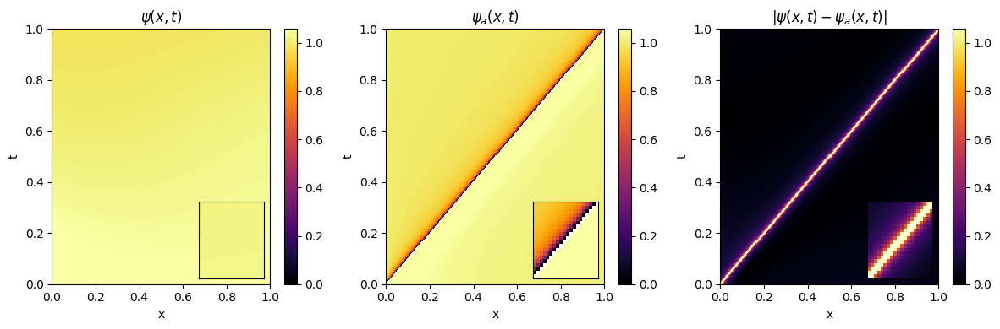

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


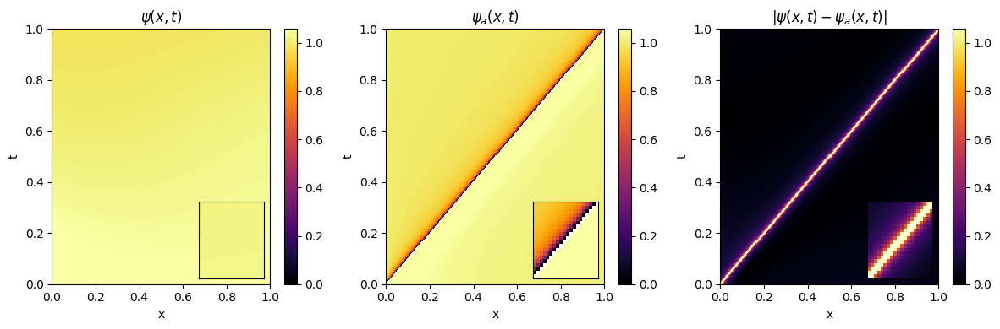

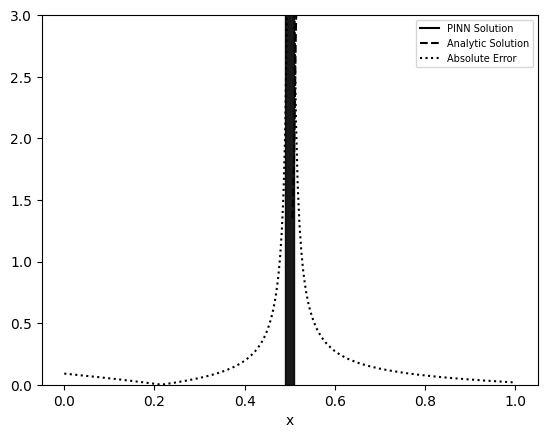

Compiling model...
Building feed-forward neural network...
'build' took 0.031693 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.195726 s

Initializing variables...
Training model...

Step      Train loss                                                      Test loss                                                       Test metric
0         [1.02e-02, 1.11e+00, 8.46e-02, 1.18e+00, 1.54e+00, 1.11e+00]    [1.02e-02, 1.11e+00, 8.46e-02, 1.18e+00, 1.54e+00, 1.11e+00]    []  
1000      [2.74e-06, 4.41e-03, 1.24e-04, 2.29e-03, 3.83e-04, 4.82e-06]    [2.74e-06, 4.41e-03, 1.24e-04, 2.29e-03, 3.83e-04, 4.82e-06]    []  
2000      [2.22e-06, 4.35e-03, 2.10e-04, 2.13e-03, 4.07e-04, 6.64e-06]    [2.22e-06, 4.35e-03, 2.10e-04, 2.13e-03, 4.07e-04, 6.64e-06]    []  
3000      [8.12e-07, 4.35e-03, 2.07e-04, 2.15e-03, 3.88e-04, 8.08e-06]    [8.12e-07, 4.35e-03, 2.07e-04, 2.15e-03, 3.88e-04, 8.08e-06]    []  
4000      [2.51e-06, 4.34e-03, 2.42e-04, 2.11e-03, 3.89e-04, 9.36e-06]    [2.51e-06, 4.34e-03, 2.42e-04, 2.11e-03, 3.89e-04, 9.36e-06]    []  
5000      [1.84e-06, 4.34e-03, 2.47e-04, 2.09e-03, 3.95e-04, 9.

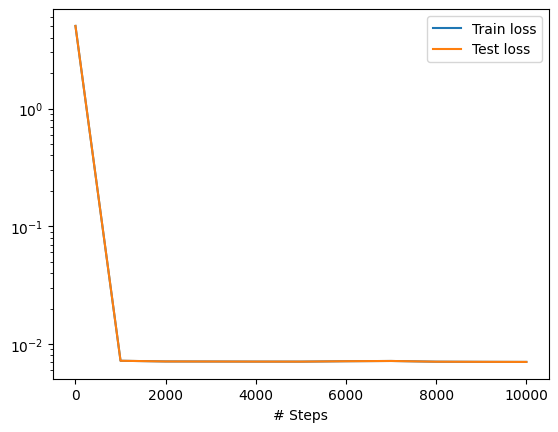

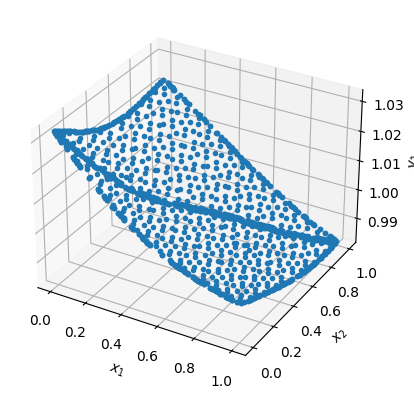

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


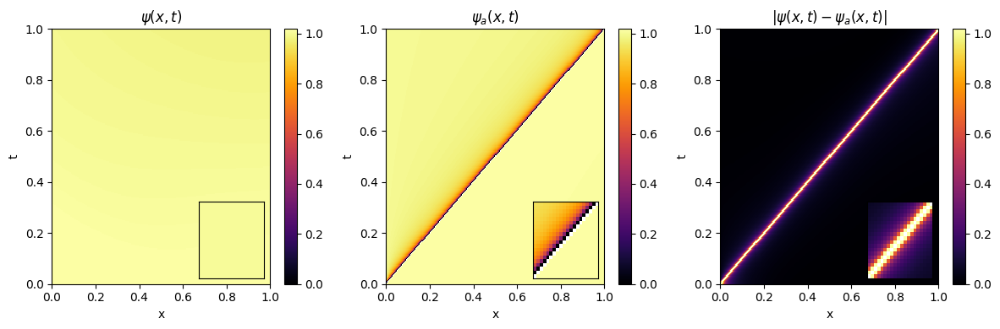

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


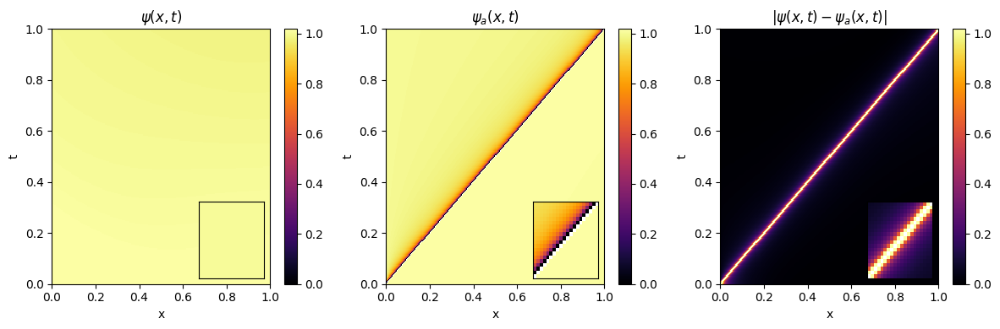

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


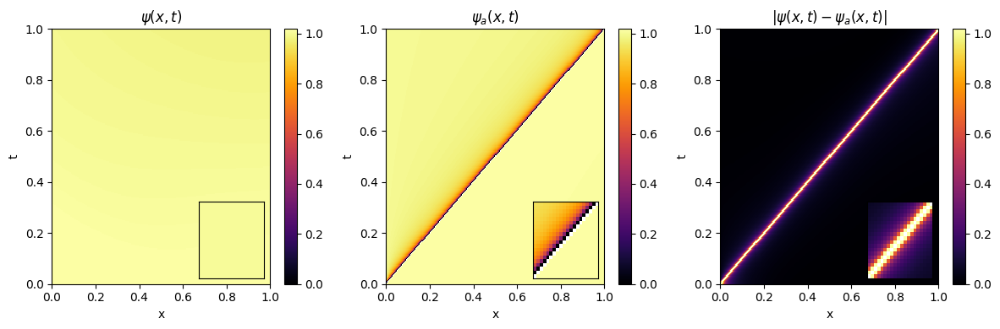

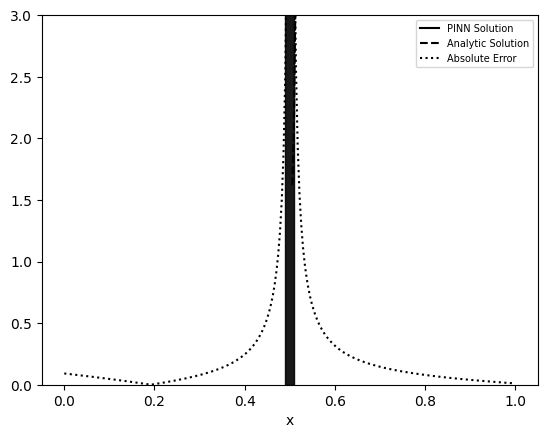

Compiling model...
Building feed-forward neural network...
'build' took 0.031042 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 2.092927 s

Initializing variables...
Training model...

Step      Train loss                                                      Test loss                                                       Test metric
0         [1.79e-03, 1.98e+00, 3.49e-01, 1.19e+00, 1.45e+00, 8.08e-01]    [1.79e-03, 1.98e+00, 3.49e-01, 1.19e+00, 1.45e+00, 8.08e-01]    []  
1000      [1.36e-05, 4.20e-03, 3.53e-04, 2.55e-03, 3.66e-04, 2.97e-06]    [1.36e-05, 4.20e-03, 3.53e-04, 2.55e-03, 3.66e-04, 2.97e-06]    []  
2000      [8.31e-06, 4.20e-03, 3.60e-04, 2.55e-03, 3.59e-04, 3.77e-06]    [8.31e-06, 4.20e-03, 3.60e-04, 2.55e-03, 3.59e-04, 3.77e-06]    []  
3000      [8.51e-06, 6.87e-03, 4.40e-04, 4.28e-04, 2.71e-03, 8.62e-04]    [8.51e-06, 6.87e-03, 4.40e-04, 4.28e-04, 2.71e-03, 8.62e-04]    []  
4000      [2.05e-06, 4.20e-03, 3.53e-04, 2.56e-03, 3.56e-04, 5.58e-06]    [2.05e-06, 4.20e-03, 3.53e-04, 2.56e-03, 3.56e-04, 5.58e-06]    []  
5000      [2.07e-06, 4.20e-03, 3.54e-04, 2.57e-03, 3.52e-04, 6.

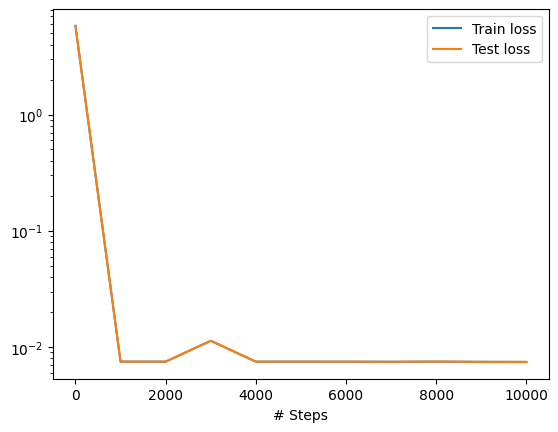

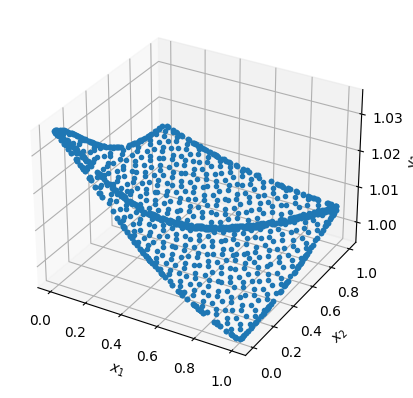

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


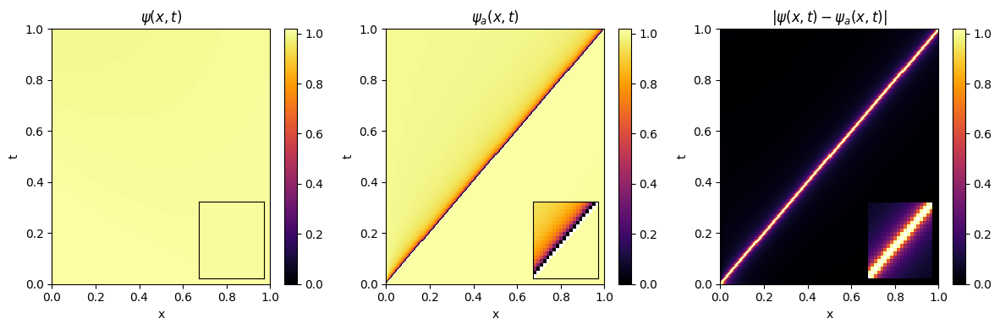

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


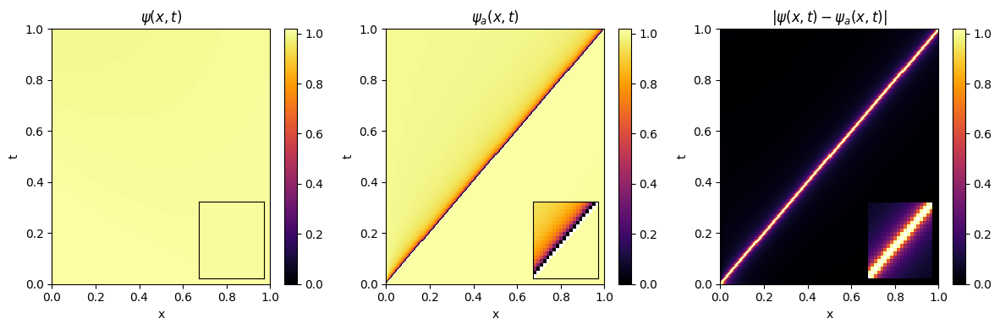

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


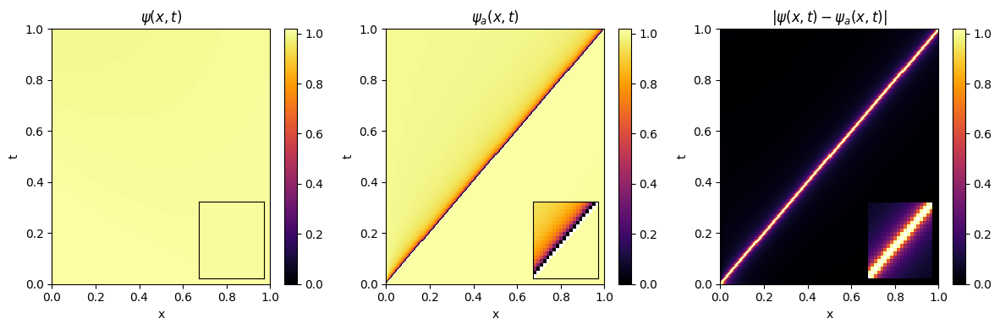

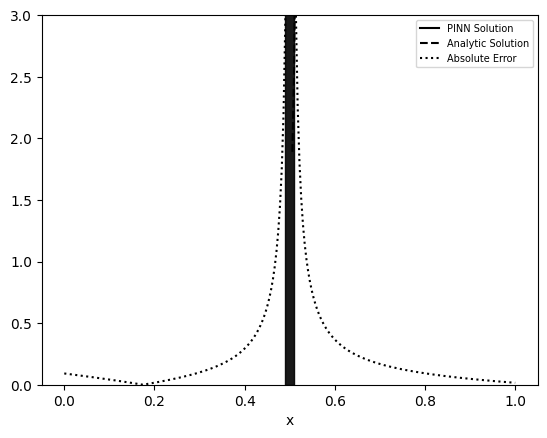

Compiling model...
Building feed-forward neural network...
'build' took 0.031914 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.138140 s

Initializing variables...
Training model...

Step      Train loss                                                      Test loss                                                       Test metric
0         [4.13e-03, 7.90e-01, 3.77e-02, 7.10e-01, 8.50e-01, 1.03e+00]    [4.13e-03, 7.90e-01, 3.77e-02, 7.10e-01, 8.50e-01, 1.03e+00]    []  
1000      [1.90e-06, 1.16e-02, 2.98e-04, 2.45e-03, 5.34e-04, 1.04e-04]    [1.90e-06, 1.16e-02, 2.98e-04, 2.45e-03, 5.34e-04, 1.04e-04]    []  
2000      [3.04e-06, 1.15e-02, 3.55e-04, 2.40e-03, 5.29e-04, 1.26e-04]    [3.04e-06, 1.15e-02, 3.55e-04, 2.40e-03, 5.29e-04, 1.26e-04]    []  
3000      [2.49e-06, 1.14e-02, 3.89e-04, 2.40e-03, 5.21e-04, 1.41e-04]    [2.49e-06, 1.14e-02, 3.89e-04, 2.40e-03, 5.21e-04, 1.41e-04]    []  
4000      [3.61e-06, 1.14e-02, 3.81e-04, 2.41e-03, 5.14e-04, 1.41e-04]    [3.61e-06, 1.14e-02, 3.81e-04, 2.41e-03, 5.14e-04, 1.41e-04]    []  
5000      [3.00e-06, 1.14e-02, 3.89e-04, 2.47e-03, 5.06e-04, 1.

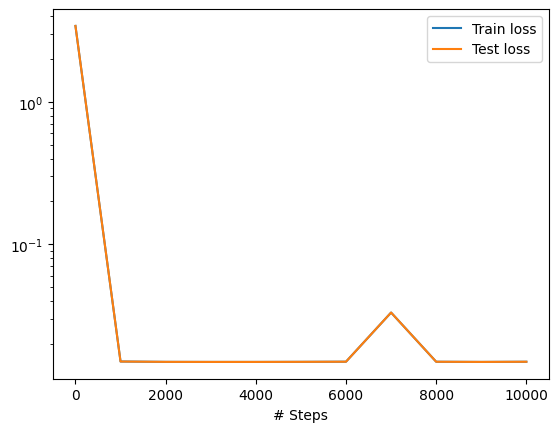

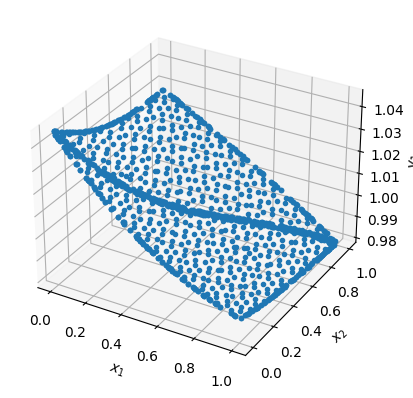

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


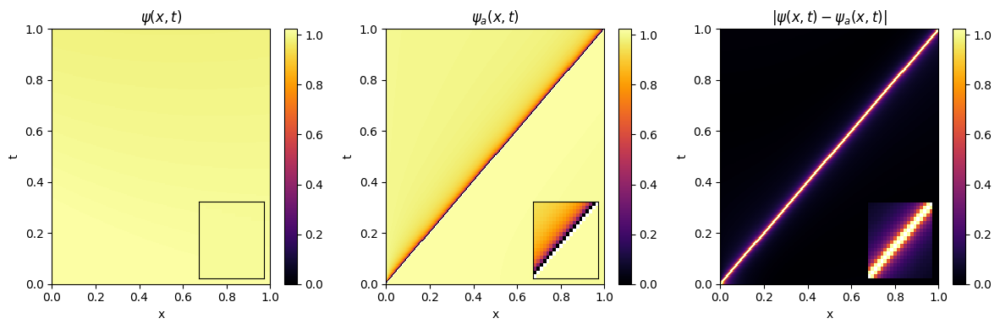

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


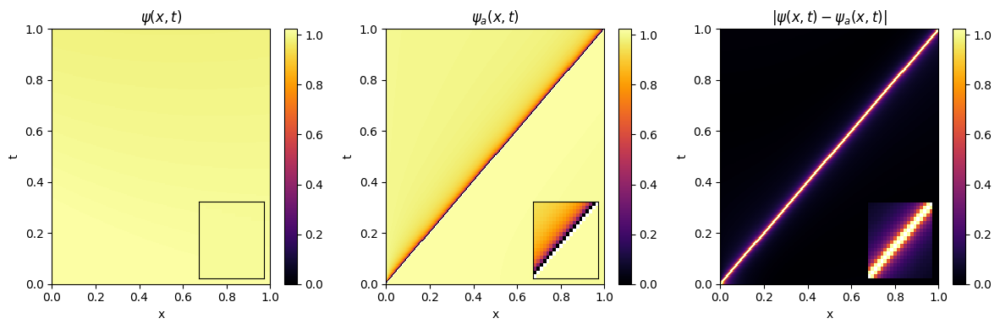

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


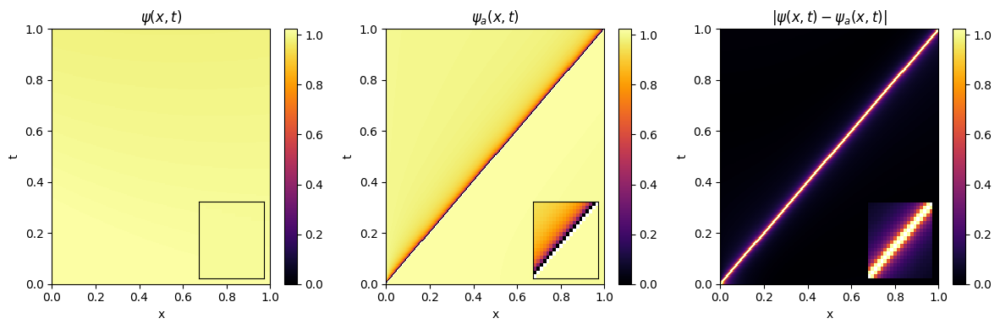

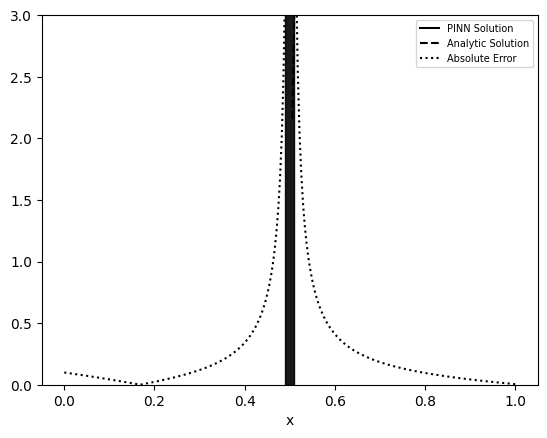

Compiling model...
Building feed-forward neural network...
'build' took 0.031548 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.165001 s

Initializing variables...
Training model...

Step      Train loss                                                      Test loss                                                       Test metric
0         [1.24e-02, 1.49e+00, 5.74e-03, 1.28e+00, 1.69e+00, 1.62e+00]    [1.24e-02, 1.49e+00, 5.74e-03, 1.28e+00, 1.69e+00, 1.62e+00]    []  
1000      [2.34e-05, 4.85e-02, 1.26e-03, 4.65e-03, 2.10e-04, 2.06e-04]    [2.34e-05, 4.85e-02, 1.26e-03, 4.65e-03, 2.10e-04, 2.06e-04]    []  
2000      [1.70e-05, 4.83e-02, 1.26e-03, 4.88e-03, 1.63e-04, 1.72e-04]    [1.70e-05, 4.83e-02, 1.26e-03, 4.88e-03, 1.63e-04, 1.72e-04]    []  
3000      [2.24e-05, 4.82e-02, 1.37e-03, 4.68e-03, 2.09e-04, 2.11e-04]    [2.24e-05, 4.82e-02, 1.37e-03, 4.68e-03, 2.09e-04, 2.11e-04]    []  
4000      [1.62e-05, 4.78e-02, 1.09e-03, 6.24e-03, 5.86e-06, 6.64e-05]    [1.62e-05, 4.78e-02, 1.09e-03, 6.24e-03, 5.86e-06, 6.64e-05]    []  
5000      [2.12e-05, 4.82e-02, 1.47e-03, 4.59e-03, 2.10e-04, 2.

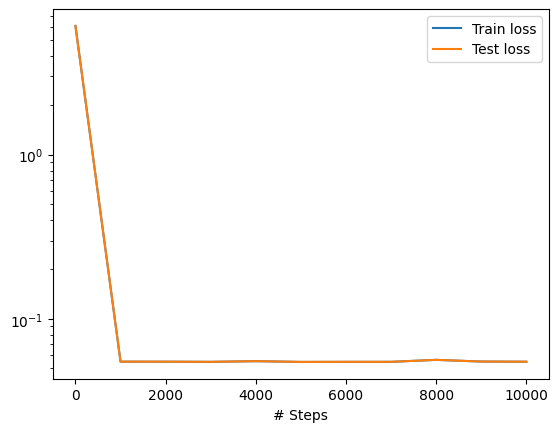

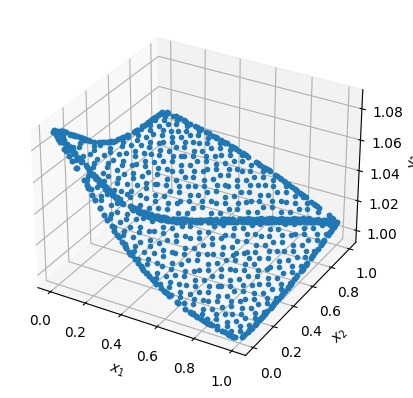

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


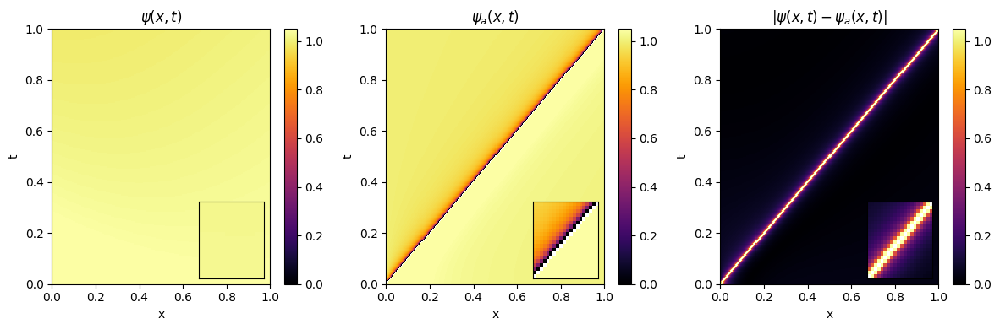

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


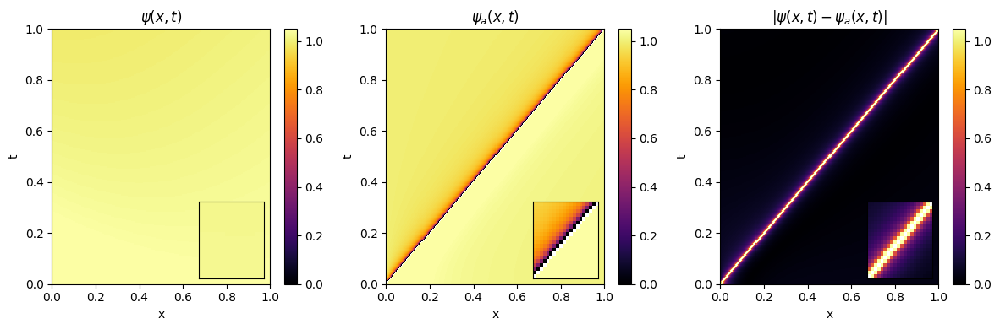

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


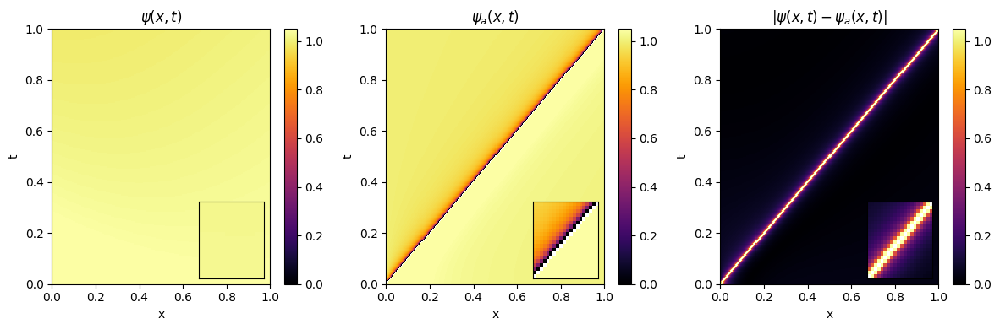

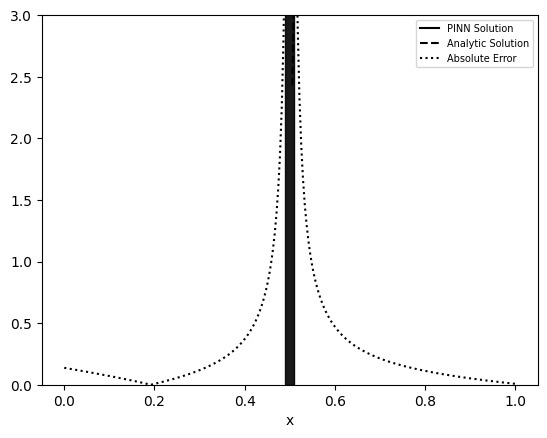

Compiling model...
Building feed-forward neural network...
'build' took 0.030345 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.179676 s

Initializing variables...
Training model...

Step      Train loss                                                      Test loss                                                       Test metric
0         [1.49e-02, 1.12e+00, 3.12e-01, 1.30e+00, 1.48e+00, 2.02e+00]    [1.49e-02, 1.12e+00, 3.12e-01, 1.30e+00, 1.48e+00, 2.02e+00]    []  
1000      [2.28e-05, 5.11e-02, 1.56e-03, 4.83e-03, 1.37e-04, 3.54e-04]    [2.28e-05, 5.11e-02, 1.56e-03, 4.83e-03, 1.37e-04, 3.54e-04]    []  
2000      [2.75e-05, 5.10e-02, 1.62e-03, 4.86e-03, 1.34e-04, 3.63e-04]    [2.75e-05, 5.10e-02, 1.62e-03, 4.86e-03, 1.34e-04, 3.63e-04]    []  
3000      [2.49e-05, 5.09e-02, 1.63e-03, 4.89e-03, 1.18e-04, 3.66e-04]    [2.49e-05, 5.09e-02, 1.63e-03, 4.89e-03, 1.18e-04, 3.66e-04]    []  
4000      [3.08e-05, 5.08e-02, 1.70e-03, 4.85e-03, 1.16e-04, 3.82e-04]    [3.08e-05, 5.08e-02, 1.70e-03, 4.85e-03, 1.16e-04, 3.82e-04]    []  
5000      [2.23e-05, 5.06e-02, 1.54e-03, 5.55e-03, 9.30e-05, 1.

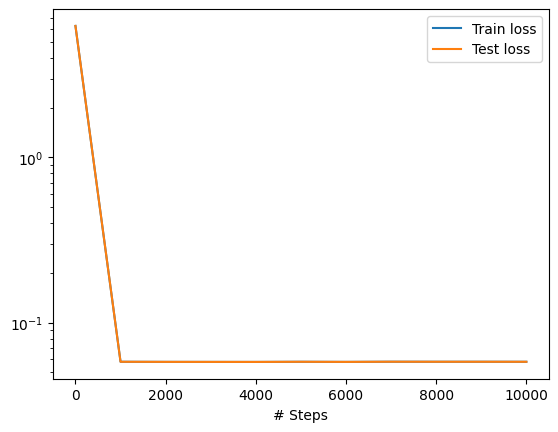

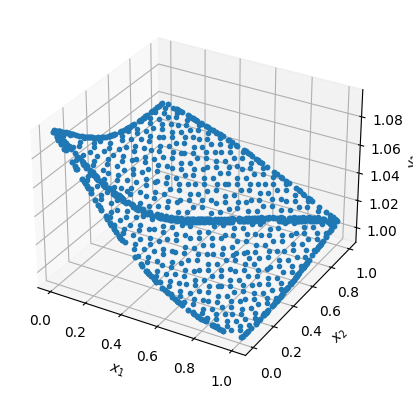

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


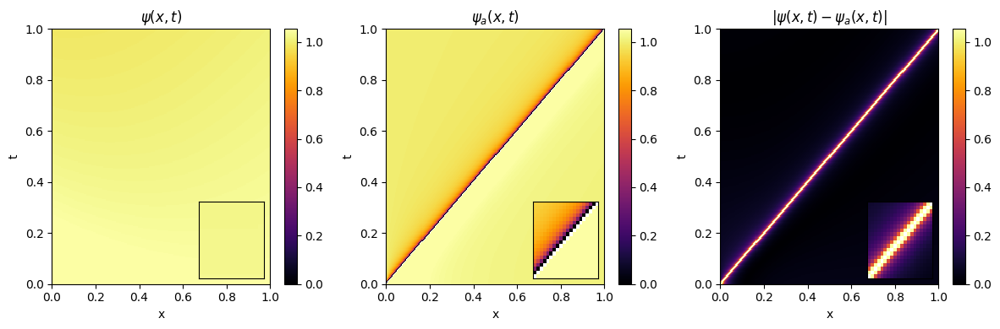

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


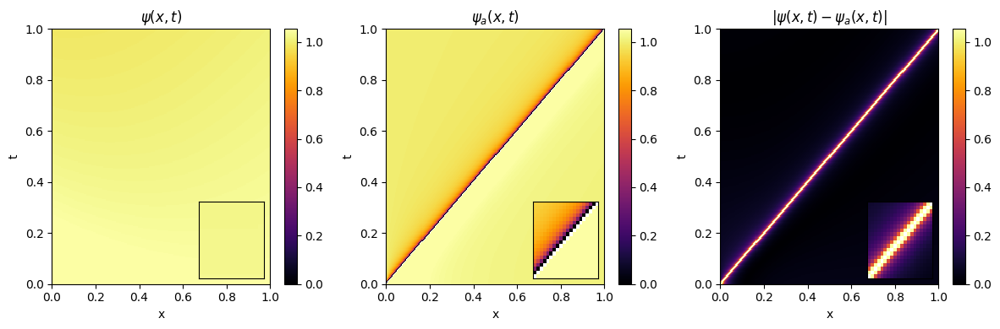

C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_20784\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


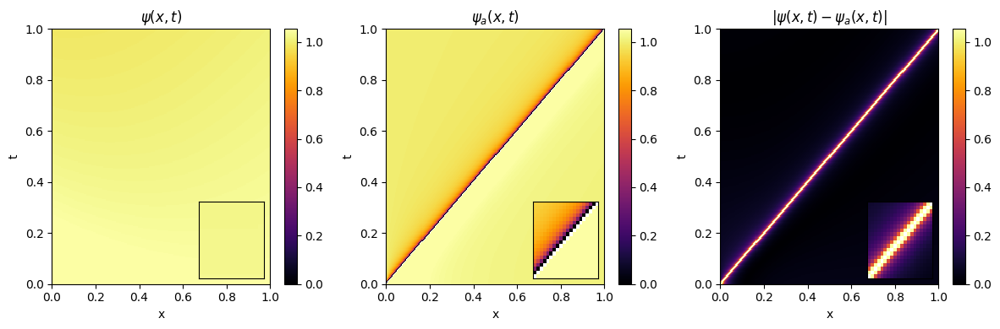

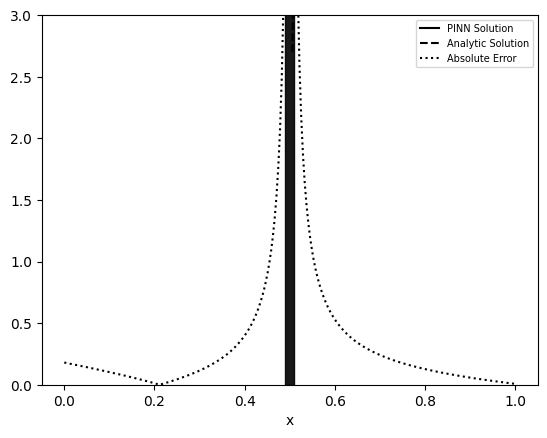

Average Behavior


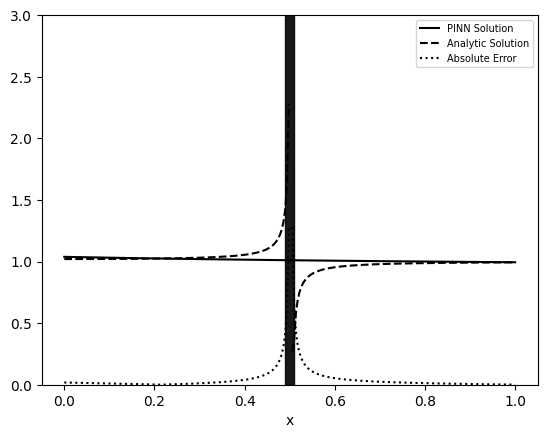

In [11]:

for i in range(sample_size):
    model_3 = generate_evolution_model(throat, 500, 500, 10, 1, lr, iterations,3);
    analytic_v_3 += plot_evolution_model(throat, model_3)[0];
    v_3 += plot_evolution_model(throat, model_3)[1];
    diff_3 += plot_evolution_model(throat, model_3)[2];
    plot_evolution_slice(throat, 0.5, analytic_v_3, v_3, diff_3)
    
    
print("Average Behavior")
analytic_v_3 = analytic_v_3/sample_size
v_3 = v_3/sample_size 
diff_3 = diff_3/sample_size 

plot_evolution_slice(throat, 0.5, analytic_v_3, v_3, diff_3)


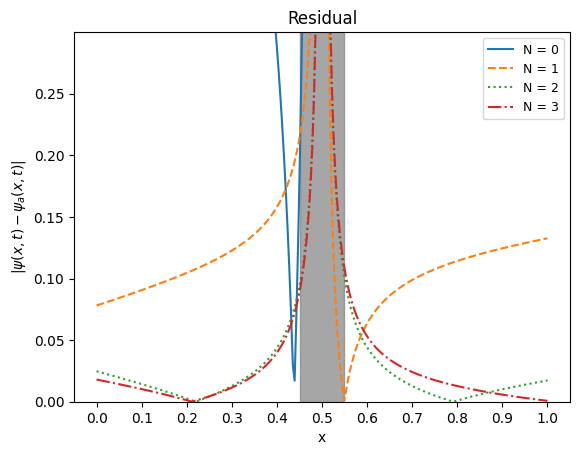

In [12]:
import numpy as np
import matplotlib.pyplot as plt

# Define the x-axis values
t = 0.5
a = 0.05
x = np.linspace(0, 1, len(v_0))

# Set the threshold value
threshold = 50

# Create a Figure and Axes
fig, ax = plt.subplots()

ax.fill_between(x, 0, 10, where=(x >= t - a) & (x <= t + a), alpha=0.7, color='gray')
# ax.text(t, .5, "Excised Region", ha='center', va='center', color='black')

t = round(t * 255)

# Set line styles
line_styles = ['-', '--', ':', '-.']

ax.plot(x, np.where((abs((v_0.T[:, t] - analytic_v_0[:, t]))) < threshold,
                    (abs((v_0.T[:, t] - analytic_v_0[:, t]))), np.nan),
        label="N = 0", linestyle=line_styles[0])

ax.plot(x, np.where((abs((v_1.T[:, t] - analytic_v_1[:, t]))) < threshold,
                    (abs((v_1.T[:, t] - analytic_v_1[:, t]))), np.nan),
        label="N = 1", linestyle=line_styles[1])

ax.plot(x, np.where((abs((v_2.T[:, t] - analytic_v_2[:, t]))) < threshold,
                    (abs((v_2.T[:, t] - analytic_v_2[:, t]))), np.nan),
        label="N = 2", linestyle=line_styles[2])

ax.plot(x, np.where((abs((v_3.T[:, t] - analytic_v_3[:, t]))) < threshold,
                    (abs((v_3.T[:, t] - analytic_v_3[:, t]))), np.nan),
        label="N = 3", linestyle=line_styles[3])


# Set the title and labels
# ax.set_title("PINN-excised solutions")
ax.set_xlabel("x")
ax.set_ylabel(r'$|\psi(x,t)-\psi_{a}(x,t)|$')
ax.set_ylim(0, 0.3)

# Set ticker on the axis ticks
ax.set_xticks(np.arange(0, 1.1, 0.1))
ax.set_yticks(np.arange(0, 0.3, 0.05))

# Add a legend
legend = ax.legend(fontsize=9)


ax.set_title("Residual", fontsize = 12)


# Show the plot
plt.show()


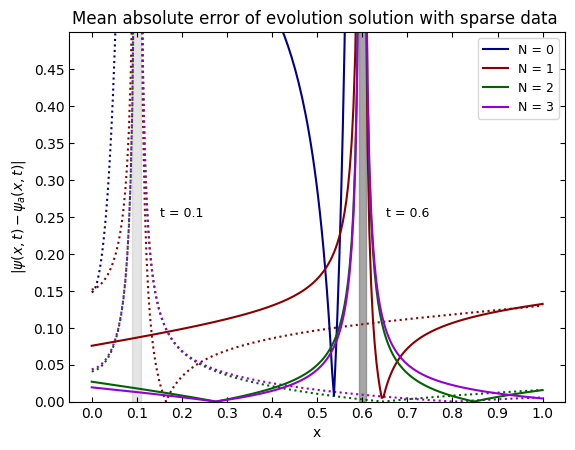

In [16]:
import numpy as np
import matplotlib.pyplot as plt

# Define the x-axis values
t = 0.1
a = 0.01
x = np.linspace(0, 1, len(v_0))

# Set the threshold value
threshold = 50

# Create a Figure and Axes
fig, ax = plt.subplots()

ax.fill_between(x, 0, 10, where=(x >= t - a) & (x <= t + a), alpha=0.2, color='gray')
# ax.text(t, .5, "Excised Region", ha='center', va='center', color='black')

t = round(t * 255)

# Set line styles
line_styles = ['-', '--', ':', '-.', '-', '--']



ax.plot(x, np.where((abs((v_0.T[:, t] - analytic_v_0[:, t]))) < threshold,
                    (abs((v_0.T[:, t] - analytic_v_0[:, t]))), np.nan),
        linestyle=line_styles[2], color='darkblue')

ax.plot(x, np.where((abs((v_1.T[:, t] - analytic_v_1[:, t]))) < threshold,
                    (abs((v_1.T[:, t] - analytic_v_1[:, t]))), np.nan),
         linestyle=line_styles[2], color='darkred')

ax.plot(x, np.where((abs((v_2.T[:, t] - analytic_v_2[:, t]))) < threshold,
                    (abs((v_2.T[:, t] - analytic_v_2[:, t]))), np.nan),
       linestyle=line_styles[2], color='darkgreen')

ax.plot(x, np.where((abs((v_3.T[:, t] - analytic_v_3[:, t]))) < threshold,
                    (abs((v_3.T[:, t] - analytic_v_3[:, t]))), np.nan),
       linestyle=line_styles[2], color='darkviolet')


t = 0.6



ax.fill_between(x, 0, 10, where=(x >= t - a) & (x <= t + a), alpha=0.7, color='gray')
# ax.text(t, .5, "Excised Region", ha='center', va='center', color='black')

t = round(t * 255)

# Set line styles
line_styles = ['-', '--', ':', '-.', '-', '--']


ax.plot(x, np.where((abs((v_0.T[:, t] - analytic_v_0[:, t]))) < threshold,
                    (abs((v_0.T[:, t] - analytic_v_0[:, t]))), np.nan),
        label="N = 0", linestyle=line_styles[0],  color='darkblue')

ax.plot(x, np.where((abs((v_1.T[:, t] - analytic_v_1[:, t]))) < threshold,
                    (abs((v_1.T[:, t] - analytic_v_1[:, t]))), np.nan),
        label="N = 1", linestyle=line_styles[0], color='darkred')

ax.plot(x, np.where((abs((v_2.T[:, t] - analytic_v_2[:, t]))) < threshold,
                    (abs((v_2.T[:, t] - analytic_v_2[:, t]))), np.nan),
        label="N = 2", linestyle=line_styles[0], color='darkgreen')

ax.plot(x, np.where((abs((v_3.T[:, t] - analytic_v_3[:, t]))) < threshold,
                    (abs((v_3.T[:, t] - analytic_v_3[:, t]))), np.nan),
        label="N = 3", linestyle=line_styles[0], color='darkviolet')



# Set the title and labels
# ax.set_title("PINN-excised solutions")
ax.set_xlabel("x")
ax.set_ylabel(r'$|\psi(x,t)-\psi_{a}(x,t)|$')
ax.set_ylim(0, 0.5)

# # Set ticker on the axis ticks
# ax.set_xticks(np.arange(0, 1.1, 0.1))
# ax.set_yticks(np.arange(0, 1.1, 0.1))



# Set ticker on the axis ticks
ax.set_xticks(np.arange(0, 1.1, 0.1))
ax.set_yticks(np.arange(0, 0.5, 0.05))

# Add tick marks on top and right axes
ax.tick_params(axis='both', direction='in', which='both', top=True, right=True)



ax.set_title("Mean absolute error of evolution solution with sparse data ", fontsize = 12)


# Add a legend
legend = ax.legend(fontsize=9)


# Add label at x = 0.6
ax.text(0.7, 0.25, "t = 0.6", fontsize=9, ha='center')

# Add label at x = 0.6
ax.text(0.2, 0.25, "t = 0.1", fontsize=9, ha='center')


# Show the plot
plt.show()


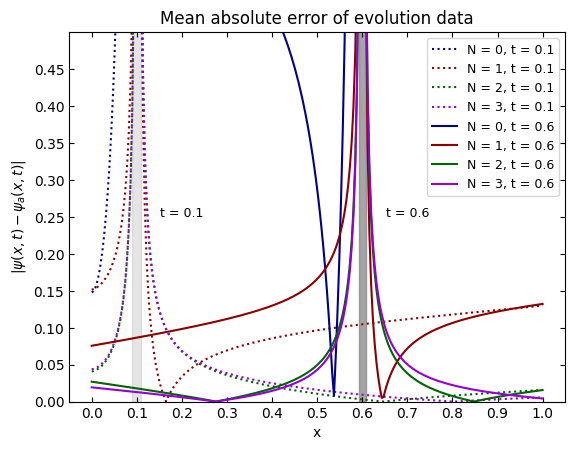

In [14]:
import numpy as np
import matplotlib.pyplot as plt

# Define the x-axis values
t = 0.1
a = 0.01
x = np.linspace(0, 1, len(v_0))

# Set the threshold value
threshold = 50

# Create a Figure and Axes
fig, ax = plt.subplots()

ax.fill_between(x, 0, 10, where=(x >= t - a) & (x <= t + a), alpha=0.2, color='gray')

t = round(t * 255)

# Set line styles
line_styles = ['-', '--', ':', '-.', '-', '--']

ax.plot(x, np.where((abs((v_0.T[:, t] - analytic_v_0[:, t]))) < threshold,
                    (abs((v_0.T[:, t] - analytic_v_0[:, t]))), np.nan),
        label="N = 0, t = 0.1", linestyle=line_styles[2], color='darkblue')

ax.plot(x, np.where((abs((v_1.T[:, t] - analytic_v_1[:, t]))) < threshold,
                    (abs((v_1.T[:, t] - analytic_v_1[:, t]))), np.nan),
        label="N = 1, t = 0.1", linestyle=line_styles[2], color='darkred')

ax.plot(x, np.where((abs((v_2.T[:, t] - analytic_v_2[:, t]))) < threshold,
                    (abs((v_2.T[:, t] - analytic_v_2[:, t]))), np.nan),
        label="N = 2, t = 0.1", linestyle=line_styles[2], color='darkgreen')

ax.plot(x, np.where((abs((v_3.T[:, t] - analytic_v_3[:, t]))) < threshold,
                    (abs((v_3.T[:, t] - analytic_v_3[:, t]))), np.nan),
        label="N = 3, t = 0.1", linestyle=line_styles[2], color='darkviolet')

t = 0.6

ax.fill_between(x, 0, 10, where=(x >= t - a) & (x <= t + a), alpha=0.7, color='gray')

t = round(t * 255)

ax.plot(x, np.where((abs((v_0.T[:, t] - analytic_v_0[:, t]))) < threshold,
                    (abs((v_0.T[:, t] - analytic_v_0[:, t]))), np.nan),
        label="N = 0, t = 0.6", linestyle=line_styles[0], color='darkblue')

ax.plot(x, np.where((abs((v_1.T[:, t] - analytic_v_1[:, t]))) < threshold,
                    (abs((v_1.T[:, t] - analytic_v_1[:, t]))), np.nan),
        label="N = 1, t = 0.6", linestyle=line_styles[0], color='darkred')

ax.plot(x, np.where((abs((v_2.T[:, t] - analytic_v_2[:, t]))) < threshold,
                    (abs((v_2.T[:, t] - analytic_v_2[:, t]))), np.nan),
        label="N = 2, t = 0.6", linestyle=line_styles[0], color='darkgreen')

ax.plot(x, np.where((abs((v_3.T[:, t] - analytic_v_3[:, t]))) < threshold,
                    (abs((v_3.T[:, t] - analytic_v_3[:, t]))), np.nan),
        label="N = 3, t = 0.6", linestyle=line_styles[0], color='darkviolet')

# Set the title and labels
ax.set_xlabel("x")
ax.set_ylabel(r'$|\psi(x,t)-\psi_{a}(x,t)|$')
ax.set_ylim(0, 0.5)

# Set ticker on the axis ticks
ax.set_xticks(np.arange(0, 1.1, 0.1))
ax.set_yticks(np.arange(0, 0.5, 0.05))

# Add tick marks on top and right axes
ax.tick_params(axis='both', direction='in', which='both', top=True, right=True)

# Set the plot title
ax.set_title("Mean absolute error of evolution data", fontsize=12)

# Add a legend
legend = ax.legend(fontsize=9)

# Add label at x = 0.6
ax.text(0.7, 0.25, "t = 0.6", fontsize=9, ha='center')

# Add label at x = 0.6
ax.text(0.2, 0.25, "t = 0.1", fontsize=9, ha='center')


# Show the plot
plt.show()


In [11]:
v_t = 0
analytic_v_t = 0
diff_t = 0

In [10]:
import numpy as np
import matplotlib.pyplot as plt

# Define the x-axis values
t = 0.1
a = 0.01
x = np.linspace(0, 1, len(v_t))

# Set the threshold value
threshold = 50

# Create a Figure and Axes
fig, ax = plt.subplots()

ax.fill_between(x, 0, 10, where=(x >= t - a) & (x <= t + a), alpha=0.2, color='gray')

t = round(t * 255)

# Set line styles
line_styles = ['-', '--', ':', '-.', '-', '--']

ax.plot(x, np.where((abs((v_0.T[:, t] - analytic_v_0[:, t]))) < threshold,
                    (abs((v_0.T[:, t] - analytic_v_0[:, t]))), np.nan),
        label="N = 0, t = 0.1", linestyle=line_styles[2], color='darkblue')

ax.plot(x, np.where((abs((v_1.T[:, t] - analytic_v_1[:, t]))) < threshold,
                    (abs((v_1.T[:, t] - analytic_v_1[:, t]))), np.nan),
        label="N = 1, t = 0.1", linestyle=line_styles[2], color='darkred')

ax.plot(x, np.where((abs((v_2.T[:, t] - analytic_v_2[:, t]))) < threshold,
                    (abs((v_2.T[:, t] - analytic_v_2[:, t]))), np.nan),
        label="N = 2, t = 0.1", linestyle=line_styles[2], color='darkgreen')

ax.plot(x, np.where((abs((v_3.T[:, t] - analytic_v_3[:, t]))) < threshold,
                    (abs((v_3.T[:, t] - analytic_v_3[:, t]))), np.nan),
        label="N = 3, t = 0.1", linestyle=line_styles[2], color='darkviolet')

# Add label at x = 0.1
ax.text(0.2, 0.25, "t = 0.1", fontsize=9, ha='center')

t = 0.6

ax.fill_between(x, 0, 10, where=(x >= t - a) & (x <= t + a), alpha=0.7, color='gray')

t = round(t * 255)

ax.plot(x, np.where((abs((v_0.T[:, t] - analytic_v_0[:, t]))) < threshold,
                    (abs((v_0.T[:, t] - analytic_v_0[:, t]))), np.nan),
        label="N = 0, t = 0.6", linestyle=line_styles[0], color='darkblue')

ax.plot(x, np.where((abs((v_1.T[:, t] - analytic_v_1[:, t]))) < threshold,
                    (abs((v_1.T[:, t] - analytic_v_1[:, t]))), np.nan),
        label="N = 1, t = 0.6", linestyle=line_styles[0], color='darkred')

ax.plot(x, np.where((abs((v_2.T[:, t] - analytic_v_2[:, t]))) < threshold,
                    (abs((v_2.T[:, t] - analytic_v_2[:, t]))), np.nan),
        label="N = 2, t = 0.6", linestyle=line_styles[0], color='darkgreen')

ax.plot(x, np.where((abs((v_3.T[:, t] - analytic_v_3[:, t]))) < threshold,
                    (abs((v_3.T[:, t] - analytic_v_3[:, t]))), np.nan),
        label="N = 3, t = 0.6", linestyle=line_styles[0], color='darkviolet')

# Add label at x = 0.6
ax.text(0.7, 0.25, "t = 0.6", fontsize=9, ha='center')

# Set the title and labels
ax.set_xlabel("x")
ax.set_ylabel(r'$|\psi(x,t)-\psi_{a}(x,t)|$')
ax.set_ylim(0, 0.5)

# Set ticker on the axis ticks
ax.set_xticks(np.arange(0, 1.1, 0.1))
ax.set_yticks(np.arange(0, 0.5, 0.05))

# Add tick marks on top and right axes
ax.tick_params(axis='both', direction='in', which='both', top=True, right=True)

# Set the plot title
ax.set_title("Mean absolute error of evolution data", fontsize=12)

# Add a legend
legend = ax.legend(fontsize=9)

# Show the plot
plt.show()


NameError: name 'v_t' is not defined

Compiling model...
Building feed-forward neural network...
'build' took 0.041323 s

'compile' took 1.256377 s

Initializing variables...
Training model...

Step      Train loss                                                      Test loss                                                       Test metric
0         [1.66e-01, 3.47e-01, 1.69e-02, 2.08e-01, 1.55e-01, 6.62e-02]    [1.66e-01, 3.47e-01, 1.69e-02, 2.08e-01, 1.55e-01, 6.62e-02]    []  
1000      [7.37e-06, 9.58e-03, 2.57e-04, 3.67e-03, 3.17e-04, 1.57e-04]    [7.37e-06, 9.58e-03, 2.57e-04, 3.67e-03, 3.17e-04, 1.57e-04]    []  
2000      [7.73e-06, 9.16e-03, 5.51e-04, 3.63e-03, 3.11e-04, 1.07e-04]    [7.73e-06, 9.16e-03, 5.51e-04, 3.63e-03, 3.11e-04, 1.07e-04]    []  
3000      [6.31e-06, 9.07e-03, 6.84e-04, 3.48e-03, 3.11e-04, 9.07e-05]    [6.31e-06, 9.07e-03, 6.84e-04, 3.48e-03, 3.11e-04, 9.07e-05]    []  
4000      [7.55e-06, 1.06e-02, 3.98e-04, 2.38e-03, 6.67e-04, 4.11e-04]    [7.55e-06, 1.06e-02, 3.98e-04, 2.38e-03, 6.67e-0

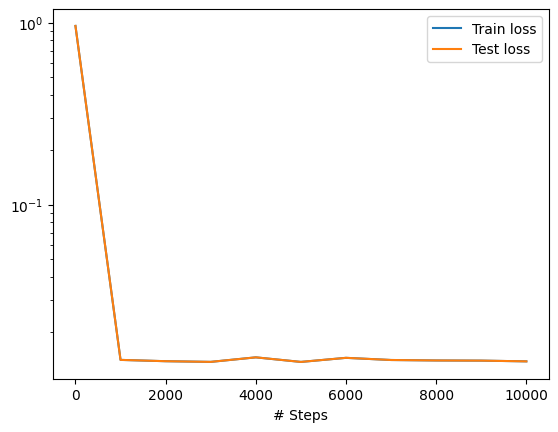

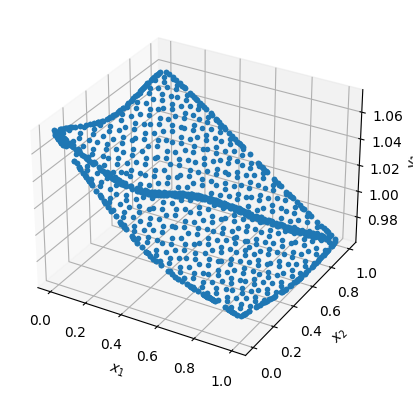

C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


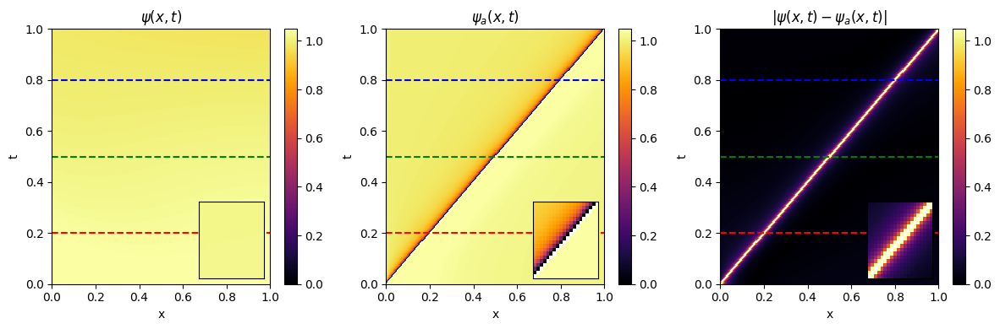

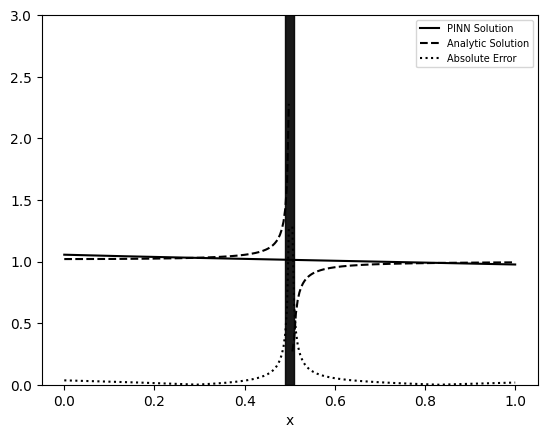

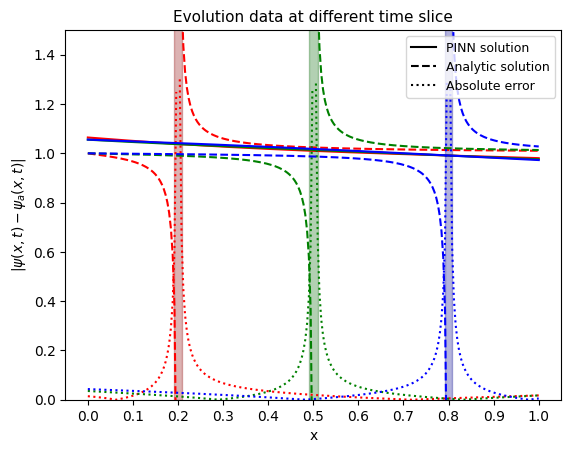

Compiling model...
Building feed-forward neural network...
'build' took 0.037286 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.476505 s

Initializing variables...
Training model...

Step      Train loss                                                      Test loss                                                       Test metric
0         [2.09e-02, 1.56e+00, 2.10e-02, 1.36e+00, 1.47e+00, 1.37e+00]    [2.09e-02, 1.56e+00, 2.10e-02, 1.36e+00, 1.47e+00, 1.37e+00]    []  
1000      [1.89e-05, 5.36e-02, 1.07e-03, 3.57e-03, 7.16e-04, 1.20e-04]    [1.89e-05, 5.36e-02, 1.07e-03, 3.57e-03, 7.16e-04, 1.20e-04]    []  
2000      [1.60e-05, 5.38e-02, 1.06e-03, 3.35e-03, 7.50e-04, 8.96e-05]    [1.60e-05, 5.38e-02, 1.06e-03, 3.35e-03, 7.50e-04, 8.96e-05]    []  
3000      [2.03e-05, 5.31e-02, 1.36e-03, 3.53e-03, 6.76e-04, 1.16e-04]    [2.03e-05, 5.31e-02, 1.36e-03, 3.53e-03, 6.76e-04, 1.16e-04]    []  
4000      [2.16e-05, 5.30e-02, 1.39e-03, 3.53e-03, 6.67e-04, 1.18e-04]    [2.16e-05, 5.30e-02, 1.39e-03, 3.53e-03, 6.67e-04, 1.18e-04]    []  
5000      [2.21e-05, 5.31e-02, 1.43e-03, 3.38e-03, 7.01e-04, 1.

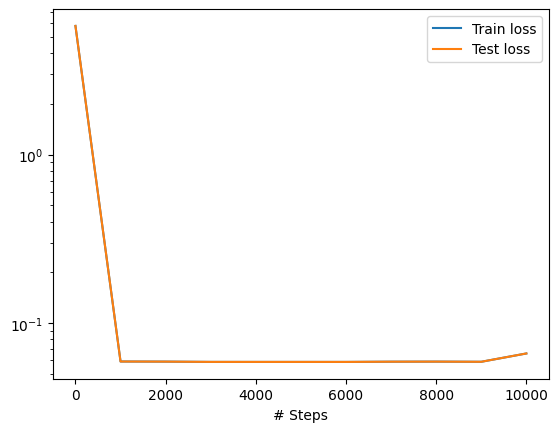

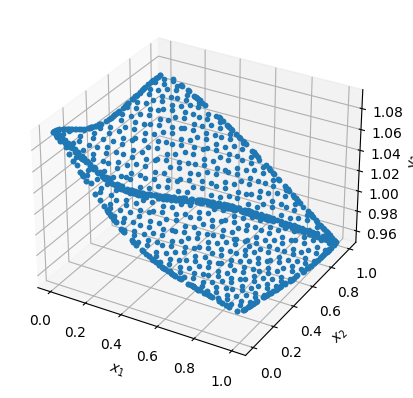

C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


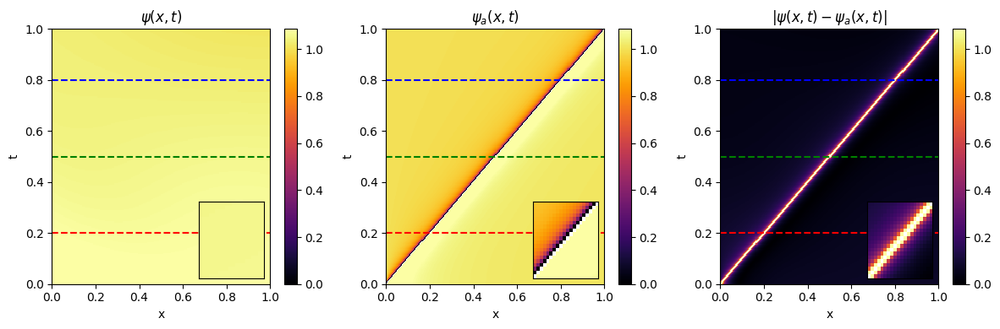

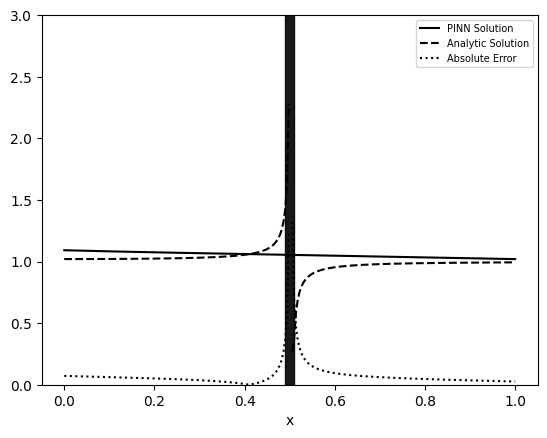

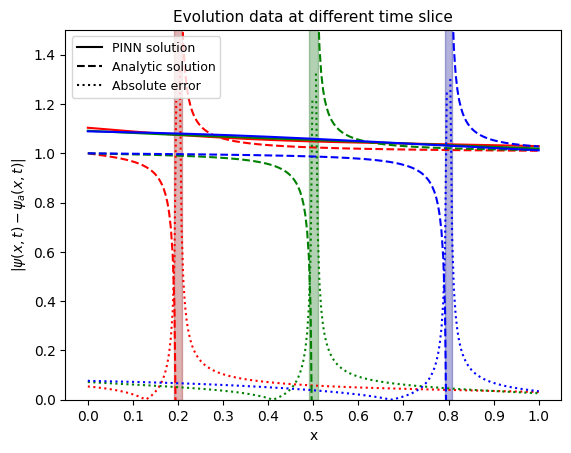

Compiling model...
Building feed-forward neural network...
'build' took 0.040150 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.440263 s

Initializing variables...
Training model...

Step      Train loss                                                      Test loss                                                       Test metric
0         [2.46e-01, 8.78e-01, 4.80e-01, 1.10e+00, 1.35e+00, 1.07e+00]    [2.46e-01, 8.78e-01, 4.80e-01, 1.10e+00, 1.35e+00, 1.07e+00]    []  
1000      [3.80e-05, 5.18e-02, 1.50e-03, 5.73e-03, 1.28e-04, 5.38e-04]    [3.80e-05, 5.18e-02, 1.50e-03, 5.73e-03, 1.28e-04, 5.38e-04]    []  
2000      [3.46e-05, 5.11e-02, 1.88e-03, 5.70e-03, 1.52e-04, 4.29e-04]    [3.46e-05, 5.11e-02, 1.88e-03, 5.70e-03, 1.52e-04, 4.29e-04]    []  
3000      [3.49e-05, 5.10e-02, 1.99e-03, 5.65e-03, 1.53e-04, 4.21e-04]    [3.49e-05, 5.10e-02, 1.99e-03, 5.65e-03, 1.53e-04, 4.21e-04]    []  
4000      [3.34e-05, 5.06e-02, 1.82e-03, 6.99e-03, 9.28e-06, 1.14e-04]    [3.34e-05, 5.06e-02, 1.82e-03, 6.99e-03, 9.28e-06, 1.14e-04]    []  
5000      [4.50e-05, 5.10e-02, 1.93e-03, 5.76e-03, 1.32e-04, 3.

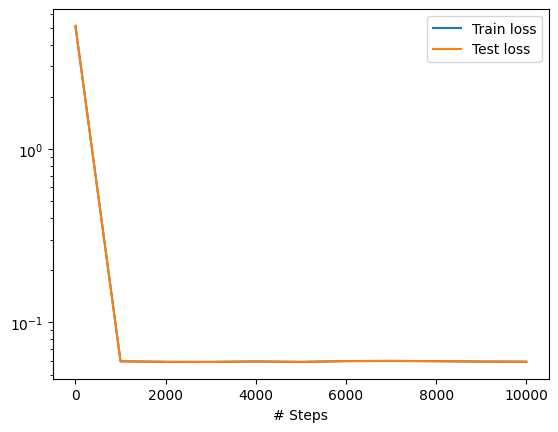

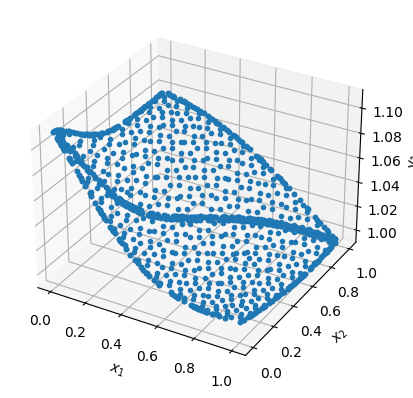

C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


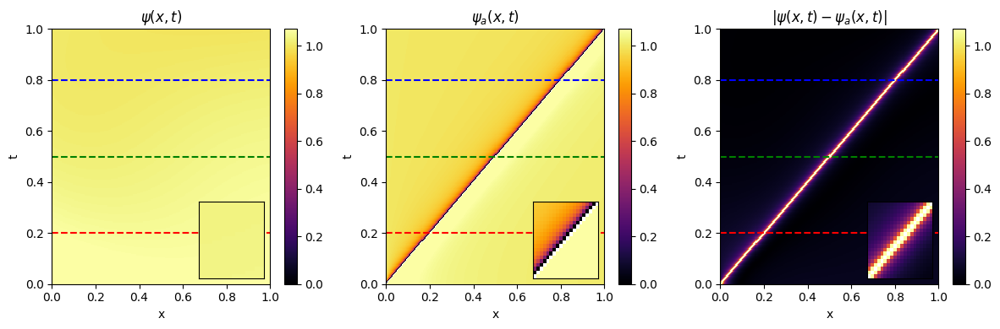

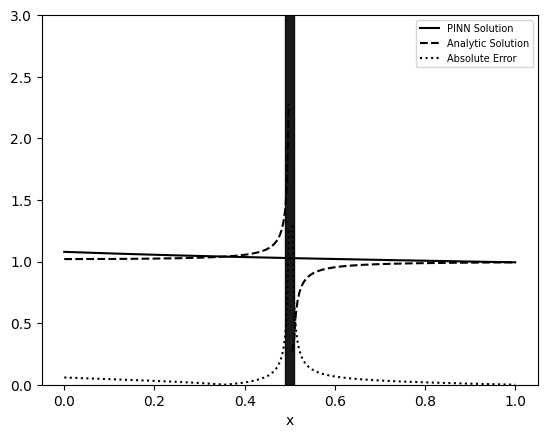

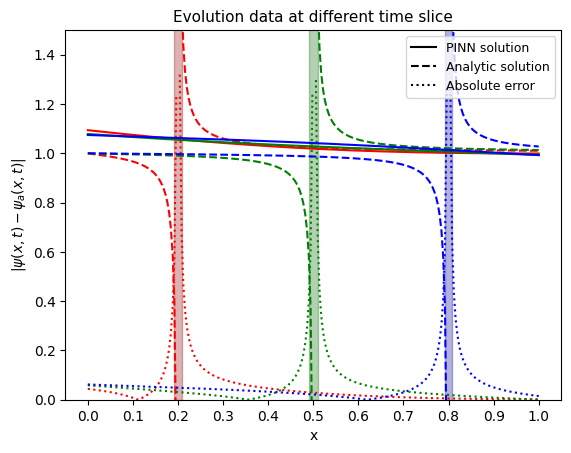

Compiling model...
Building feed-forward neural network...
'build' took 0.038269 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.421011 s

Initializing variables...
Training model...

Step      Train loss                                                      Test loss                                                       Test metric
0         [7.44e-02, 7.42e-01, 1.22e-01, 8.16e-01, 1.01e+00, 1.10e+00]    [7.44e-02, 7.42e-01, 1.22e-01, 8.16e-01, 1.01e+00, 1.10e+00]    []  
1000      [5.30e-05, 1.01e-02, 3.61e-04, 2.80e-03, 2.91e-04, 2.70e-04]    [5.30e-05, 1.01e-02, 3.61e-04, 2.80e-03, 2.91e-04, 2.70e-04]    []  
2000      [1.16e-05, 9.97e-03, 5.68e-04, 2.67e-03, 3.10e-04, 2.36e-04]    [1.16e-05, 9.97e-03, 5.68e-04, 2.67e-03, 3.10e-04, 2.36e-04]    []  
3000      [7.66e-06, 9.56e-03, 4.13e-04, 3.58e-03, 2.42e-04, 1.36e-04]    [7.66e-06, 9.56e-03, 4.13e-04, 3.58e-03, 2.42e-04, 1.36e-04]    []  
4000      [1.15e-05, 9.77e-03, 5.92e-04, 2.87e-03, 3.00e-04, 1.59e-04]    [1.15e-05, 9.77e-03, 5.92e-04, 2.87e-03, 3.00e-04, 1.59e-04]    []  
5000      [7.37e-06, 9.98e-03, 6.04e-04, 2.44e-03, 3.60e-04, 2.

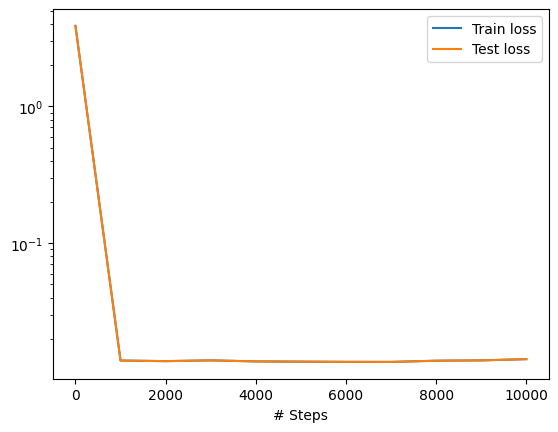

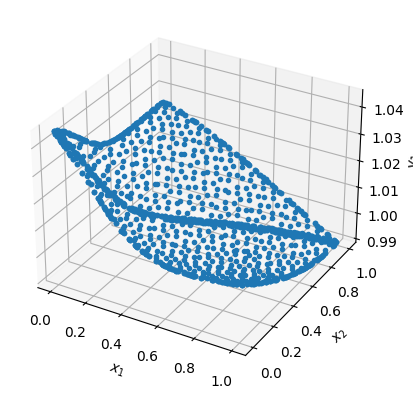

C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


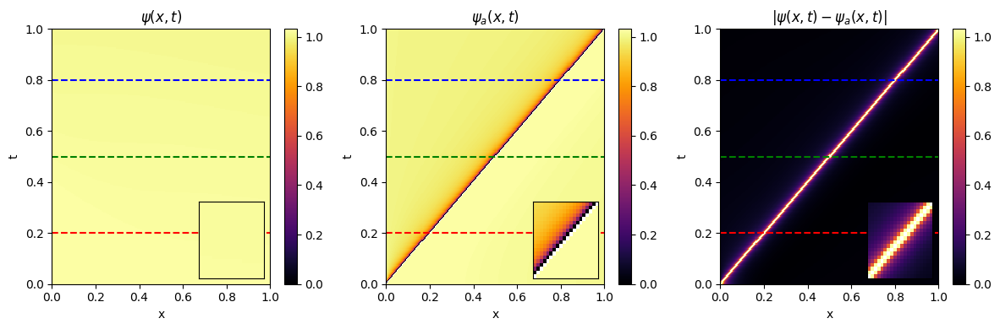

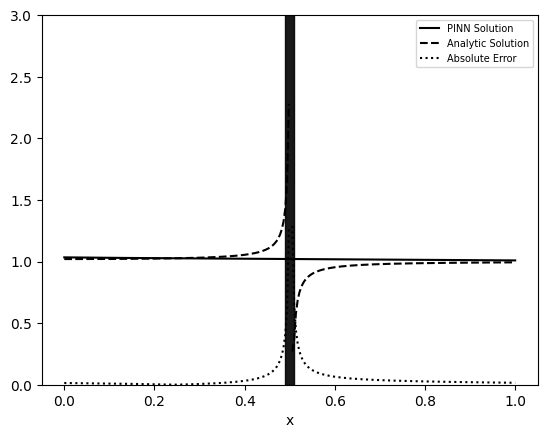

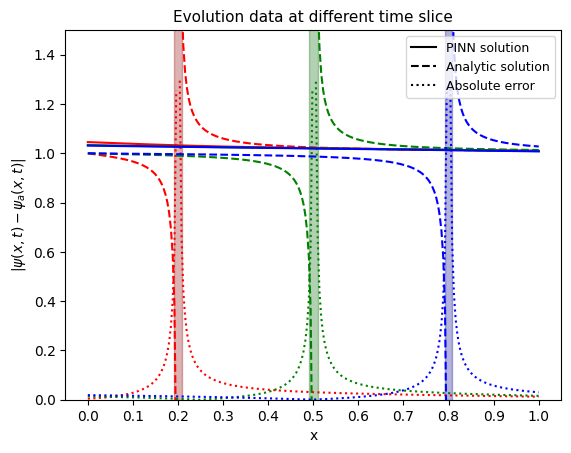

Compiling model...
Building feed-forward neural network...
'build' took 0.034545 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.406680 s

Initializing variables...
Training model...

Step      Train loss                                                      Test loss                                                       Test metric
0         [1.00e-02, 1.29e+00, 2.82e-01, 1.49e+00, 1.49e+00, 1.69e+00]    [1.00e-02, 1.29e+00, 2.82e-01, 1.49e+00, 1.49e+00, 1.69e+00]    []  
1000      [2.89e-05, 5.12e-02, 1.23e-03, 4.04e-03, 9.14e-04, 3.51e-04]    [2.89e-05, 5.12e-02, 1.23e-03, 4.04e-03, 9.14e-04, 3.51e-04]    []  
2000      [2.72e-05, 5.08e-02, 1.32e-03, 4.08e-03, 9.60e-04, 3.32e-04]    [2.72e-05, 5.08e-02, 1.32e-03, 4.08e-03, 9.60e-04, 3.32e-04]    []  
3000      [1.87e-05, 5.05e-02, 1.49e-03, 4.07e-03, 9.95e-04, 3.17e-04]    [1.87e-05, 5.05e-02, 1.49e-03, 4.07e-03, 9.95e-04, 3.17e-04]    []  
4000      [1.60e-05, 5.05e-02, 1.49e-03, 4.11e-03, 9.91e-04, 3.15e-04]    [1.60e-05, 5.05e-02, 1.49e-03, 4.11e-03, 9.91e-04, 3.15e-04]    []  
5000      [1.92e-05, 5.02e-02, 1.47e-03, 4.46e-03, 1.02e-03, 2.

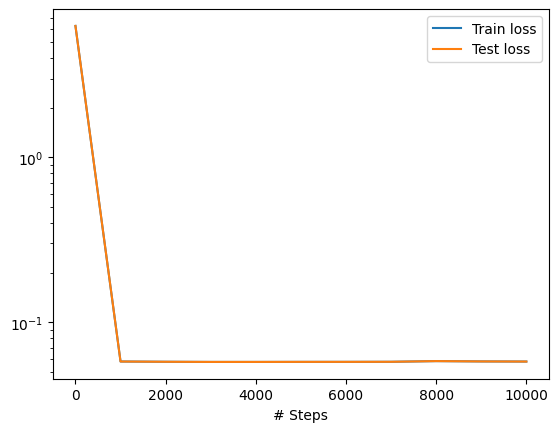

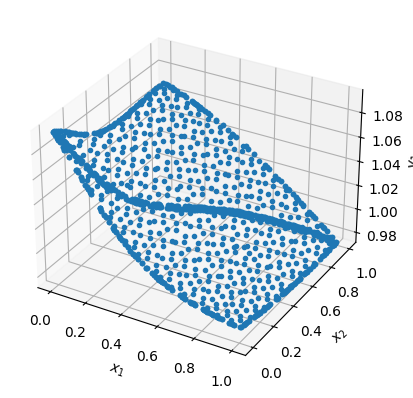

C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


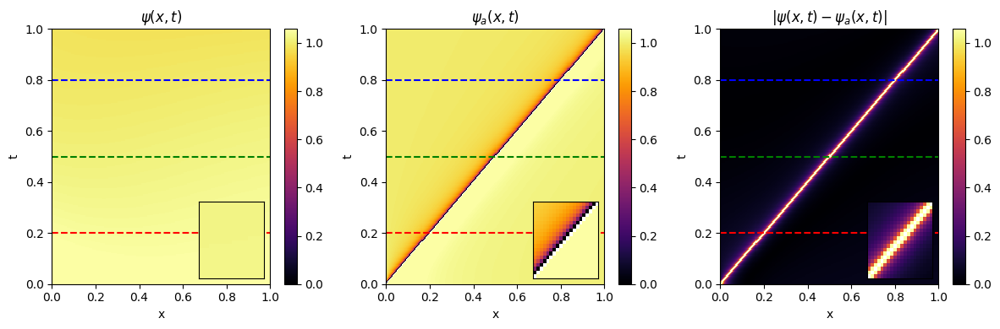

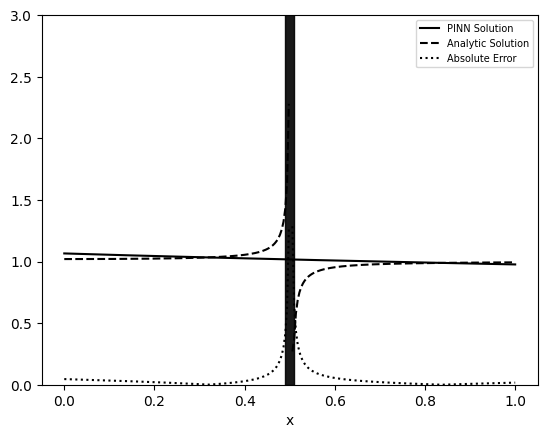

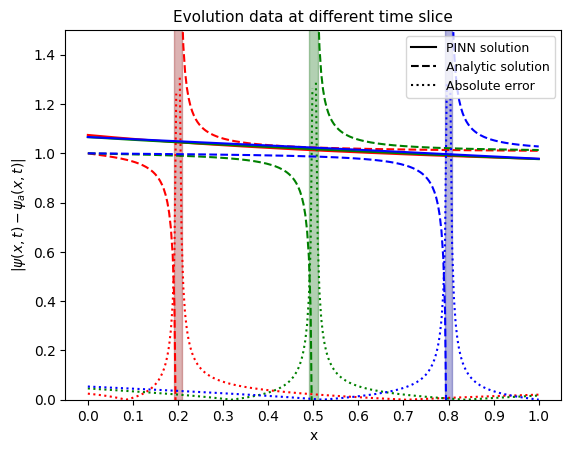

Compiling model...
Building feed-forward neural network...
'build' took 0.033075 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.333695 s

Initializing variables...
Training model...

Step      Train loss                                                      Test loss                                                       Test metric
0         [5.33e-02, 7.24e-01, 1.01e-01, 7.27e-01, 8.52e-01, 8.49e-01]    [5.33e-02, 7.24e-01, 1.01e-01, 7.27e-01, 8.52e-01, 8.49e-01]    []  
1000      [1.36e-05, 5.38e-02, 9.75e-04, 3.10e-03, 4.90e-04, 3.83e-04]    [1.36e-05, 5.38e-02, 9.75e-04, 3.10e-03, 4.90e-04, 3.83e-04]    []  
2000      [1.74e-05, 5.37e-02, 9.23e-04, 3.34e-03, 5.08e-04, 3.45e-04]    [1.74e-05, 5.37e-02, 9.23e-04, 3.34e-03, 5.08e-04, 3.45e-04]    []  
3000      [1.19e-05, 5.37e-02, 1.02e-03, 3.08e-03, 5.08e-04, 4.03e-04]    [1.19e-05, 5.37e-02, 1.02e-03, 3.08e-03, 5.08e-04, 4.03e-04]    []  
4000      [9.66e-06, 5.37e-02, 9.74e-04, 3.20e-03, 5.07e-04, 3.80e-04]    [9.66e-06, 5.37e-02, 9.74e-04, 3.20e-03, 5.07e-04, 3.80e-04]    []  
5000      [1.06e-05, 5.34e-02, 1.01e-03, 3.40e-03, 5.39e-04, 3.

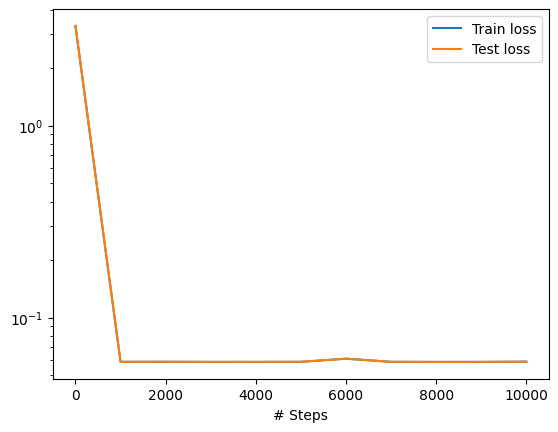

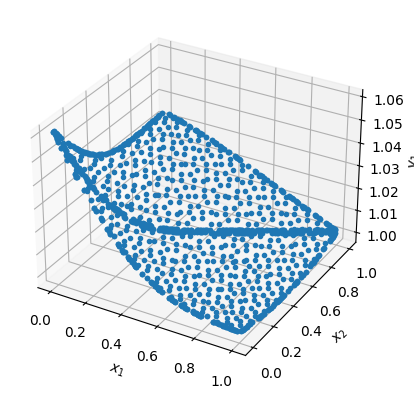

C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


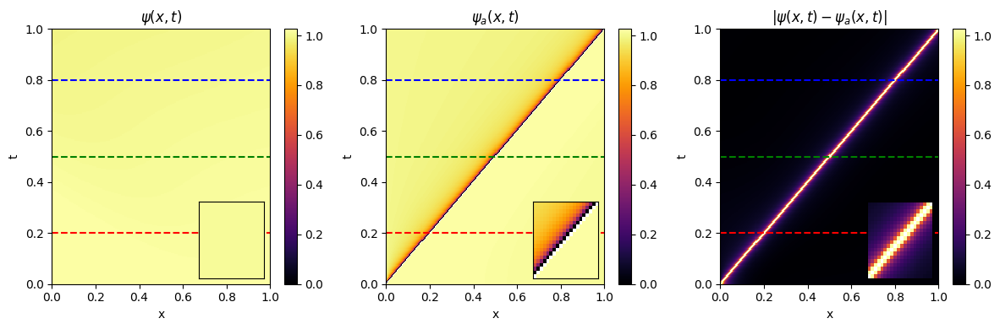

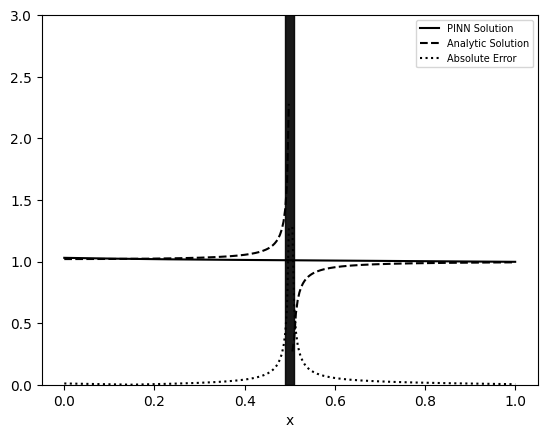

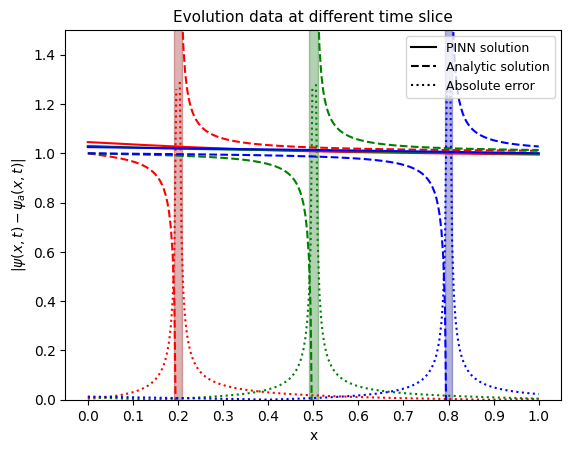

Compiling model...
Building feed-forward neural network...
'build' took 0.034412 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.451271 s

Initializing variables...
Training model...

Step      Train loss                                                      Test loss                                                       Test metric
0         [2.02e-02, 1.75e+00, 4.66e-01, 2.34e+00, 3.67e+00, 1.64e+00]    [2.02e-02, 1.75e+00, 4.66e-01, 2.34e+00, 3.67e+00, 1.64e+00]    []  
1000      [1.49e-05, 2.93e-03, 2.74e-04, 2.37e-03, 2.55e-04, 1.27e-04]    [1.49e-05, 2.93e-03, 2.74e-04, 2.37e-03, 2.55e-04, 1.27e-04]    []  
2000      [1.53e-06, 3.06e-03, 2.67e-04, 2.10e-03, 3.79e-04, 1.88e-04]    [1.53e-06, 3.06e-03, 2.67e-04, 2.10e-03, 3.79e-04, 1.88e-04]    []  
3000      [1.93e-06, 2.93e-03, 3.01e-04, 2.32e-03, 2.70e-04, 1.14e-04]    [1.93e-06, 2.93e-03, 3.01e-04, 2.32e-03, 2.70e-04, 1.14e-04]    []  
4000      [1.64e-06, 2.66e-03, 1.71e-04, 3.69e-03, 1.55e-05, 6.07e-06]    [1.64e-06, 2.66e-03, 1.71e-04, 3.69e-03, 1.55e-05, 6.07e-06]    []  
5000      [1.22e-06, 2.97e-03, 3.03e-04, 2.29e-03, 2.66e-04, 1.

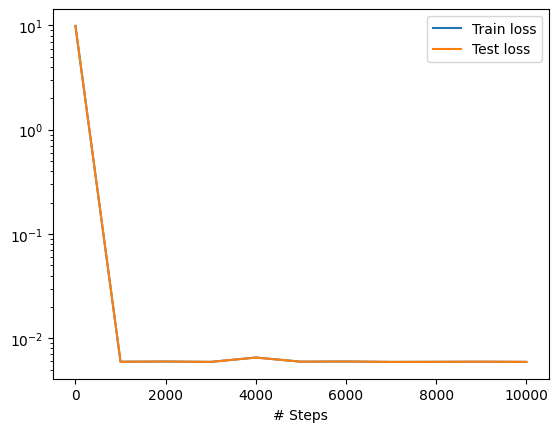

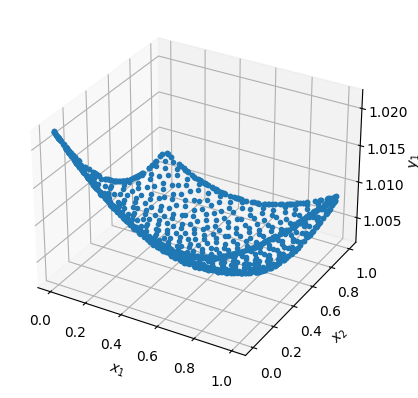

C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


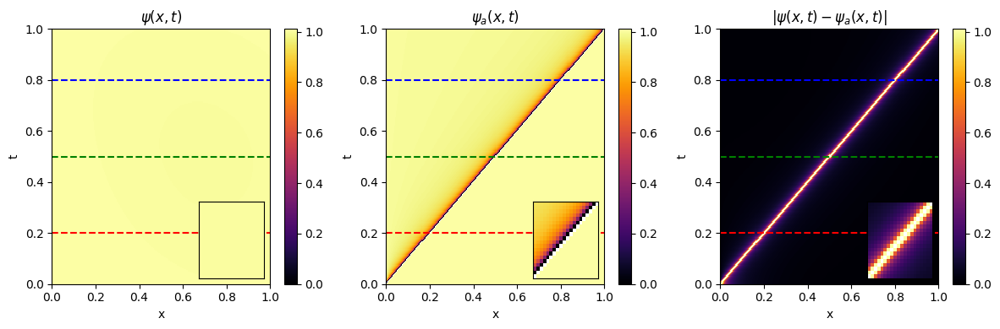

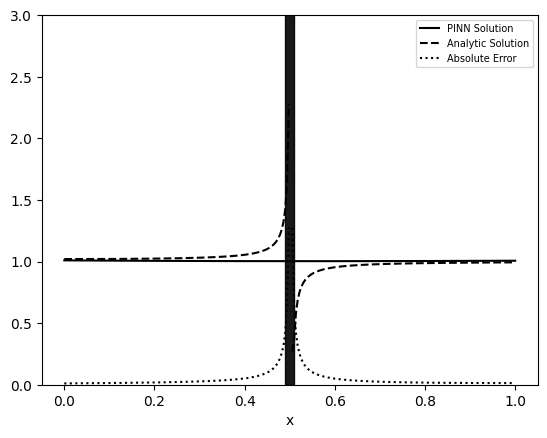

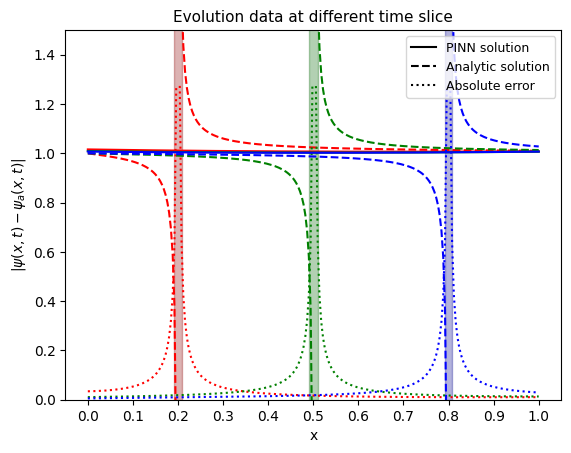

Compiling model...
Building feed-forward neural network...
'build' took 0.030853 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.384783 s

Initializing variables...
Training model...

Step      Train loss                                                      Test loss                                                       Test metric
0         [1.09e-01, 9.34e-01, 2.46e-01, 3.59e-01, 4.49e-01, 1.37e-01]    [1.09e-01, 9.34e-01, 2.46e-01, 3.59e-01, 4.49e-01, 1.37e-01]    []  
1000      [1.45e-05, 5.20e-02, 1.25e-03, 4.29e-03, 2.97e-04, 3.59e-04]    [1.45e-05, 5.20e-02, 1.25e-03, 4.29e-03, 2.97e-04, 3.59e-04]    []  
2000      [1.63e-05, 5.18e-02, 1.36e-03, 4.25e-03, 2.81e-04, 4.05e-04]    [1.63e-05, 5.18e-02, 1.36e-03, 4.25e-03, 2.81e-04, 4.05e-04]    []  
3000      [1.62e-05, 5.18e-02, 1.47e-03, 3.94e-03, 2.91e-04, 5.16e-04]    [1.62e-05, 5.18e-02, 1.47e-03, 3.94e-03, 2.91e-04, 5.16e-04]    []  
4000      [1.48e-05, 5.16e-02, 1.34e-03, 4.49e-03, 2.23e-04, 3.59e-04]    [1.48e-05, 5.16e-02, 1.34e-03, 4.49e-03, 2.23e-04, 3.59e-04]    []  
5000      [4.99e-05, 5.18e-02, 1.31e-03, 4.28e-03, 2.80e-04, 3.

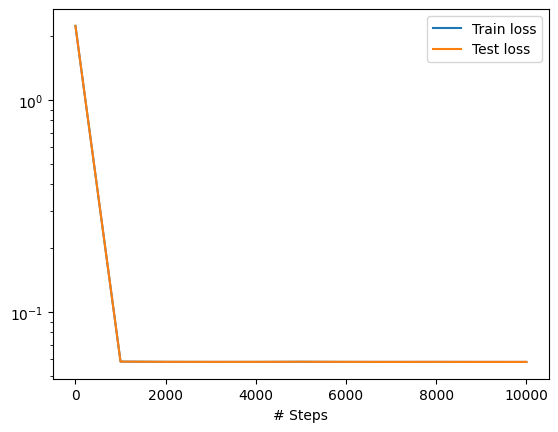

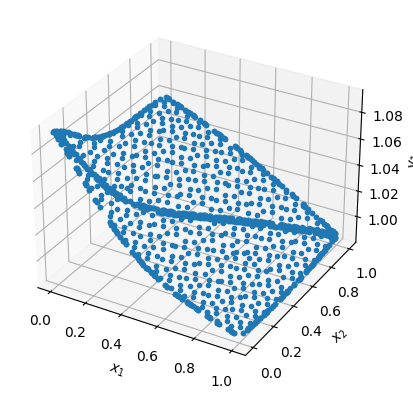

C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


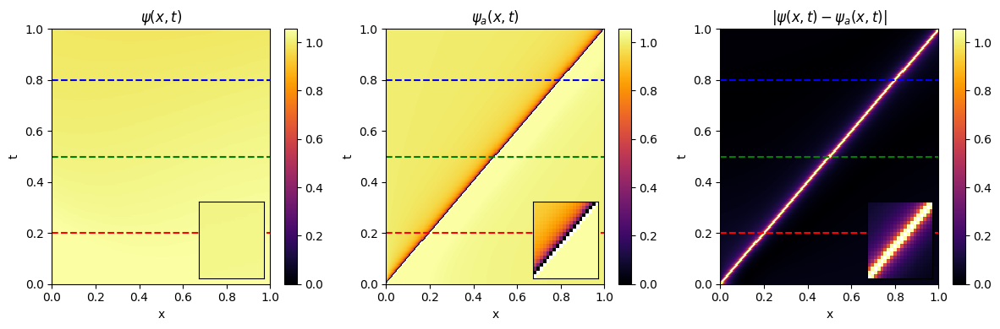

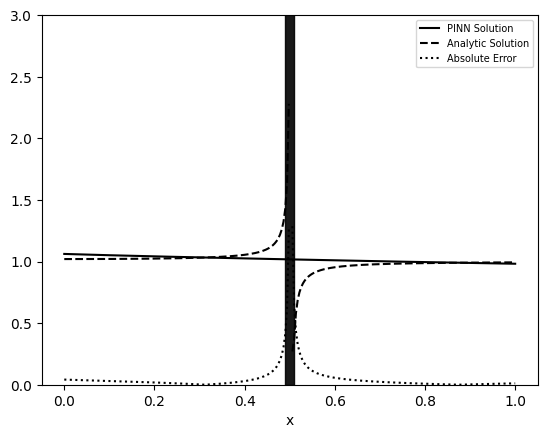

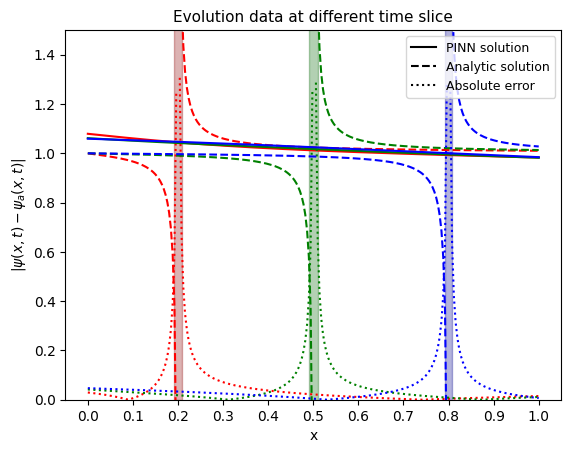

Compiling model...
Building feed-forward neural network...
'build' took 0.032609 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.496783 s

Initializing variables...
Training model...

Step      Train loss                                                      Test loss                                                       Test metric
0         [2.14e-02, 1.15e+00, 3.18e-01, 5.23e-01, 4.24e-01, 2.17e-01]    [2.14e-02, 1.15e+00, 3.18e-01, 5.23e-01, 4.24e-01, 2.17e-01]    []  
1000      [7.87e-06, 9.18e-03, 5.72e-04, 3.72e-03, 3.60e-04, 4.28e-05]    [7.87e-06, 9.18e-03, 5.72e-04, 3.72e-03, 3.60e-04, 4.28e-05]    []  
2000      [7.31e-06, 9.14e-03, 6.18e-04, 3.65e-03, 3.72e-04, 3.60e-05]    [7.31e-06, 9.14e-03, 6.18e-04, 3.65e-03, 3.72e-04, 3.60e-05]    []  
3000      [6.88e-06, 9.10e-03, 6.72e-04, 3.56e-03, 3.91e-04, 3.14e-05]    [6.88e-06, 9.10e-03, 6.72e-04, 3.56e-03, 3.91e-04, 3.14e-05]    []  
4000      [7.48e-06, 9.09e-03, 7.12e-04, 3.46e-03, 4.12e-04, 2.96e-05]    [7.48e-06, 9.09e-03, 7.12e-04, 3.46e-03, 4.12e-04, 2.96e-05]    []  
5000      [1.32e-05, 8.94e-03, 7.50e-04, 3.59e-03, 3.70e-04, 3.

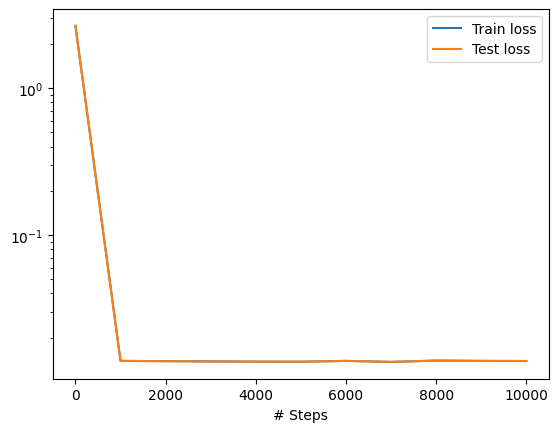

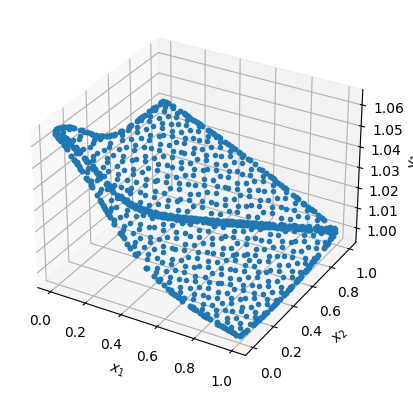

C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


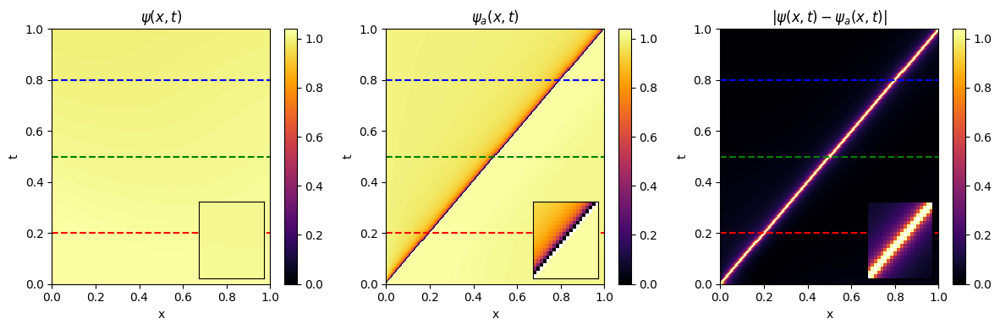

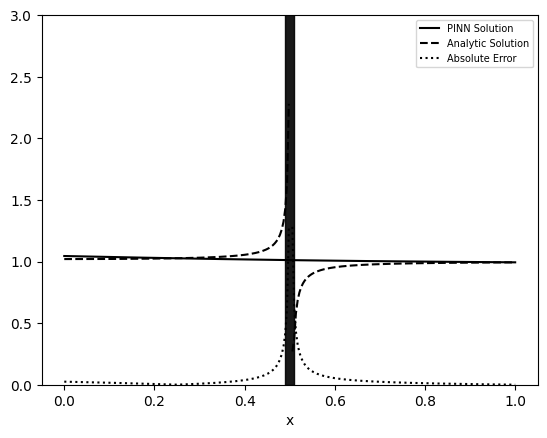

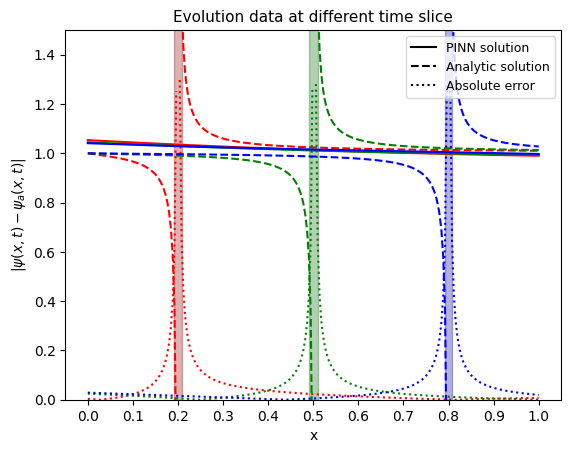

Compiling model...
Building feed-forward neural network...
'build' took 0.031979 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.418386 s

Initializing variables...
Training model...

Step      Train loss                                                      Test loss                                                       Test metric
0         [1.15e-02, 1.21e+00, 3.77e-02, 1.12e+00, 1.24e+00, 1.39e+00]    [1.15e-02, 1.21e+00, 3.77e-02, 1.12e+00, 1.24e+00, 1.39e+00]    []  
1000      [1.24e-05, 1.02e-02, 4.44e-04, 3.97e-03, 1.33e-04, 3.70e-04]    [1.24e-05, 1.02e-02, 4.44e-04, 3.97e-03, 1.33e-04, 3.70e-04]    []  
2000      [9.63e-06, 9.94e-03, 5.99e-04, 3.79e-03, 1.64e-04, 4.07e-04]    [9.63e-06, 9.94e-03, 5.99e-04, 3.79e-03, 1.64e-04, 4.07e-04]    []  
3000      [1.22e-05, 9.82e-03, 5.66e-04, 4.05e-03, 1.33e-04, 2.89e-04]    [1.22e-05, 9.82e-03, 5.66e-04, 4.05e-03, 1.33e-04, 2.89e-04]    []  
4000      [7.97e-06, 9.86e-03, 6.16e-04, 3.90e-03, 1.54e-04, 3.27e-04]    [7.97e-06, 9.86e-03, 6.16e-04, 3.90e-03, 1.54e-04, 3.27e-04]    []  
5000      [1.01e-05, 9.80e-03, 6.72e-04, 3.75e-03, 1.85e-04, 3.

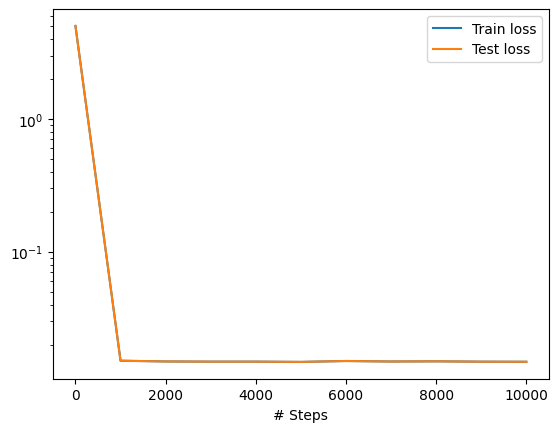

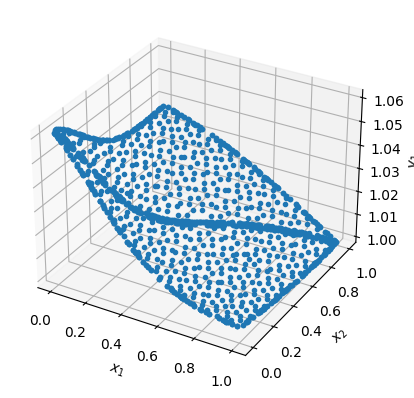

C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


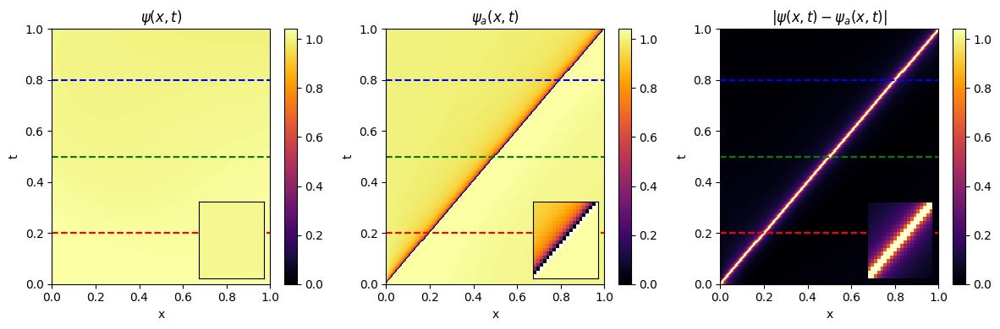

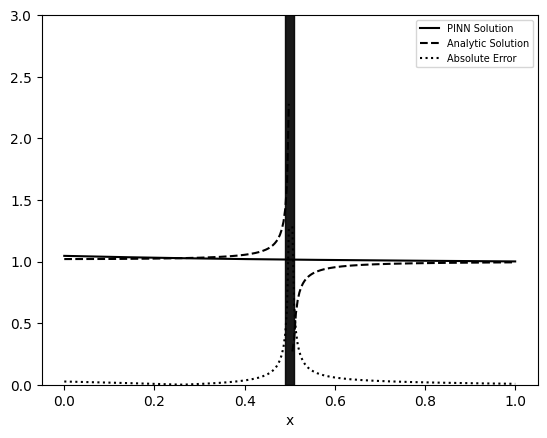

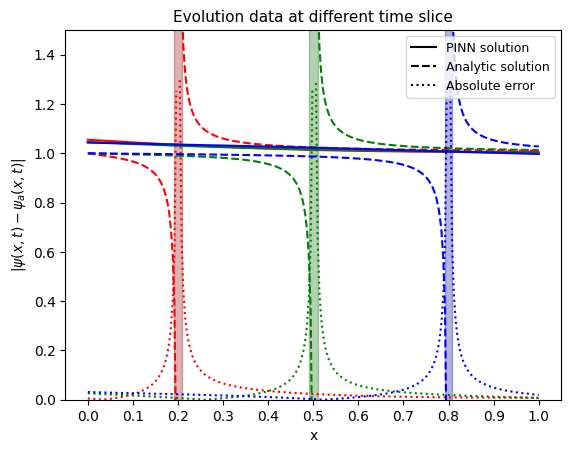

In [21]:

for i in range(10):
    model_t = generate_evolution_model(throat, 500, 500, 10, 1, lr, iterations,3);
    analytic_v_t, v_t, diff_t = plot_evolution_model_sliced(throat, model_t)
    plot_evolution_slice(0.01, 0.5, analytic_v_t, v_t, diff_t)
    
    # Define the x-axis values
    x = np.linspace(0, 1, len(diff_t))
    a = 0.01

    # Create a Figure and Axes
    fig, ax = plt.subplots()

    # Set the threshold value
    threshold = 50

    # Plot for t = 0.2
    t = 0.2
    ax.fill_between(x, 0, 5, where=(x >= t - a) & (x <= t + a), alpha=0.3, color='darkred')
    t = round(t * 255)
    ax.plot(x, v_t.T[:, t],
            'r-')
    ax.plot(x, analytic_v_t.T[:, t],
            'r--')
    ax.plot(x, np.where((abs((v_t.T[:, t] - analytic_v_t[:, t]))) < threshold,
                        (abs((v_t.T[:, t] - analytic_v_t[:, t]))), np.nan),
            'r:')

    # Plot for t = 0.5
    t = 0.5
    ax.fill_between(x, 0, 5, where=(x >= t - a) & (x <= t + a), alpha=0.3, color='darkgreen')
    t = round(t * 255)
    ax.plot(x, v_t.T[:, t],
            'g-')
    ax.plot(x, analytic_v_t.T[:, t],
            'g--')
    ax.plot(x, np.where((abs((v_t.T[:, t] - analytic_v_t[:, t]))) < threshold,
                        (abs((v_t.T[:, t] - analytic_v_t[:, t]))), np.nan),
            'g:')

    # Plot for t = 0.8
    t = 0.8
    ax.fill_between(x, 0, 5, where=(x >= t - a) & (x <= t + a), alpha=0.3, color='darkblue')
    t = round(t * 255)
    ax.plot(x, v_t.T[:, t],
            'b-')
    ax.plot(x, analytic_v_t.T[:, t],
            'b--')
    ax.plot(x, np.where((abs((v_t.T[:, t] - analytic_v_t[:, t]))) < threshold,
                        (abs((v_t.T[:, t] - analytic_v_t[:, t]))), np.nan),
            'b:')
    
    
    ax.plot(x,v_t.T[:, t] + 100, 'k-', label = 'PINN solution')
    
    ax.plot(x,v_t.T[:, t]+100, 'k--', label = 'Analytic solution')
    
    ax.plot(x,v_t.T[:, t]+100, 'k:', label = 'Absolute error')
    

    # Set the title and labels
    ax.set_xlabel("x")
    ax.set_ylabel(r'$|\psi(x,t)-\psi_{a}(x,t)|$')
    ax.set_ylim(0, 1.5)

    # Set ticker on the axis ticks
    ax.set_xticks(np.arange(0, 1.1, 0.1))
    ax.set_yticks(np.arange(0, 1.5, 0.2))

    # Add a legend
    legend = ax.legend(fontsize=9)


    # Set the plot title
    ax.set_title("Evolution data at different time slice", fontsize=11)


    # Show the plot
    plt.show()
    



Compiling model...
Building feed-forward neural network...
'build' took 0.032432 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.395314 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [1.65e-02, 1.03e+00, 3.60e-01]    [1.65e-02, 1.03e+00, 3.60e-01]    []  
1000      [2.44e-06, 2.89e-03, 1.29e-05]    [2.44e-06, 2.89e-03, 1.29e-05]    []  
2000      [1.90e-06, 2.87e-03, 1.79e-05]    [1.90e-06, 2.87e-03, 1.79e-05]    []  
3000      [7.20e-06, 2.84e-03, 2.86e-05]    [7.20e-06, 2.84e-03, 2.86e-05]    []  
4000      [2.81e-06, 2.86e-03, 2.84e-05]    [2.81e-06, 2.86e-03, 2.84e-05]    []  
5000      [1.20e-05, 2.93e-03, 7.59e-06]    [1.20e-05, 2.93e-03, 7.59e-06]    []  
6000      [1.52e-06, 2.87e-03, 2.58e-05]    [1.52e-06, 2.87e-03, 2.58e-05]    []  
7000      [1.48e-06, 2.87e-03, 2.58e-05]    [1.48e-06, 2.87e-03, 2.58e-05]    []  
8000      [2.22e-06, 2.88e-03, 2.94e-05]    [2.22e-06, 2.88e-03, 2.94e-05]    []  
9000      [4.79e-06, 2.86e-03, 2.95e-05]    [4.79e-06, 2.86e-03, 2.95e-05]    []  
10000   

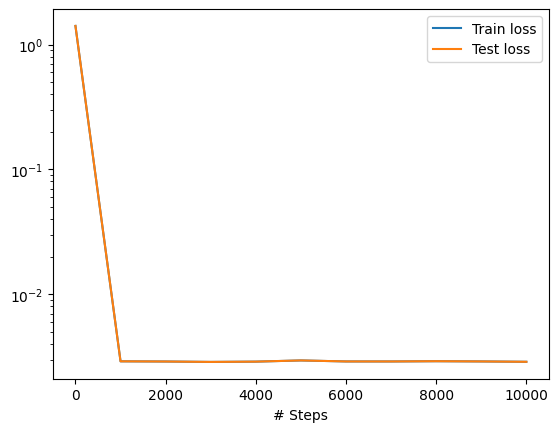

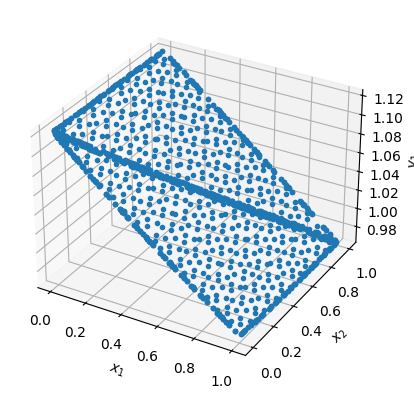

C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


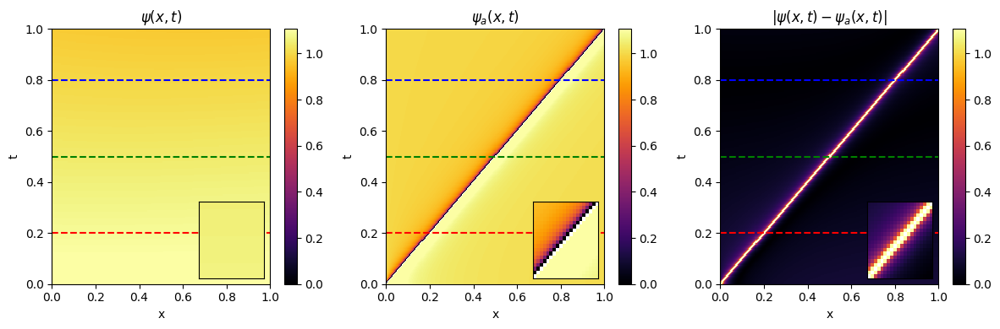

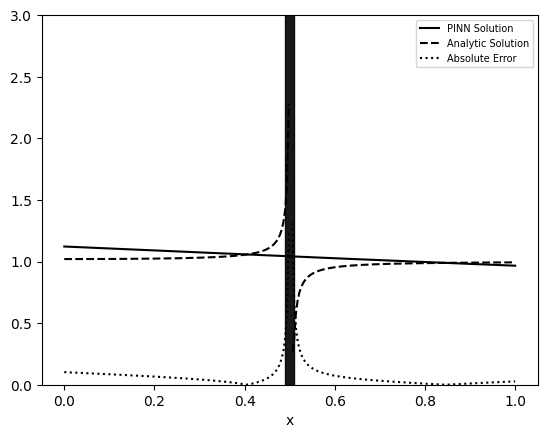

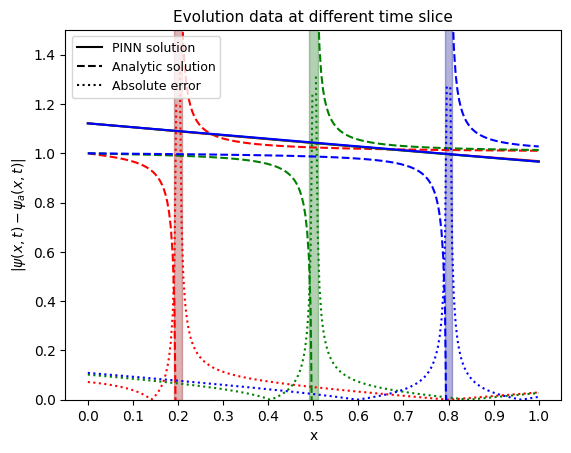

Compiling model...
Building feed-forward neural network...
'build' took 0.032756 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.342973 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [1.95e-02, 1.42e+00, 7.45e-02]    [1.95e-02, 1.42e+00, 7.45e-02]    []  
1000      [2.80e-05, 5.07e-02, 1.04e-03]    [2.80e-05, 5.07e-02, 1.04e-03]    []  
2000      [2.69e-05, 5.06e-02, 1.08e-03]    [2.69e-05, 5.06e-02, 1.08e-03]    []  
3000      [2.99e-05, 5.06e-02, 1.11e-03]    [2.99e-05, 5.06e-02, 1.11e-03]    []  
4000      [3.15e-05, 5.06e-02, 1.11e-03]    [3.15e-05, 5.06e-02, 1.11e-03]    []  
5000      [5.03e-05, 5.06e-02, 1.30e-03]    [5.03e-05, 5.06e-02, 1.30e-03]    []  
6000      [4.05e-05, 5.17e-02, 1.37e-03]    [4.05e-05, 5.17e-02, 1.37e-03]    []  
7000      [2.76e-05, 5.07e-02, 1.06e-03]    [2.76e-05, 5.07e-02, 1.06e-03]    []  
8000      [1.05e-04, 5.25e-02, 7.33e-05]    [1.05e-04, 5.25e-02, 7.33e-05]    []  
9000      [2.34e-05, 5.07e-02, 1.03e-03]    [2.34e-05, 5.07e-02, 1.03e-03]    []  
10000   

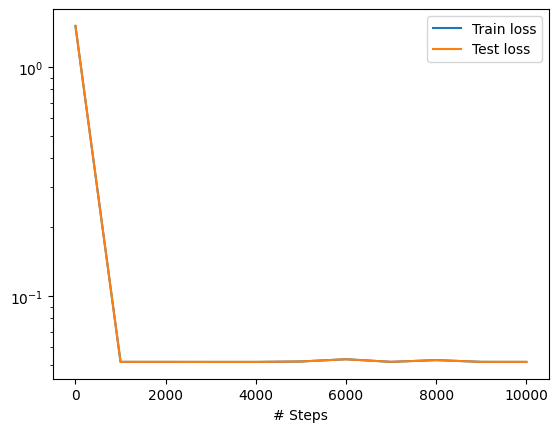

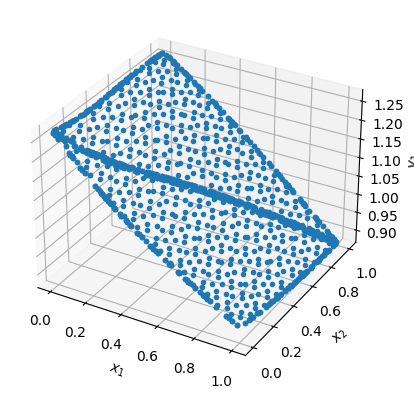

C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


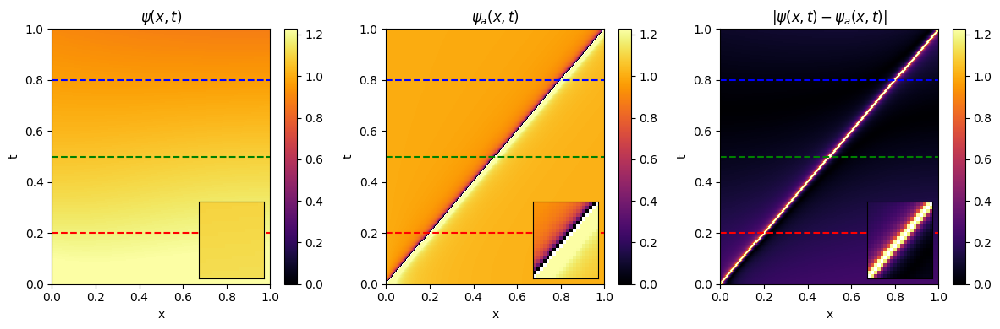

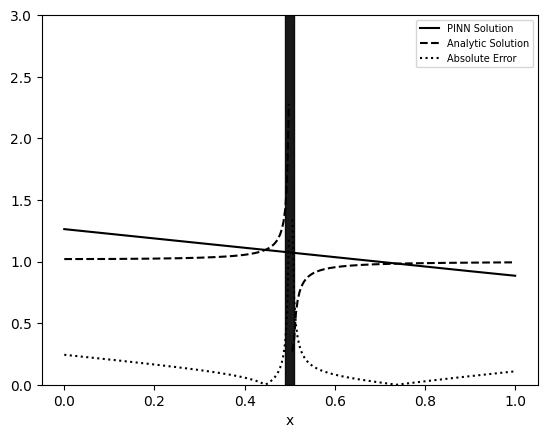

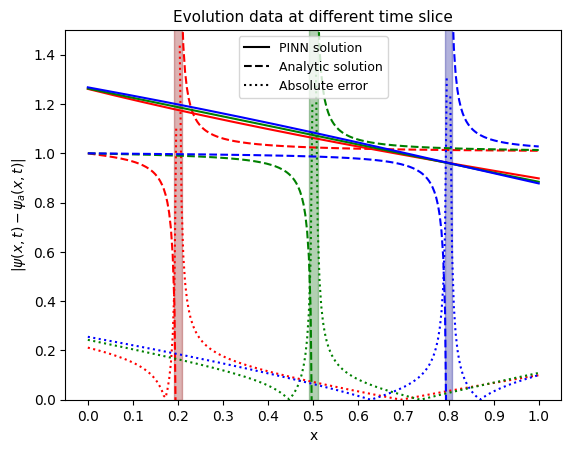

Compiling model...
Building feed-forward neural network...
'build' took 0.041321 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.408399 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [3.04e-03, 1.62e+00, 1.97e-02]    [3.04e-03, 1.62e+00, 1.97e-02]    []  
1000      [1.37e-05, 4.48e-02, 6.12e-04]    [1.37e-05, 4.48e-02, 6.12e-04]    []  
2000      [1.47e-05, 4.47e-02, 6.32e-04]    [1.47e-05, 4.47e-02, 6.32e-04]    []  
3000      [2.23e-05, 4.47e-02, 6.32e-04]    [2.23e-05, 4.47e-02, 6.32e-04]    []  
4000      [2.22e-05, 4.47e-02, 6.32e-04]    [2.22e-05, 4.47e-02, 6.32e-04]    []  
5000      [1.95e-05, 4.47e-02, 7.06e-04]    [1.95e-05, 4.47e-02, 7.06e-04]    []  
6000      [1.72e-05, 4.54e-02, 1.00e-03]    [1.72e-05, 4.54e-02, 1.00e-03]    []  
7000      [1.37e-05, 4.47e-02, 6.66e-04]    [1.37e-05, 4.47e-02, 6.66e-04]    []  
8000      [4.73e-05, 4.56e-02, 1.85e-04]    [4.73e-05, 4.56e-02, 1.85e-04]    []  
9000      [3.41e-05, 4.48e-02, 5.88e-04]    [3.41e-05, 4.48e-02, 5.88e-04]    []  
10000   

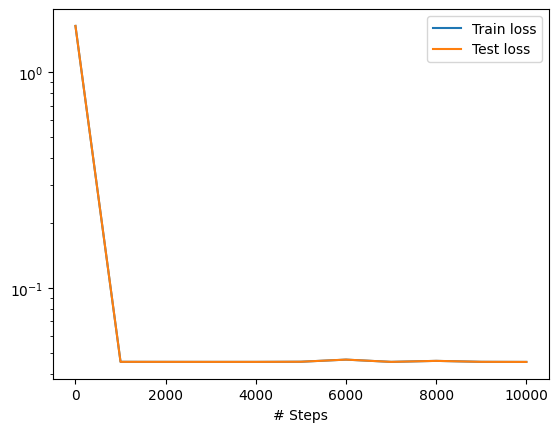

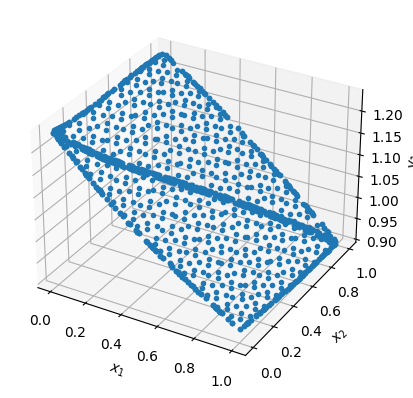

C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


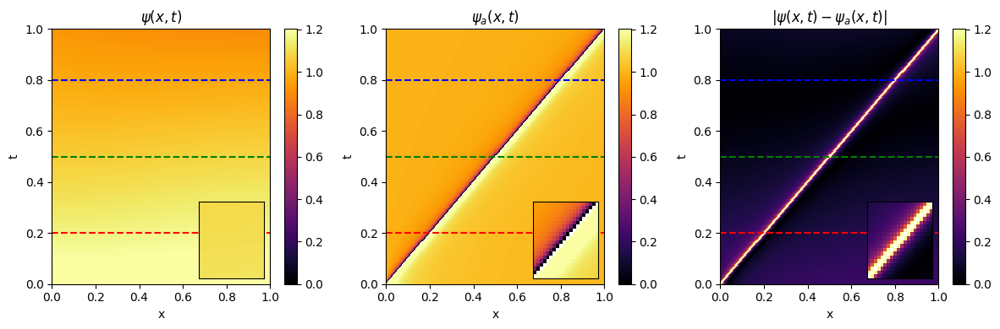

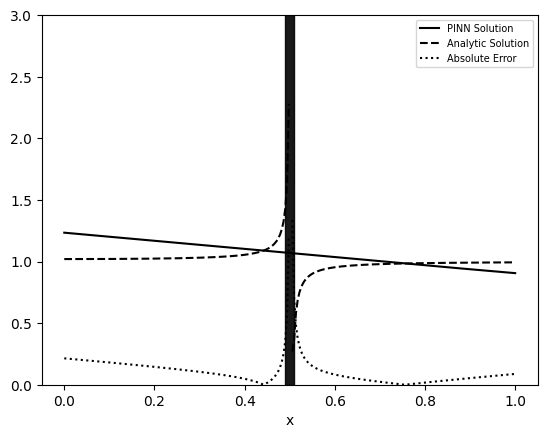

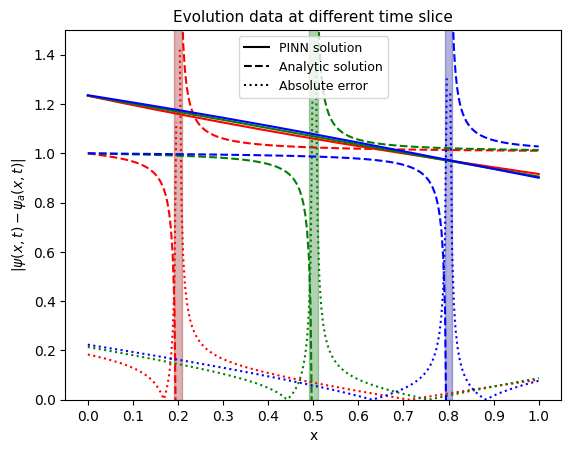

Compiling model...
Building feed-forward neural network...
'build' took 0.031550 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.395612 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [3.63e-02, 8.70e-01, 6.61e-02]    [3.63e-02, 8.70e-01, 6.61e-02]    []  
1000      [7.15e-06, 6.39e-03, 1.55e-04]    [7.15e-06, 6.39e-03, 1.55e-04]    []  
2000      [4.18e-06, 6.36e-03, 1.77e-04]    [4.18e-06, 6.36e-03, 1.77e-04]    []  
3000      [2.81e-06, 6.36e-03, 1.95e-04]    [2.81e-06, 6.36e-03, 1.95e-04]    []  
4000      [1.43e-05, 6.54e-03, 2.57e-04]    [1.43e-05, 6.54e-03, 2.57e-04]    []  
5000      [8.34e-06, 6.51e-03, 2.37e-04]    [8.34e-06, 6.51e-03, 2.37e-04]    []  
6000      [5.70e-06, 6.33e-03, 2.08e-04]    [5.70e-06, 6.33e-03, 2.08e-04]    []  
7000      [4.67e-06, 6.37e-03, 1.65e-04]    [4.67e-06, 6.37e-03, 1.65e-04]    []  
8000      [5.37e-06, 6.35e-03, 1.79e-04]    [5.37e-06, 6.35e-03, 1.79e-04]    []  
9000      [6.79e-06, 6.34e-03, 1.82e-04]    [6.79e-06, 6.34e-03, 1.82e-04]    []  
10000   

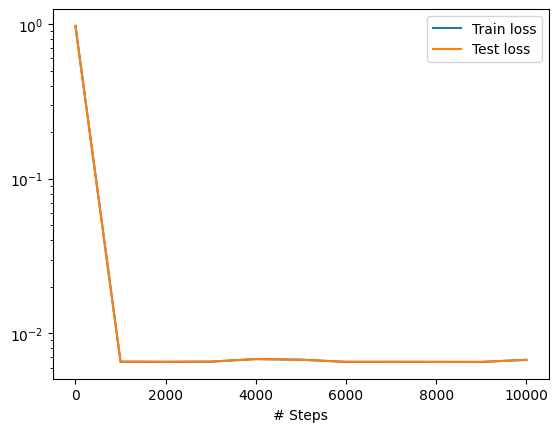

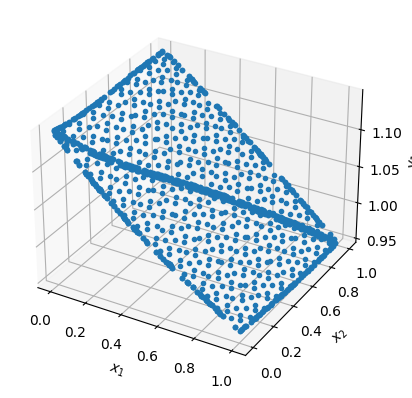

C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


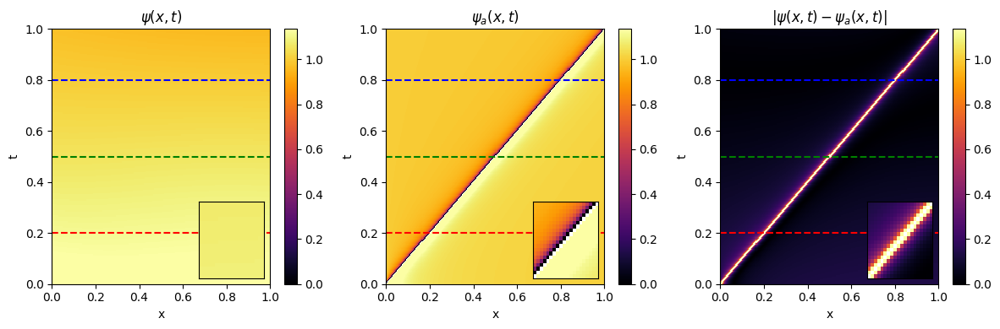

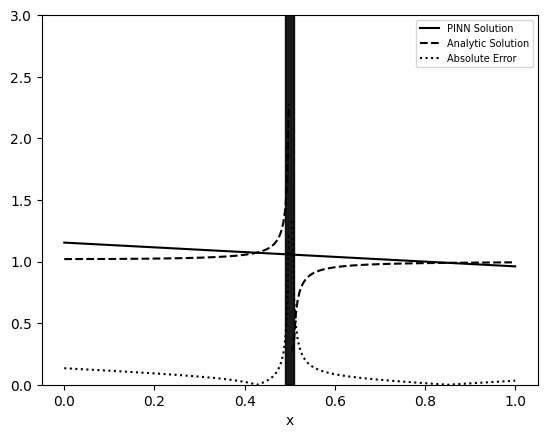

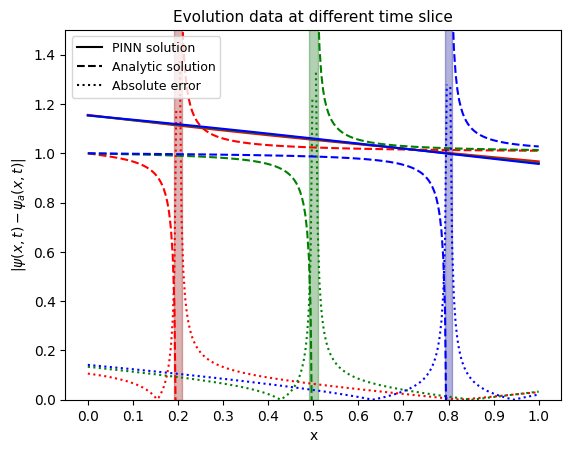

Compiling model...
Building feed-forward neural network...
'build' took 0.039837 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.584862 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [2.91e-02, 9.08e-01, 1.01e+00]    [2.91e-02, 9.08e-01, 1.01e+00]    []  
1000      [2.77e-07, 3.56e-04, 1.18e-06]    [2.77e-07, 3.56e-04, 1.18e-06]    []  
2000      [1.94e-06, 3.57e-04, 1.46e-06]    [1.94e-06, 3.57e-04, 1.46e-06]    []  
3000      [7.08e-07, 3.55e-04, 1.33e-06]    [7.08e-07, 3.55e-04, 1.33e-06]    []  
4000      [3.23e-07, 3.54e-04, 1.09e-06]    [3.23e-07, 3.54e-04, 1.09e-06]    []  
5000      [2.48e-07, 3.56e-04, 5.44e-07]    [2.48e-07, 3.56e-04, 5.44e-07]    []  
6000      [3.05e-07, 3.55e-04, 8.49e-07]    [3.05e-07, 3.55e-04, 8.49e-07]    []  
7000      [1.01e-06, 3.58e-04, 3.68e-07]    [1.01e-06, 3.58e-04, 3.68e-07]    []  
8000      [1.26e-06, 3.69e-04, 9.58e-07]    [1.26e-06, 3.69e-04, 9.58e-07]    []  
9000      [5.37e-07, 3.57e-04, 9.40e-07]    [5.37e-07, 3.57e-04, 9.40e-07]    []  
10000   

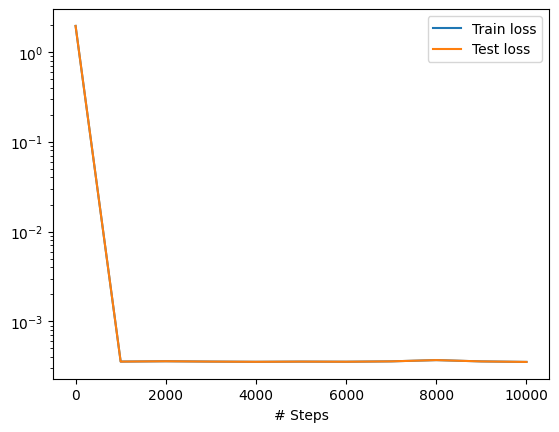

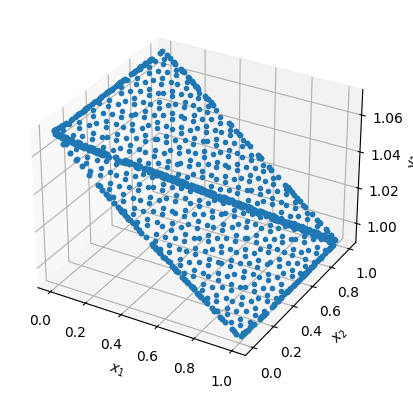

C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


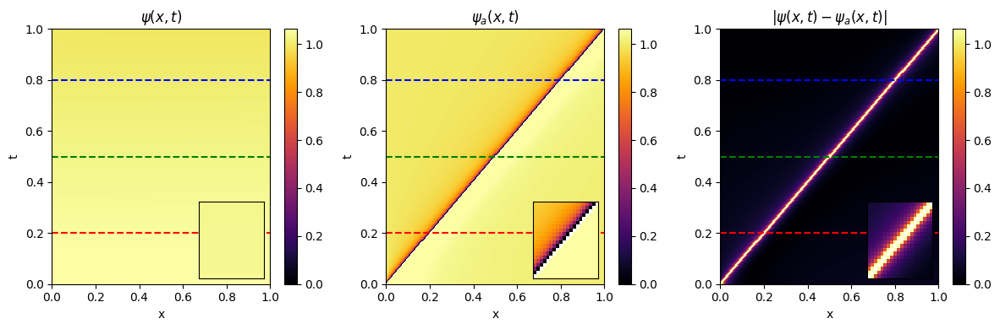

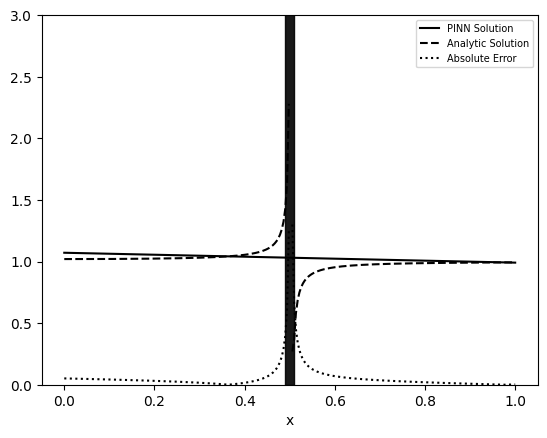

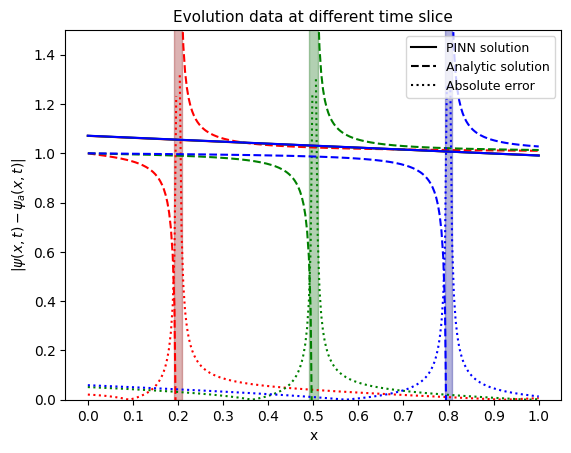

Compiling model...
Building feed-forward neural network...
'build' took 0.032777 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.417879 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [3.79e-02, 1.23e+00, 6.22e-01]    [3.79e-02, 1.23e+00, 6.22e-01]    []  
1000      [1.19e-05, 4.94e-03, 1.57e-05]    [1.19e-05, 4.94e-03, 1.57e-05]    []  
2000      [5.68e-06, 4.87e-03, 5.06e-05]    [5.68e-06, 4.87e-03, 5.06e-05]    []  
3000      [3.92e-06, 4.74e-03, 1.15e-04]    [3.92e-06, 4.74e-03, 1.15e-04]    []  
4000      [4.14e-06, 4.73e-03, 1.19e-04]    [4.14e-06, 4.73e-03, 1.19e-04]    []  
5000      [7.35e-06, 4.86e-03, 1.61e-04]    [7.35e-06, 4.86e-03, 1.61e-04]    []  
6000      [9.98e-06, 5.04e-03, 1.61e-04]    [9.98e-06, 5.04e-03, 1.61e-04]    []  
7000      [4.15e-06, 4.75e-03, 1.12e-04]    [4.15e-06, 4.75e-03, 1.12e-04]    []  
8000      [1.24e-05, 4.78e-03, 1.07e-04]    [1.24e-05, 4.78e-03, 1.07e-04]    []  
9000      [6.93e-06, 4.92e-03, 5.97e-05]    [6.93e-06, 4.92e-03, 5.97e-05]    []  
10000   

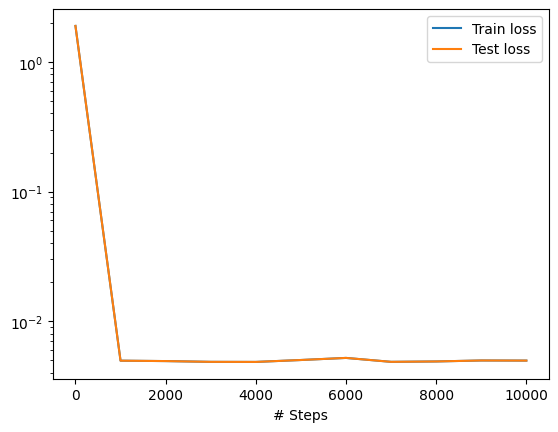

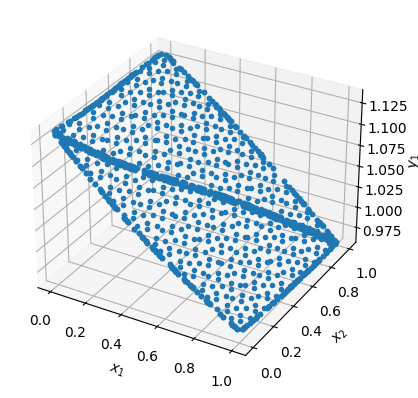

C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


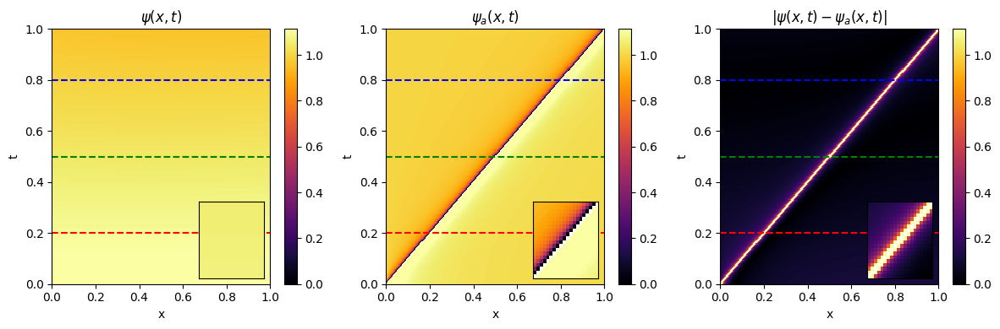

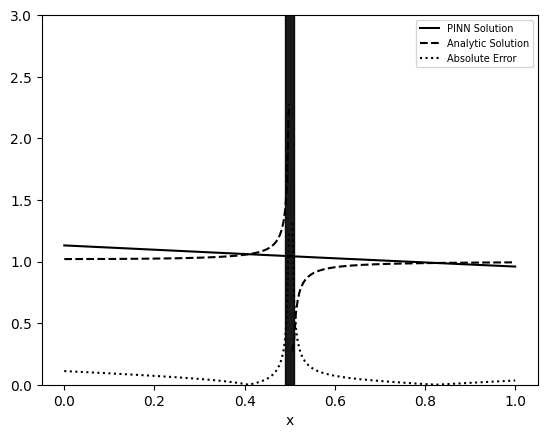

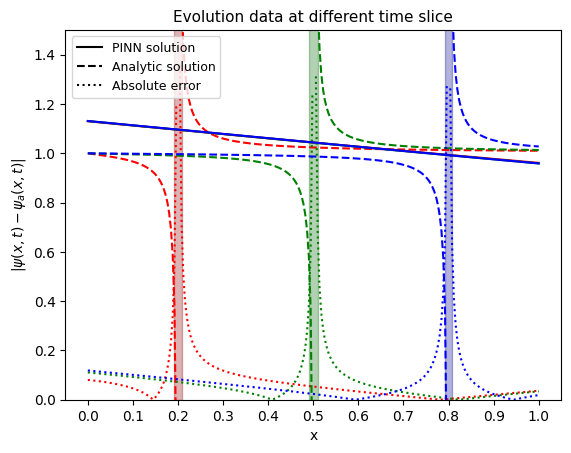

Compiling model...
Building feed-forward neural network...
'build' took 0.038457 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.709625 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [9.52e-02, 9.39e-01, 4.50e-02]    [9.52e-02, 9.39e-01, 4.50e-02]    []  
1000      [2.30e-05, 4.55e-02, 7.96e-04]    [2.30e-05, 4.55e-02, 7.96e-04]    []  
2000      [2.68e-05, 4.55e-02, 8.10e-04]    [2.68e-05, 4.55e-02, 8.10e-04]    []  
3000      [2.88e-05, 4.55e-02, 8.03e-04]    [2.88e-05, 4.55e-02, 8.03e-04]    []  
4000      [2.94e-05, 4.55e-02, 8.02e-04]    [2.94e-05, 4.55e-02, 8.02e-04]    []  
5000      [4.80e-05, 4.54e-02, 8.55e-04]    [4.80e-05, 4.54e-02, 8.55e-04]    []  
6000      [2.87e-05, 4.55e-02, 7.95e-04]    [2.87e-05, 4.55e-02, 7.95e-04]    []  
7000      [3.45e-05, 4.55e-02, 7.70e-04]    [3.45e-05, 4.55e-02, 7.70e-04]    []  
8000      [3.58e-05, 4.54e-02, 8.19e-04]    [3.58e-05, 4.54e-02, 8.19e-04]    []  
9000      [1.30e-04, 4.96e-02, 4.38e-03]    [1.30e-04, 4.96e-02, 4.38e-03]    []  
10000   

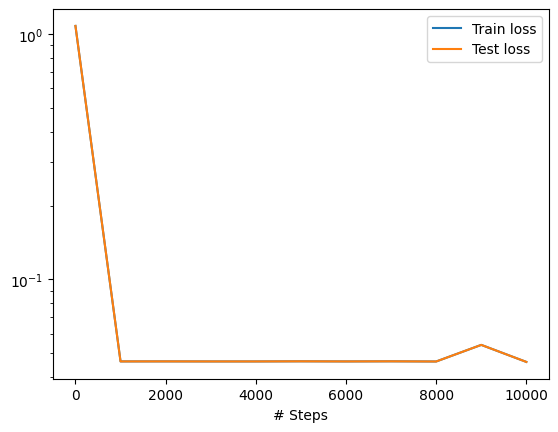

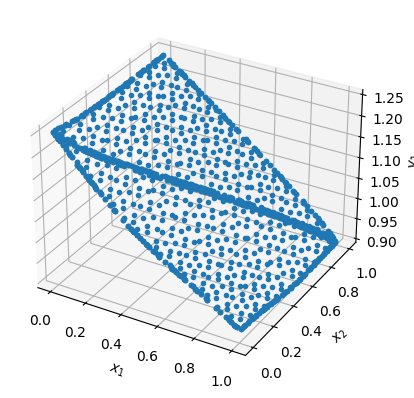

C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


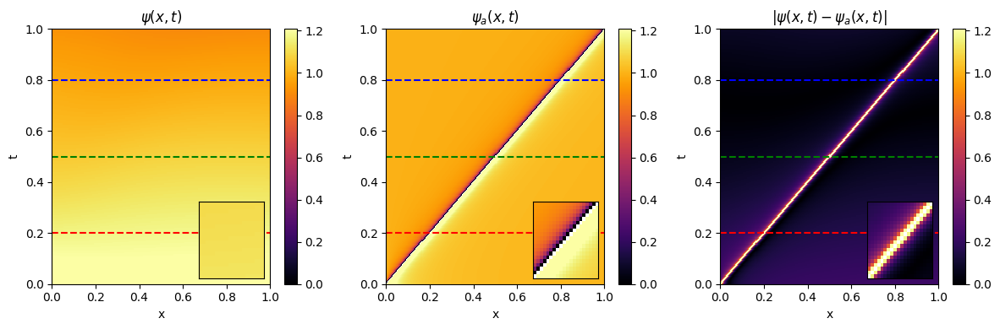

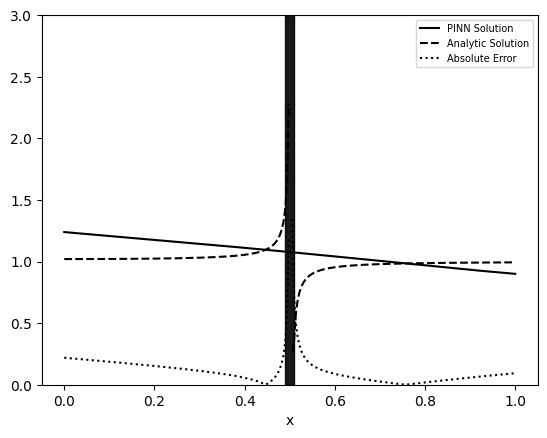

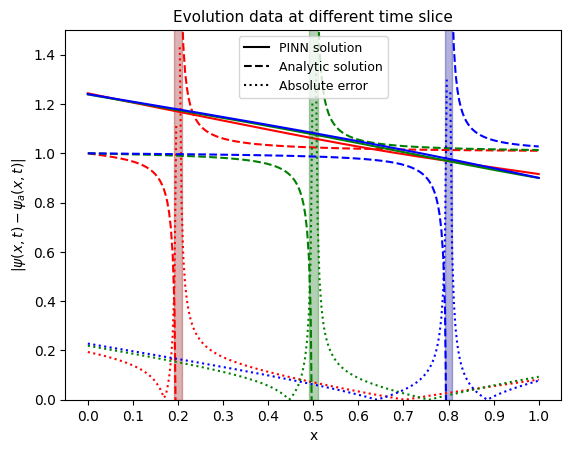

Compiling model...
Building feed-forward neural network...
'build' took 0.034611 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.459378 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [1.91e-02, 1.21e+00, 1.23e-01]    [1.91e-02, 1.21e+00, 1.23e-01]    []  
1000      [1.23e-06, 9.48e-04, 9.31e-07]    [1.23e-06, 9.48e-04, 9.31e-07]    []  
2000      [4.20e-07, 9.37e-04, 3.56e-06]    [4.20e-07, 9.37e-04, 3.56e-06]    []  
3000      [4.27e-07, 9.37e-04, 4.22e-06]    [4.27e-07, 9.37e-04, 4.22e-06]    []  
4000      [5.45e-06, 9.91e-04, 5.81e-07]    [5.45e-06, 9.91e-04, 5.81e-07]    []  
5000      [1.30e-06, 9.64e-04, 1.18e-06]    [1.30e-06, 9.64e-04, 1.18e-06]    []  
6000      [5.90e-07, 9.61e-04, 2.40e-06]    [5.90e-07, 9.61e-04, 2.40e-06]    []  
7000      [4.53e-07, 9.36e-04, 4.94e-06]    [4.53e-07, 9.36e-04, 4.94e-06]    []  
8000      [4.36e-07, 9.69e-04, 3.74e-06]    [4.36e-07, 9.69e-04, 3.74e-06]    []  
9000      [1.49e-05, 9.37e-04, 1.18e-05]    [1.49e-05, 9.37e-04, 1.18e-05]    []  
10000   

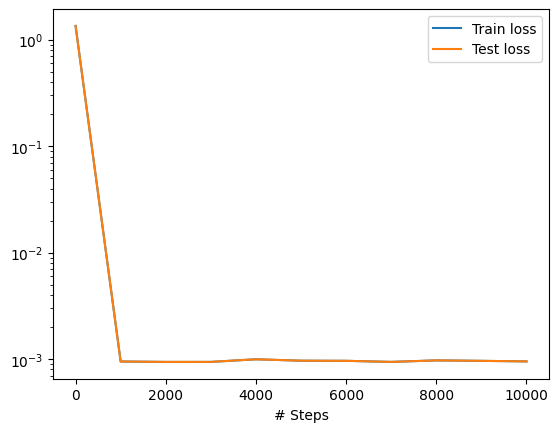

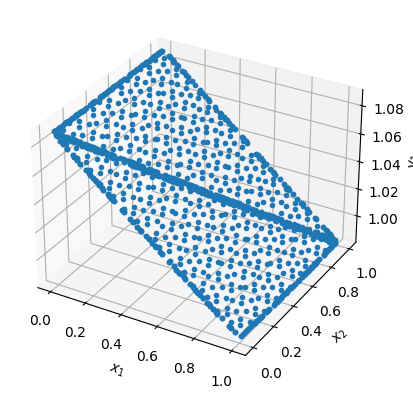

C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


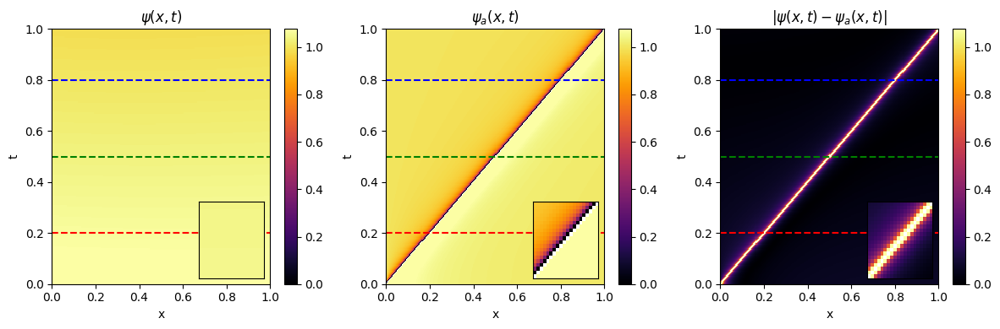

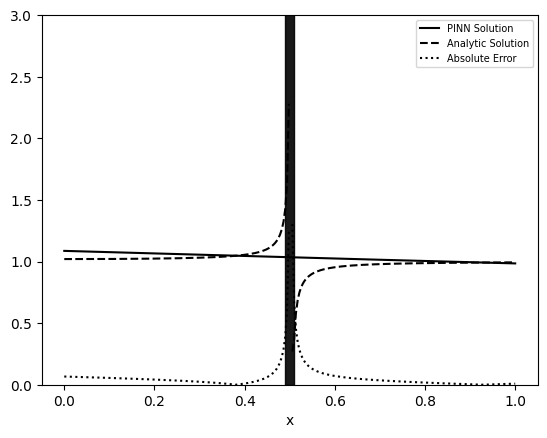

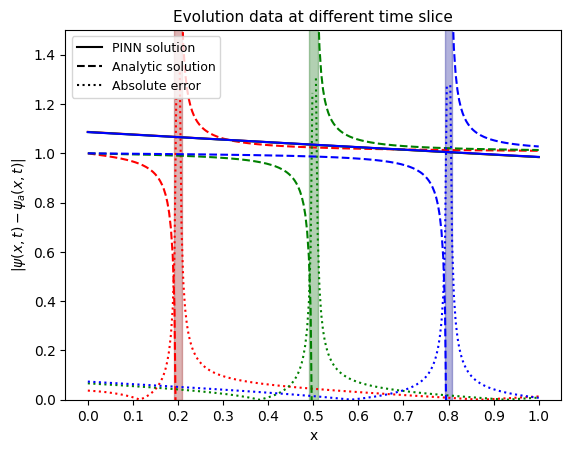

Compiling model...
Building feed-forward neural network...
'build' took 0.033782 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.448405 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [1.11e-02, 6.85e-01, 2.08e-01]    [1.11e-02, 6.85e-01, 2.08e-01]    []  
1000      [2.79e-06, 1.42e-03, 5.55e-06]    [2.79e-06, 1.42e-03, 5.55e-06]    []  
2000      [1.73e-06, 1.42e-03, 7.05e-06]    [1.73e-06, 1.42e-03, 7.05e-06]    []  
3000      [6.47e-07, 6.51e-03, 1.77e-04]    [6.47e-07, 6.51e-03, 1.77e-04]    []  
4000      [1.37e-06, 1.34e-03, 4.42e-05]    [1.37e-06, 1.34e-03, 4.42e-05]    []  
5000      [1.59e-06, 1.35e-03, 4.22e-05]    [1.59e-06, 1.35e-03, 4.22e-05]    []  
6000      [2.58e-06, 1.36e-03, 3.75e-05]    [2.58e-06, 1.36e-03, 3.75e-05]    []  
7000      [2.08e-06, 1.41e-03, 1.98e-05]    [2.08e-06, 1.41e-03, 1.98e-05]    []  
8000      [1.29e-06, 1.36e-03, 3.23e-05]    [1.29e-06, 1.36e-03, 3.23e-05]    []  
9000      [1.67e-06, 1.36e-03, 3.57e-05]    [1.67e-06, 1.36e-03, 3.57e-05]    []  
10000   

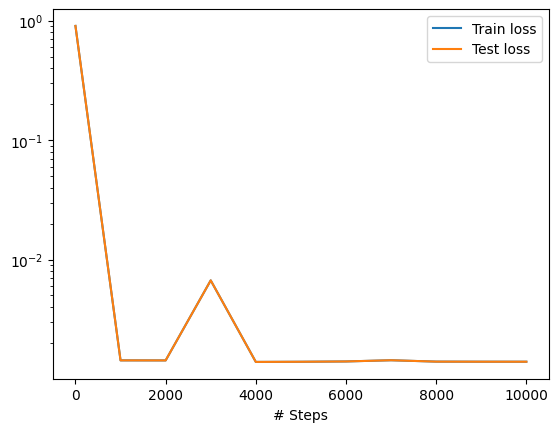

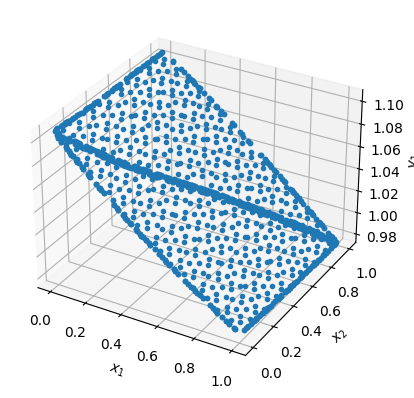

C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


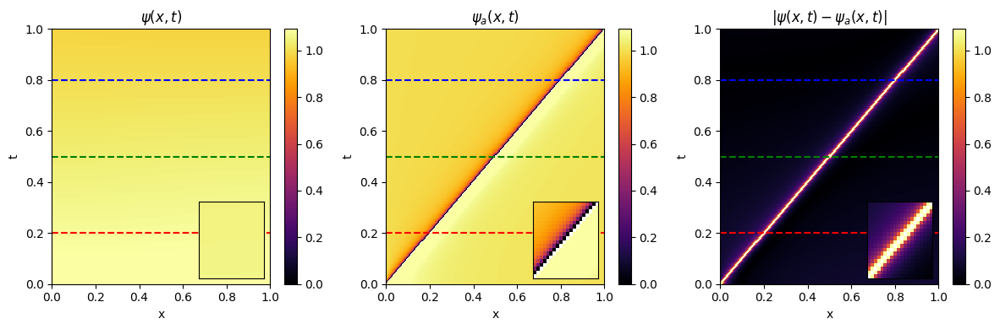

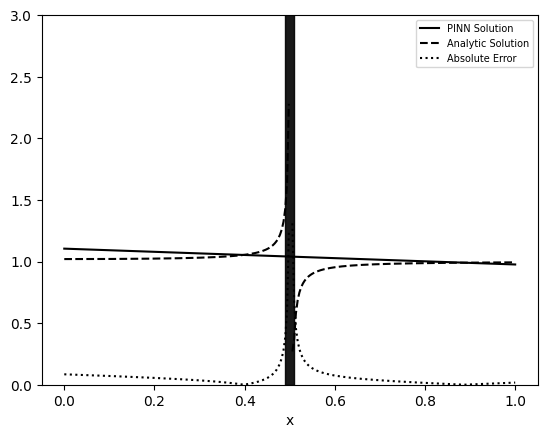

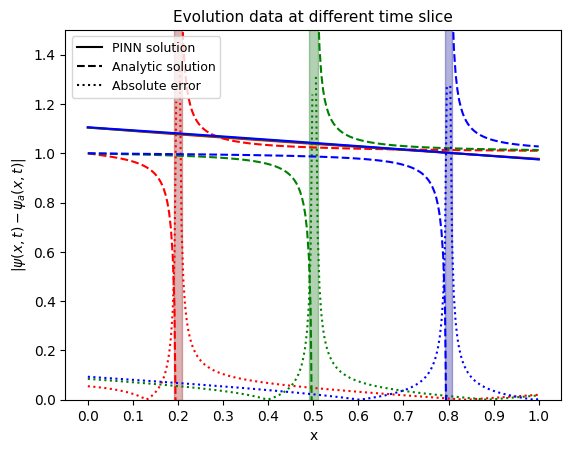

Compiling model...
Building feed-forward neural network...
'build' took 0.051911 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.800003 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [1.16e-02, 1.96e+00, 5.61e-02]    [1.16e-02, 1.96e+00, 5.61e-02]    []  
1000      [2.20e-05, 4.63e-02, 8.72e-04]    [2.20e-05, 4.63e-02, 8.72e-04]    []  
2000      [3.02e-05, 4.62e-02, 9.21e-04]    [3.02e-05, 4.62e-02, 9.21e-04]    []  
3000      [3.48e-05, 4.62e-02, 9.31e-04]    [3.48e-05, 4.62e-02, 9.31e-04]    []  
4000      [3.20e-05, 4.62e-02, 9.49e-04]    [3.20e-05, 4.62e-02, 9.49e-04]    []  
5000      [3.24e-05, 4.62e-02, 9.32e-04]    [3.24e-05, 4.62e-02, 9.32e-04]    []  
6000      [3.19e-05, 4.62e-02, 9.44e-04]    [3.19e-05, 4.62e-02, 9.44e-04]    []  
7000      [3.29e-05, 4.62e-02, 9.04e-04]    [3.29e-05, 4.62e-02, 9.04e-04]    []  
8000      [2.56e-05, 4.63e-02, 9.08e-04]    [2.56e-05, 4.63e-02, 9.08e-04]    []  
9000      [3.07e-05, 4.62e-02, 9.43e-04]    [3.07e-05, 4.62e-02, 9.43e-04]    []  
10000   

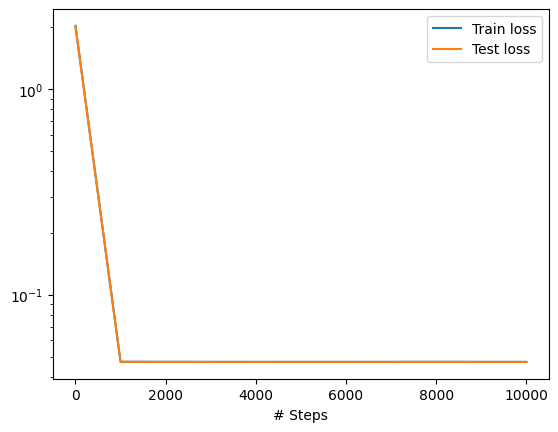

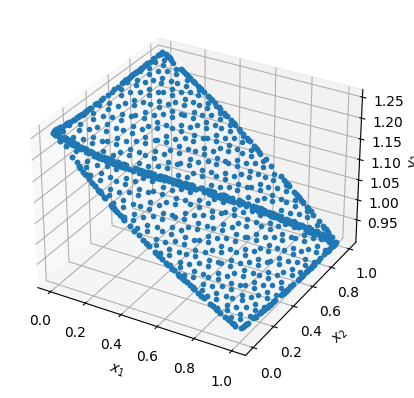

C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_13124\3407551741.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


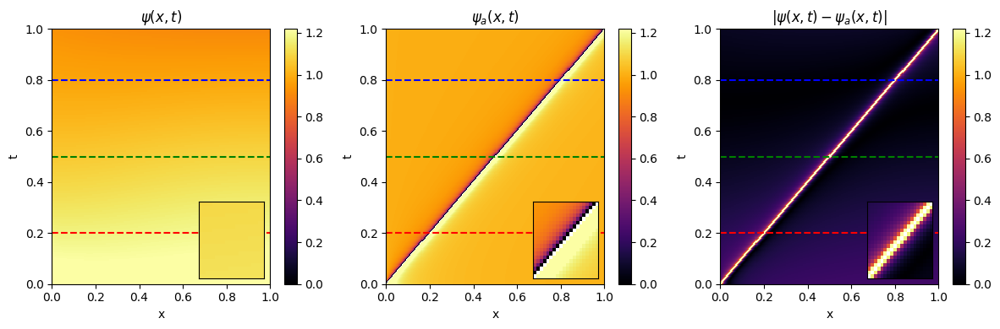

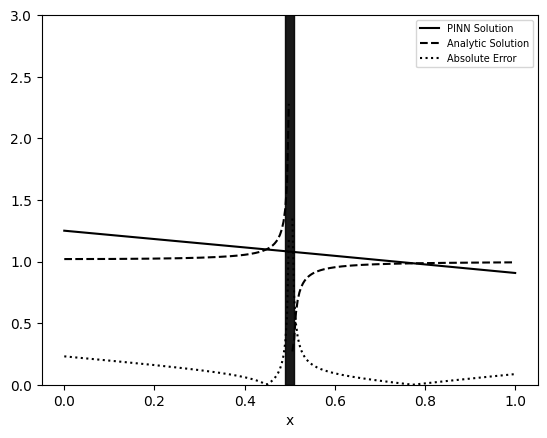

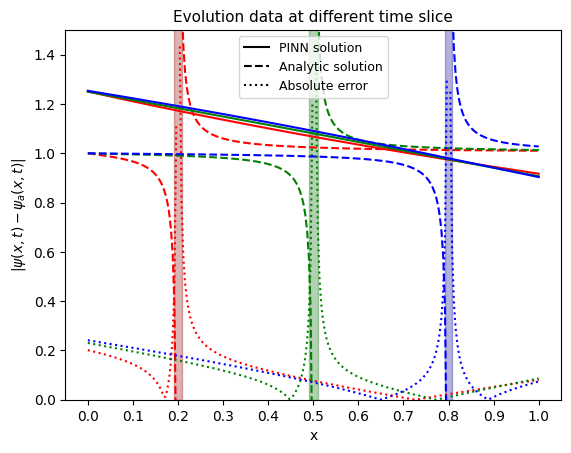

In [22]:

for i in range(10):
    model_t = generate_evolution_model(throat, 500, 500, 10, 1, lr, iterations,0);
    analytic_v_t, v_t, diff_t = plot_evolution_model_sliced(throat, model_t)
    plot_evolution_slice(0.01, 0.5, analytic_v_t, v_t, diff_t)
    
    # Define the x-axis values
    x = np.linspace(0, 1, len(diff_t))
    a = 0.01

    # Create a Figure and Axes
    fig, ax = plt.subplots()

    # Set the threshold value
    threshold = 50

    # Plot for t = 0.2
    t = 0.2
    ax.fill_between(x, 0, 5, where=(x >= t - a) & (x <= t + a), alpha=0.3, color='darkred')
    t = round(t * 255)
    ax.plot(x, v_t.T[:, t],
            'r-')
    ax.plot(x, analytic_v_t.T[:, t],
            'r--')
    ax.plot(x, np.where((abs((v_t.T[:, t] - analytic_v_t[:, t]))) < threshold,
                        (abs((v_t.T[:, t] - analytic_v_t[:, t]))), np.nan),
            'r:')

    # Plot for t = 0.5
    t = 0.5
    ax.fill_between(x, 0, 5, where=(x >= t - a) & (x <= t + a), alpha=0.3, color='darkgreen')
    t = round(t * 255)
    ax.plot(x, v_t.T[:, t],
            'g-')
    ax.plot(x, analytic_v_t.T[:, t],
            'g--')
    ax.plot(x, np.where((abs((v_t.T[:, t] - analytic_v_t[:, t]))) < threshold,
                        (abs((v_t.T[:, t] - analytic_v_t[:, t]))), np.nan),
            'g:')

    # Plot for t = 0.8
    t = 0.8
    ax.fill_between(x, 0, 5, where=(x >= t - a) & (x <= t + a), alpha=0.3, color='darkblue')
    t = round(t * 255)
    ax.plot(x, v_t.T[:, t],
            'b-')
    ax.plot(x, analytic_v_t.T[:, t],
            'b--')
    ax.plot(x, np.where((abs((v_t.T[:, t] - analytic_v_t[:, t]))) < threshold,
                        (abs((v_t.T[:, t] - analytic_v_t[:, t]))), np.nan),
            'b:')
    
    
    ax.plot(x,v_t.T[:, t] + 100, 'k-', label = 'PINN solution')
    
    ax.plot(x,v_t.T[:, t]+100, 'k--', label = 'Analytic solution')
    
    ax.plot(x,v_t.T[:, t]+100, 'k:', label = 'Absolute error')
    

    # Set the title and labels
    ax.set_xlabel("x")
    ax.set_ylabel(r'$|\psi(x,t)-\psi_{a}(x,t)|$')
    ax.set_ylim(0, 1.5)

    # Set ticker on the axis ticks
    ax.set_xticks(np.arange(0, 1.1, 0.1))
    ax.set_yticks(np.arange(0, 1.5, 0.2))

    # Add a legend
    legend = ax.legend(fontsize=9)


    # Set the plot title
    ax.set_title("Evolution data at different time slice", fontsize=11)


    # Show the plot
    plt.show()
    

